In [1]:
import logging
from utility import add_project_root_to_path
from pprint import pprint

logging.basicConfig(level=logging.ERROR)

add_project_root_to_path()

In [2]:
# Building experiments configs

from experiments.configs import DEFAULT_UNINFORMED_USERS_CONFIG
from experiments.experiment import Experiment
from user.informed_user import InformedUser

from fee_algorithm.fixed_fee import FixedFee
from fee_algorithm.discrete_fee_perfect_oracle import DiscreteFeePerfectOracle
from fee_algorithm.based_on_trade_count_fee import BasedOnTradeCountFee
from fee_algorithm.adaptive_fee_based_on_block_price_move import (
    AdaptiveBasedOnPreviousBlockPriceMoveFee,
)
from experiments.run_multiple_experiments import (
    get_experiment_key,
)
from fee_algorithm.dynamic_fee_amm_for_amm import AMMforAMMfee
from fee_algorithm.improved_fees.piecewise_fee import PiecewiseFee
from fee_algorithm.improved_fees.fixed_fee import ImprovedFixedFee

from copy import deepcopy

fee_algos_to_consider = {
    "fixed_fee": FixedFee(exchange_fee_rate=0.003),  # 30 bps
    "based_on_trade_count_fee": BasedOnTradeCountFee(
        a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
    ),  # 30 bps
    "adaptive_based_on_previous_block_price_move_fee": AdaptiveBasedOnPreviousBlockPriceMoveFee(
        a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
    ),  # 30 bps
    "discrete_fee_perfect_oracle": DiscreteFeePerfectOracle(
        fee_rate_in_arbitrage_direction=0.0045,
        fee_rate_in_non_arbitrage_direction=0.0015,
    ),  # 45/15 bps
    "AMM_fee": AMMforAMMfee(
        a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
    ),
    # "IMPROVED_FX_fee": ImprovedFixedFee(),
    "IMPROVED_FX_fee": PiecewiseFee(base_algorithm=FixedFee(exchange_fee_rate=0.003)),
    "IMPROVED_DA_fee": PiecewiseFee(
        base_algorithm=BasedOnTradeCountFee(
            a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
        )
    ),
    "IMPROVED_BA_fee": PiecewiseFee(
        base_algorithm=AdaptiveBasedOnPreviousBlockPriceMoveFee(
            a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
        )
    ),
    "IMPROVED_AMM_fee": PiecewiseFee(
        base_algorithm=AMMforAMMfee(
            a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
        )
    ),
    "IMPROVED_OB_fee": PiecewiseFee(
        base_algorithm=DiscreteFeePerfectOracle(
            fee_rate_in_arbitrage_direction=0.0045,
            fee_rate_in_non_arbitrage_direction=0.0015,
        )
    ),
}

In [3]:
from pathlib import Path

# Pairs grouped by type. Each entry: (csv_file_prefix, display_name).
#
# Group 1: stable/stable  – both assets are USD stablecoins
# Group 2: non-stable/stable  – two volatile assets, both priced in USDT
# Group 3: non-stable/non-stable – two volatile assets (different from group 2
#           but also USDT-priced; all downloaded at 12 s cadence)
PAIRS_BY_GROUP = {
    "stable_stable": [
        ("TUSDUSDT_USDCUSDT", "TUSD-USDC"),
        ("TUSDUSDT_USDPUSDT", "TUSD-USDP"),
        ("USDCUSDT_USDPUSDT", "USDC-USDP"),
    ],
    "non_stable_stable": [
        ("USDCUSDT_RADUSDT", "USDC-RAD"),
        ("ETHUSDT_USDT", "ETH-USDT"),
        ("BTCUSDT_USDT", "BTC-USDT"),
        # ("BTCUSDT_ETHUSDT", "BTC-ETH"),
        # ("BTCUSDT_BNBUSDT", "BTC-BNB"),
        # ("ETHUSDT_BNBUSDT", "ETH-BNB"),
    ],
    "non_stable_non_stable": [
        ("BTCUSDT_ETHUSDT", "ETH-BTC"),
        ("ETHUSDT_BNBUSDT", "BNB-ETH"),
        ("DOGEUSDT_BTCUSDT", "DOGE-BTC"),
    ],
}

MONTHS = ["2024-03", "2024-04", "2024-08", "2024-11"]
MONTH_ALIAS = {
    "2024-03": "volatile_market",
    "2024-04": "bear_market",
    "2024-08": "calm_market",
    "2024-11": "bull_market",
}

DATA_DIR = Path("data/new_data")

# Flat mapping:  period_alias  ->  metadata dict
DATA_SOURCE_BY_ALIAS = {}
for _group_name, _pairs in PAIRS_BY_GROUP.items():
    for _csv_prefix, _pair_name in _pairs:
        for _month in MONTHS:
            _alias = f"{_pair_name} {MONTH_ALIAS[_month]}"
            DATA_SOURCE_BY_ALIAS[_alias] = {
                "csv_path": DATA_DIR / f"{_csv_prefix}-12s-{_month}.csv",
                "group": _group_name,
                "pair": _pair_name,
                "month": _month,
                "period_alias": MONTH_ALIAS[_month],
            }

print(f"Total period aliases: {len(DATA_SOURCE_BY_ALIAS)}")
for _alias, _src in list(DATA_SOURCE_BY_ALIAS.items())[:4]:
    print(f"  {_alias!r} -> {_src['csv_path']}")

Total period aliases: 36
  'TUSD-USDC volatile_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-03.csv
  'TUSD-USDC bear_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-04.csv
  'TUSD-USDC calm_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-08.csv
  'TUSD-USDC bull_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-11.csv


In [4]:
experiment_configs = {}

for period_alias, source in DATA_SOURCE_BY_ALIAS.items():
    for fee_algo_alias, fee_algo in fee_algos_to_consider.items():
        experiment_configs[
            get_experiment_key(
                {
                    "period_alias": period_alias,
                    "fee_algorithm": fee_algo_alias,
                }
            )
        ] = (
            str(source["csv_path"]),
            Experiment(
                data=None,
                fee_algorithm=deepcopy(fee_algo),
                uninformed_users=deepcopy(DEFAULT_UNINFORMED_USERS_CONFIG),
                informed_user=InformedUser(),
                lp_metrics_price_source="pool",
            ),
        )

In [5]:
print(f"Total experiments to run: {len(experiment_configs)}")

Total experiments to run: 360


In [6]:
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm import tqdm
from experiments.run_experiment_from_csv import run_experiment_from_csv

# Use only the first 7 days of each monthly CSV (12 s candles).
# 7 days × 24 h × 3600 s / 12 s = 50 400 rows — comparable in scale to
# the 7-day 1-min segments used in fee_algorithms_comparison.ipynb.
FIRST_WEEK_ROWS = 7 * 24 * 3600 // 12  # = 50 400

# Keep only every N-th snapshot for time-series plots to avoid OOM.
# 720 steps × 12 s = one data point per ~2.4 hours (~70 points per week).
SNAPSHOT_EVERY_N = 720

experiment_results = {}

with ProcessPoolExecutor(max_workers=10) as executor:
    future_to_key = {
        executor.submit(
            run_experiment_from_csv,
            csv_path,
            experiment,
            True,  # return_intermediate_results
            FIRST_WEEK_ROWS,  # max_rows – first week only
            SNAPSHOT_EVERY_N,  # snapshot_every_n – subsample to save memory
        ): key
        for key, (csv_path, experiment) in experiment_configs.items()
    }
    for future in tqdm(
        as_completed(future_to_key),
        total=len(future_to_key),
        desc="Running Experiments",
    ):
        key = future_to_key[future]
        try:
            experiment_results[key] = future.result()
        except Exception as e:
            print(f"Error: {e}  key={dict(key)}")

Running Experiments: 100%|██████████| 360/360 [05:35<00:00,  1.07it/s]


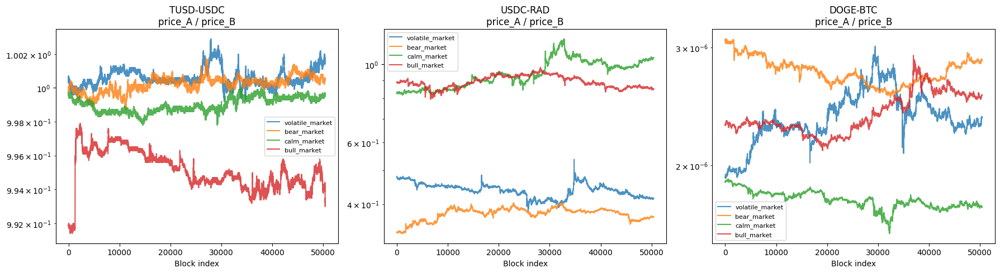

In [7]:
import matplotlib.pyplot as plt

# Price ratio chart – one representative pair per group
SAMPLE_PAIRS = {
    "stable_stable": "TUSD-USDC",
    "non_stable_stable": "USDC-RAD",
    "non_stable_non_stable": "DOGE-BTC",
}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (group, pair_name) in zip(axes, SAMPLE_PAIRS.items()):
    for month_alias in MONTH_ALIAS.values():
        alias = f"{pair_name} {month_alias}"
        key = get_experiment_key({"period_alias": alias, "fee_algorithm": "fixed_fee"})
        if key not in experiment_results:
            continue
        data = experiment_results[key].data
        ratio = data["price_A"] / data["price_B"]
        ax.plot(ratio.values, label=month_alias, alpha=0.8)
    ax.set_title(f"{pair_name}\nprice_A / price_B")
    ax.set_xlabel("Block index")
    ax.set_yscale("log")
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [8]:
import os
from pathlib import Path
from visualizations.compare_fee_algoritms import (
    plot_participants_markouts,
    plot_impermanent_loss,
    get_experiments_summary_by_alias,
    export_markouts_to_csv,
    plot_participants_yield,
    export_yields_to_csv,
)


def plot_results_for_period(
    period_alias: str, fee_algos: list[str], export_csv: bool = True
):
    map_by_fee_algo = {
        fee_algo_alias: experiment_results[
            get_experiment_key(
                {
                    "period_alias": period_alias,
                    "fee_algorithm": fee_algo_alias,
                }
            )
        ]
        for fee_algo_alias in fee_algos
        if get_experiment_key(
            {"period_alias": period_alias, "fee_algorithm": fee_algo_alias}
        )
        in experiment_results
    }
    plot_participants_markouts(period_alias, map_by_fee_algo)
    plot_impermanent_loss(period_alias, map_by_fee_algo)
    # plot_participants_yield(period_alias, map_by_fee_algo)
    export_markouts_to_csv(
        period_alias, map_by_fee_algo, output_dir=Path("csv_export/historical_data")
    )
    # export_yields_to_csv(
    #     period_alias, map_by_fee_algo, output_dir=Path("csv_export/historical_data")
    # )

    summary = get_experiments_summary_by_alias(map_by_fee_algo)
    display(summary)
    # if export_csv:
    #     export_dir = Path("csv_export/historical_data")
    #     export_dir.mkdir(parents=True, exist_ok=True)
    #     safe_alias = period_alias.replace("/", "_").replace(" ", "_")
    #     csv_path = export_dir / f"{safe_alias}.csv"
    #     summary.to_csv(csv_path, index=False)
    #     print(f"Exported: {csv_path}")

### Results: Stable / Stable

#### TUSD/USDC

##### bull_market

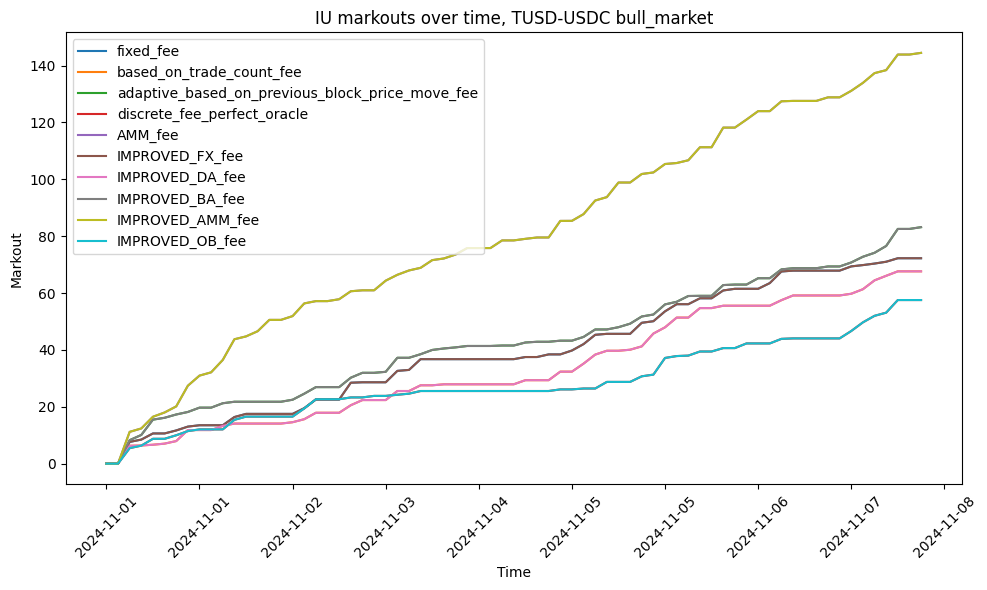

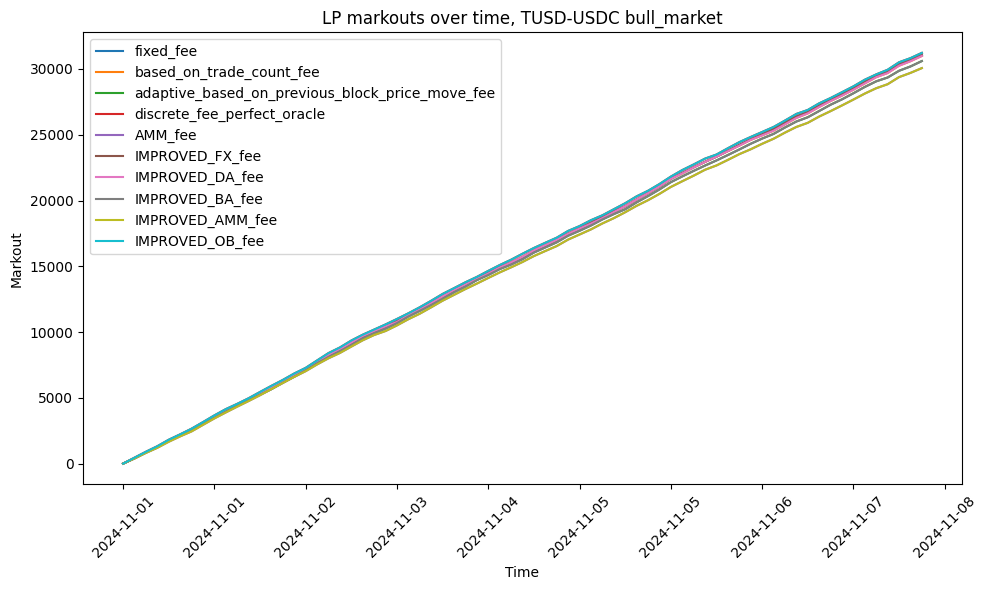

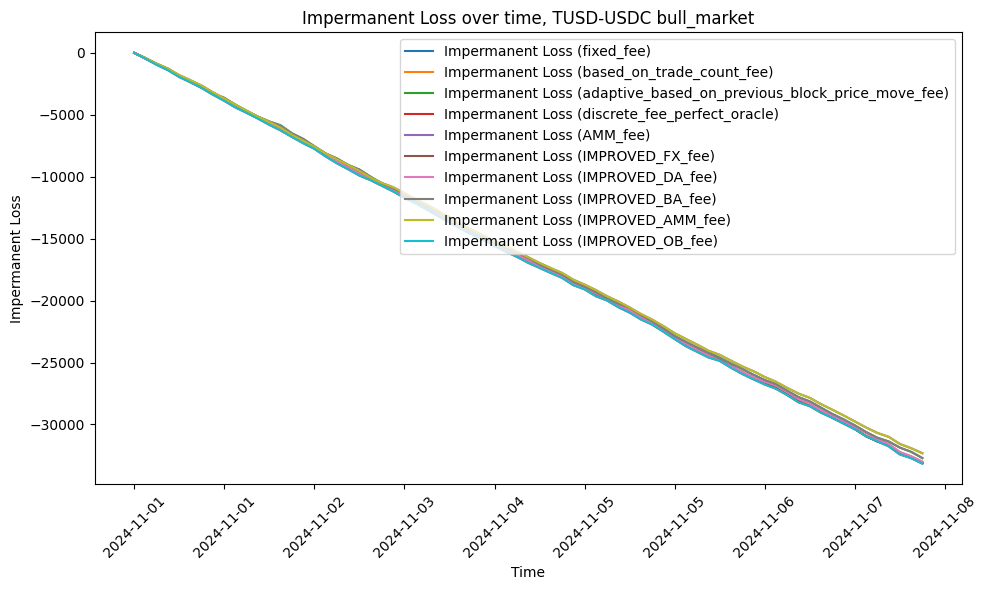

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,72.24,67,1.24,-59585.37,5235,-57.07,31078.71,28.19,-33104.45
1,based_on_trade_count_fee,67.63,65,1.20,-59438.43,5224,-57.06,30991.11,28.22,-33005.10
2,adaptive_based_on_previous_block_price_move_fee,83.17,89,1.09,-59313.77,5228,-56.90,30603.46,27.35,-32714.40
3,discrete_fee_perfect_oracle,57.54,53,1.25,-59567.43,5238,-57.02,31224.97,28.62,-33161.64
4,AMM_fee,144.47,100,1.61,-58977.55,5215,-56.70,30067.48,26.62,-32324.11
5,IMPROVED_FX_fee,72.24,67,1.24,-59585.37,5235,-57.07,31078.71,28.19,-33104.45
6,IMPROVED_DA_fee,67.63,65,1.20,-59438.43,5224,-57.06,30991.11,28.22,-33005.10
7,IMPROVED_BA_fee,83.17,89,1.09,-59313.77,5228,-56.90,30603.46,27.35,-32714.40
8,IMPROVED_AMM_fee,144.47,100,1.61,-58977.55,5215,-56.70,30067.48,26.62,-32324.11
9,IMPROVED_OB_fee,57.54,53,1.25,-59567.43,5238,-57.02,31224.97,28.62,-33161.64


In [9]:
plot_results_for_period(
    "TUSD-USDC bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

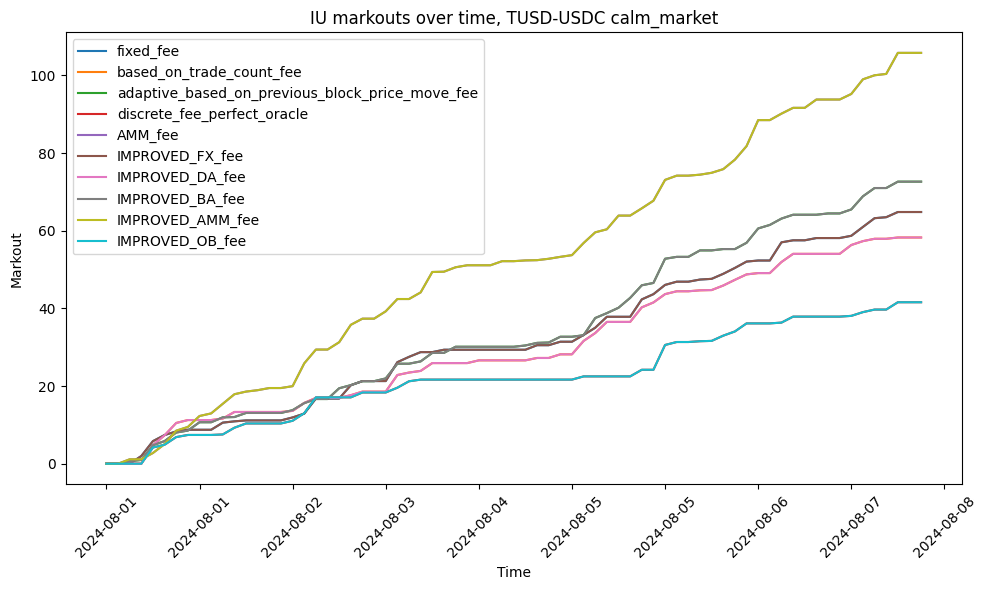

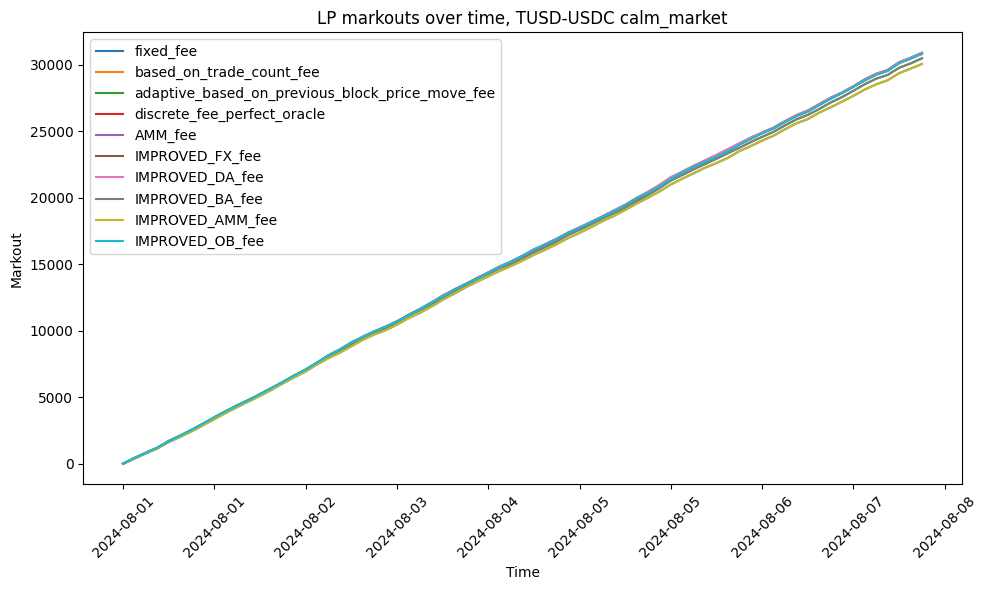

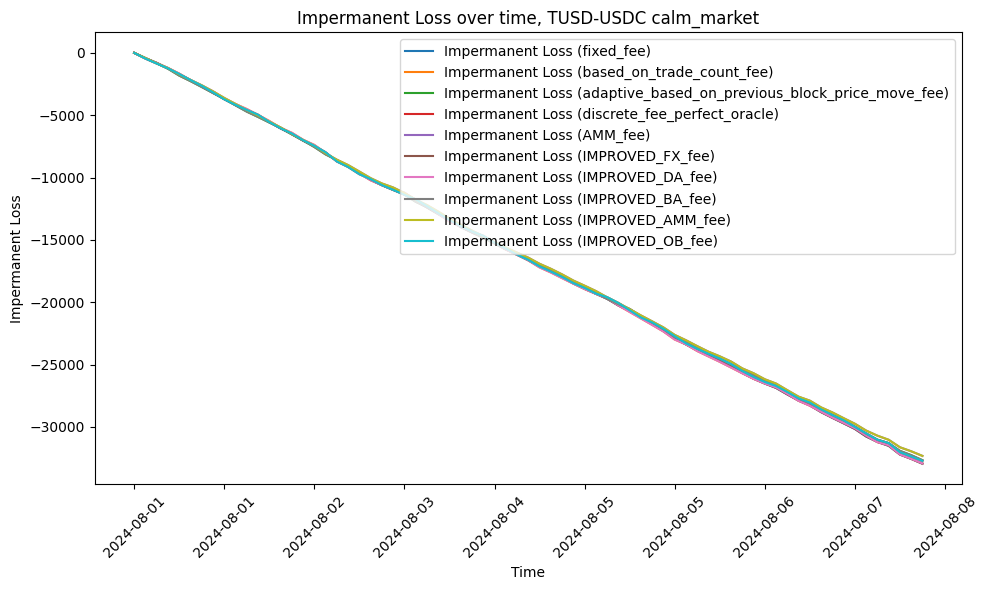

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,64.82,63,1.19,-59464.13,5226,-57.12,30908.66,28.21,-32949.35
1,based_on_trade_count_fee,58.26,62,1.09,-59473.76,5230,-57.08,30912.22,28.22,-32925.85
2,adaptive_based_on_previous_block_price_move_fee,72.64,84,1.01,-59298.30,5233,-56.89,30502.80,27.37,-32668.18
3,discrete_fee_perfect_oracle,41.59,45,1.07,-59184.19,5222,-56.89,30839.38,28.58,-32724.15
4,AMM_fee,105.81,102,1.20,-59070.43,5225,-56.75,30070.66,26.62,-32323.47
5,IMPROVED_FX_fee,64.82,63,1.19,-59464.13,5226,-57.12,30908.66,28.21,-32949.35
6,IMPROVED_DA_fee,58.26,62,1.09,-59473.76,5230,-57.08,30912.22,28.22,-32925.85
7,IMPROVED_BA_fee,72.64,84,1.01,-59298.30,5233,-56.89,30502.80,27.37,-32668.18
8,IMPROVED_AMM_fee,105.81,102,1.20,-59070.43,5225,-56.75,30070.66,26.62,-32323.47
9,IMPROVED_OB_fee,41.59,45,1.07,-59184.19,5222,-56.89,30839.38,28.58,-32724.15


In [11]:
plot_results_for_period(
    "TUSD-USDC calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

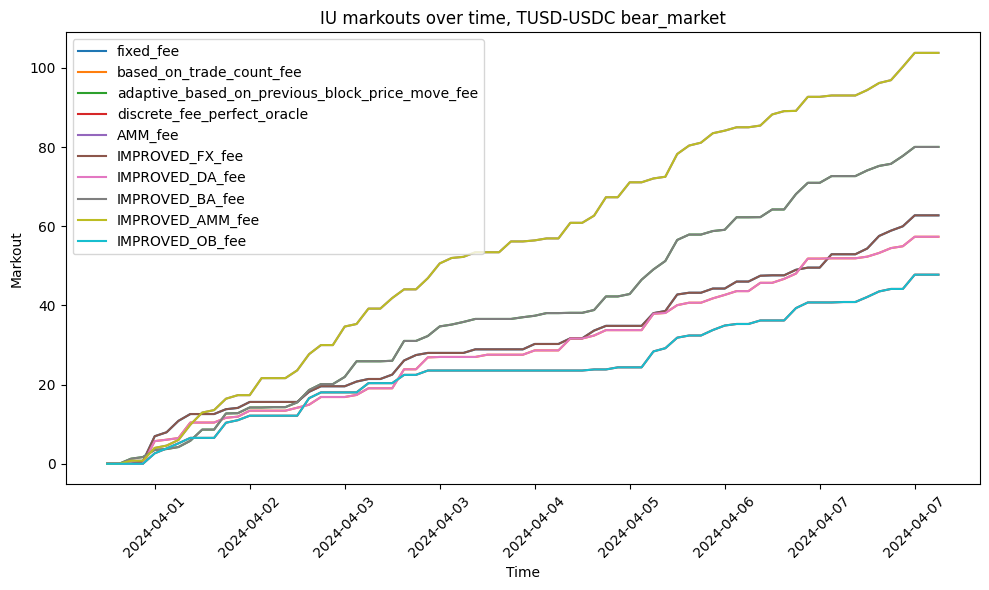

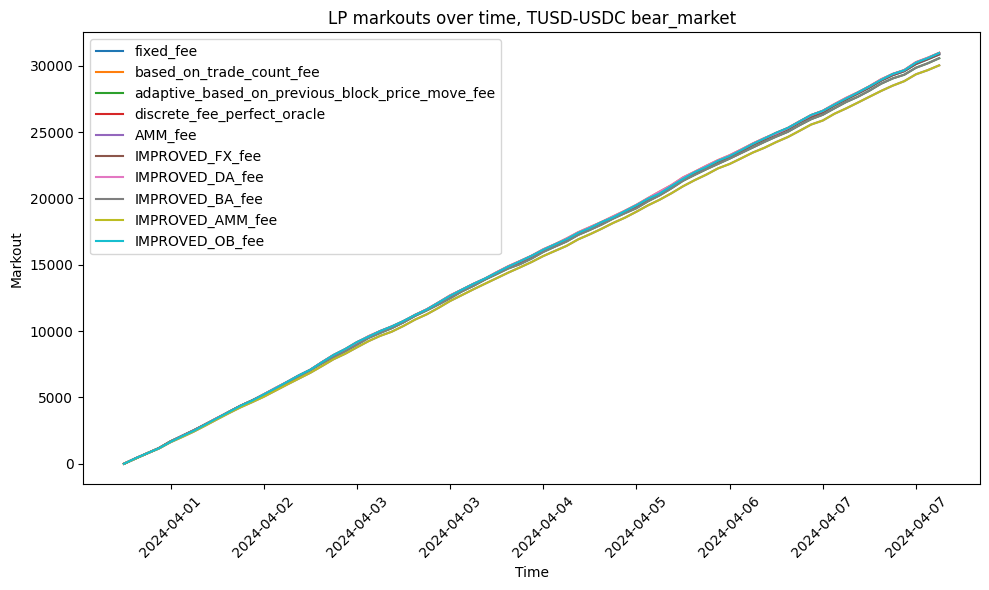

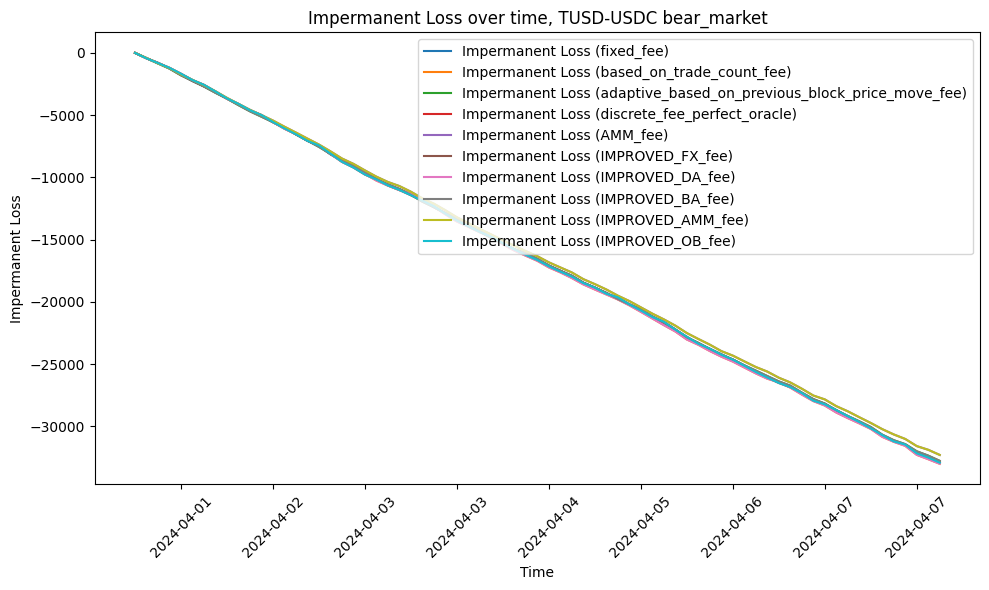

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,62.75,59,1.22,-59365.73,5228,-56.99,30849.62,28.22,-32901.02
1,based_on_trade_count_fee,57.34,62,1.08,-59581.09,5237,-57.10,30965.57,28.23,-33009.77
2,adaptive_based_on_previous_block_price_move_fee,80.03,89,1.05,-59414.07,5229,-57.05,30563.84,27.34,-32775.67
3,discrete_fee_perfect_oracle,47.77,49,1.13,-59385.56,5232,-56.98,30960.31,28.55,-32922.81
4,AMM_fee,103.79,97,1.23,-59014.41,5233,-56.59,30026.96,26.64,-32298.93
5,IMPROVED_FX_fee,62.75,59,1.22,-59365.73,5228,-56.99,30849.62,28.22,-32901.02
6,IMPROVED_DA_fee,57.34,62,1.08,-59581.09,5237,-57.10,30965.57,28.23,-33009.77
7,IMPROVED_BA_fee,80.03,89,1.05,-59414.07,5229,-57.05,30563.84,27.34,-32775.67
8,IMPROVED_AMM_fee,103.79,97,1.23,-59014.41,5233,-56.59,30026.96,26.64,-32298.93
9,IMPROVED_OB_fee,47.77,49,1.13,-59385.56,5232,-56.98,30960.31,28.55,-32922.81


In [12]:
plot_results_for_period(
    "TUSD-USDC bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

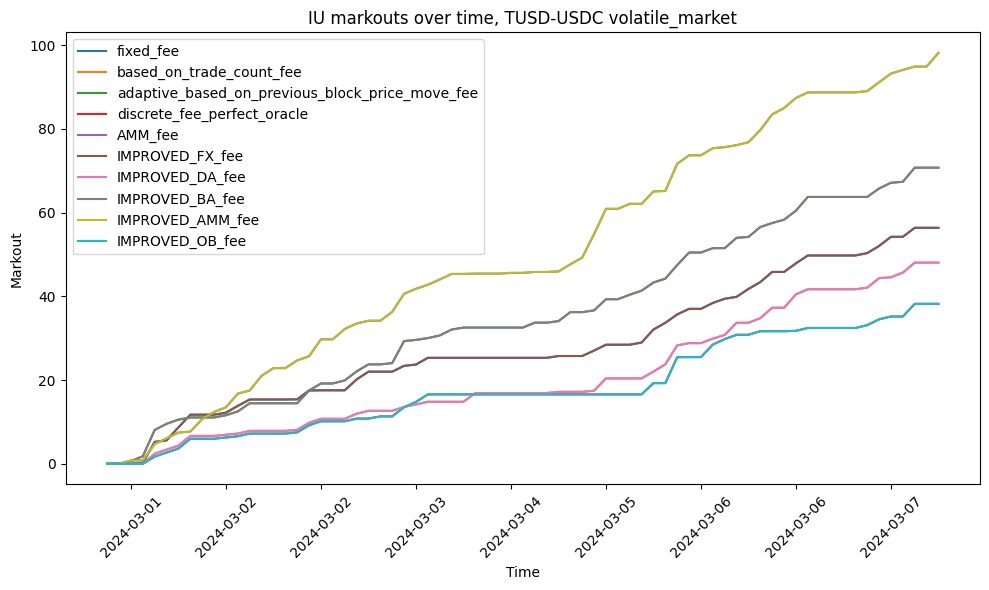

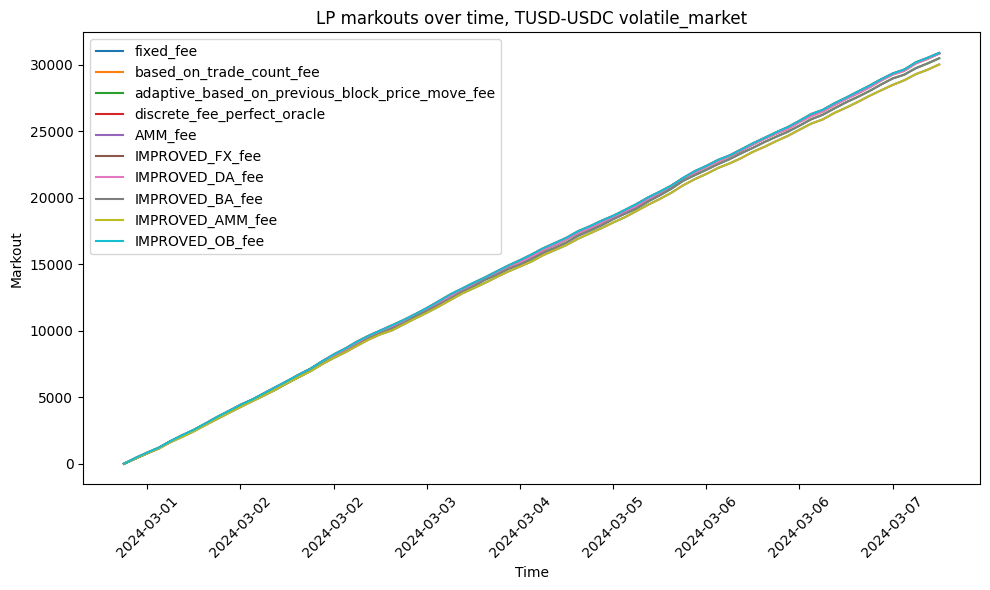

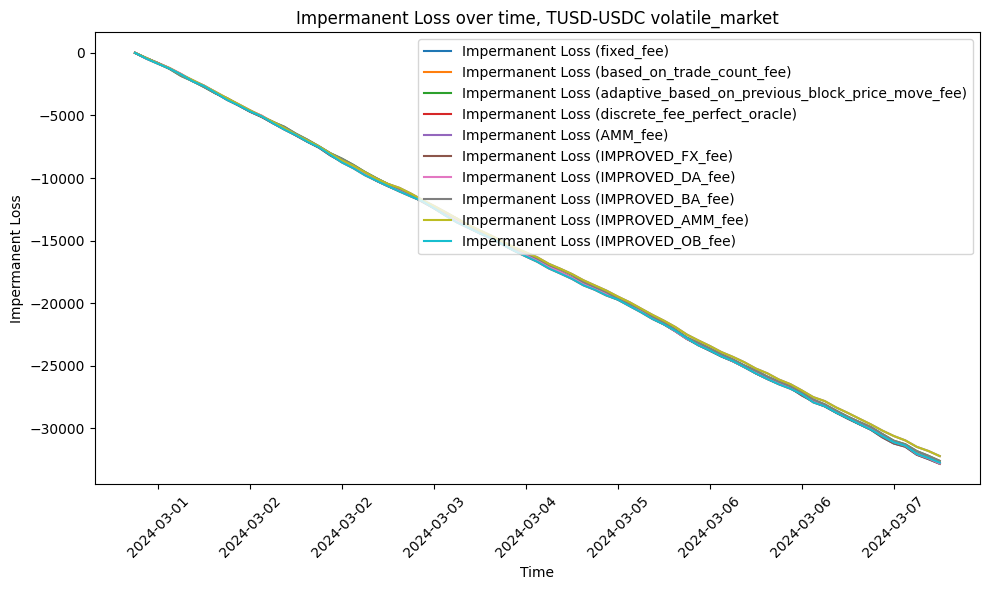

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,56.39,60,1.09,-59352.24,5224,-57.01,30841.92,28.23,-32836.18
1,based_on_trade_count_fee,48.07,60,0.94,-59273.66,5220,-56.98,30826.94,28.25,-32810.13
2,adaptive_based_on_previous_block_price_move_fee,70.75,84,0.99,-59205.32,5227,-56.86,30472.37,27.38,-32604.72
3,discrete_fee_perfect_oracle,38.22,46,0.97,-59161.90,5222,-56.86,30877.56,28.59,-32751.04
4,AMM_fee,98.19,97,1.17,-58953.93,5231,-56.55,30010.63,26.64,-32222.26
5,IMPROVED_FX_fee,56.39,60,1.09,-59352.24,5224,-57.01,30841.92,28.23,-32836.18
6,IMPROVED_DA_fee,48.07,60,0.94,-59273.66,5220,-56.98,30826.94,28.25,-32810.13
7,IMPROVED_BA_fee,70.75,84,0.99,-59205.32,5227,-56.86,30472.37,27.38,-32604.72
8,IMPROVED_AMM_fee,98.19,97,1.17,-58953.93,5231,-56.55,30010.63,26.64,-32222.26
9,IMPROVED_OB_fee,38.22,46,0.97,-59161.90,5222,-56.86,30877.56,28.59,-32751.04


In [15]:
plot_results_for_period(
    "TUSD-USDC volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### TUSD/USDP

##### bull_market

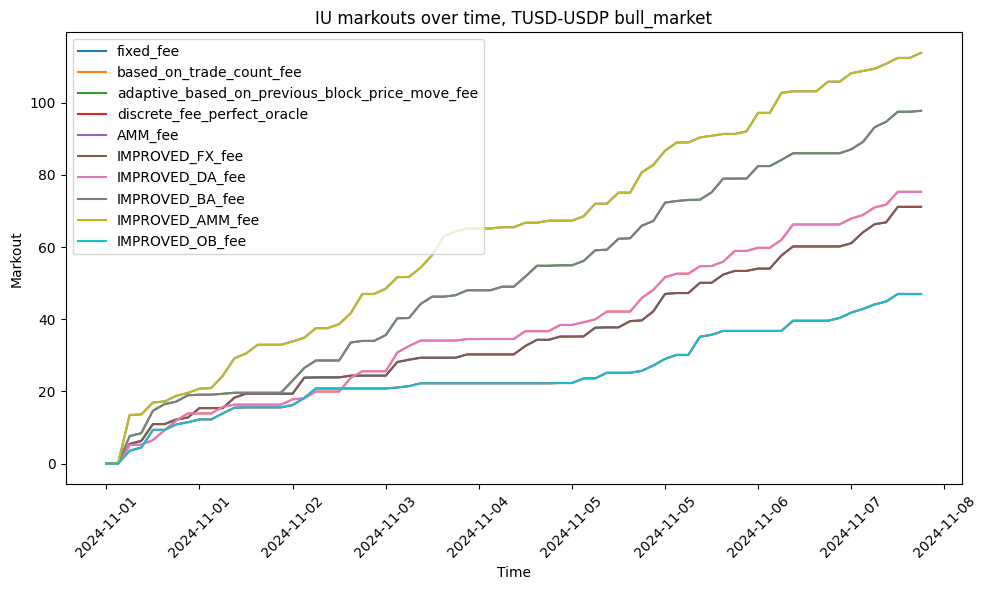

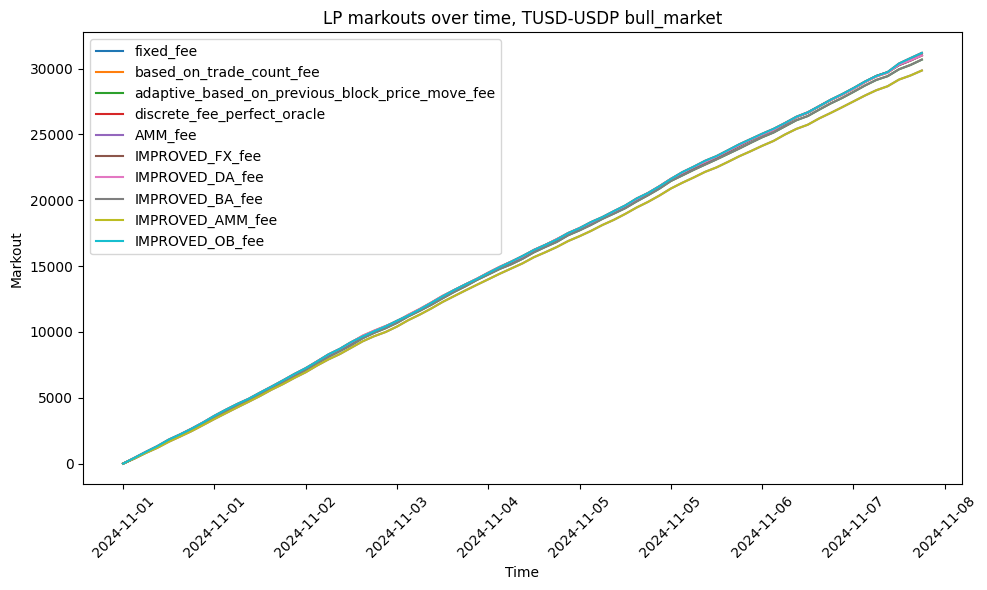

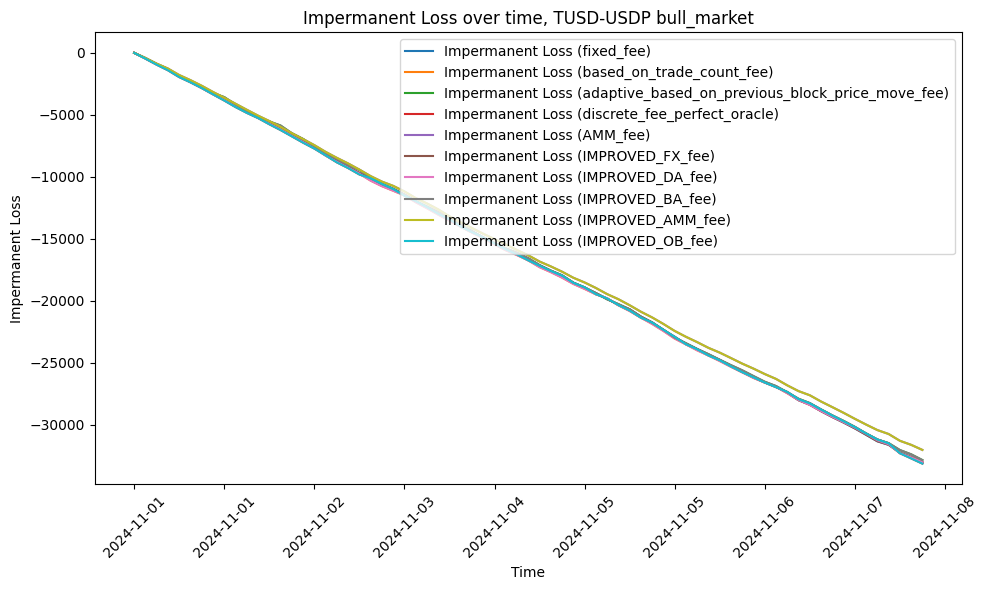

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,71.14,65,1.25,-59464.77,5230,-57.01,31009.94,28.20,-33041.13
1,based_on_trade_count_fee,75.30,63,1.36,-59470.98,5229,-57.02,30998.55,28.22,-33025.94
2,adaptive_based_on_previous_block_price_move_fee,97.74,91,1.23,-59430.25,5230,-56.98,30686.53,27.35,-32858.98
3,discrete_fee_perfect_oracle,47.00,52,1.05,-59465.82,5231,-56.99,31197.60,28.67,-33145.88
4,AMM_fee,113.80,88,1.46,-58611.81,5214,-56.37,29858.20,26.72,-32039.64
5,IMPROVED_FX_fee,71.14,65,1.25,-59464.77,5230,-57.01,31009.94,28.20,-33041.13
6,IMPROVED_DA_fee,75.30,63,1.36,-59470.98,5229,-57.02,30998.55,28.22,-33025.94
7,IMPROVED_BA_fee,97.74,91,1.23,-59430.25,5230,-56.98,30686.53,27.35,-32858.98
8,IMPROVED_AMM_fee,113.80,88,1.46,-58611.81,5214,-56.37,29858.20,26.72,-32039.64
9,IMPROVED_OB_fee,47.00,52,1.05,-59465.82,5231,-56.99,31197.60,28.67,-33145.88


In [13]:
plot_results_for_period(
    "TUSD-USDP bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

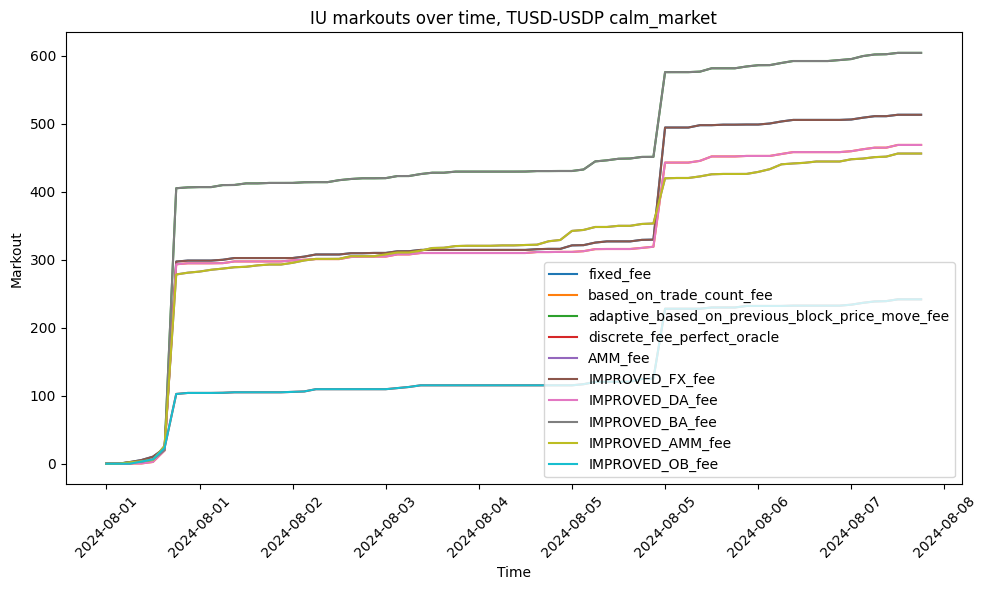

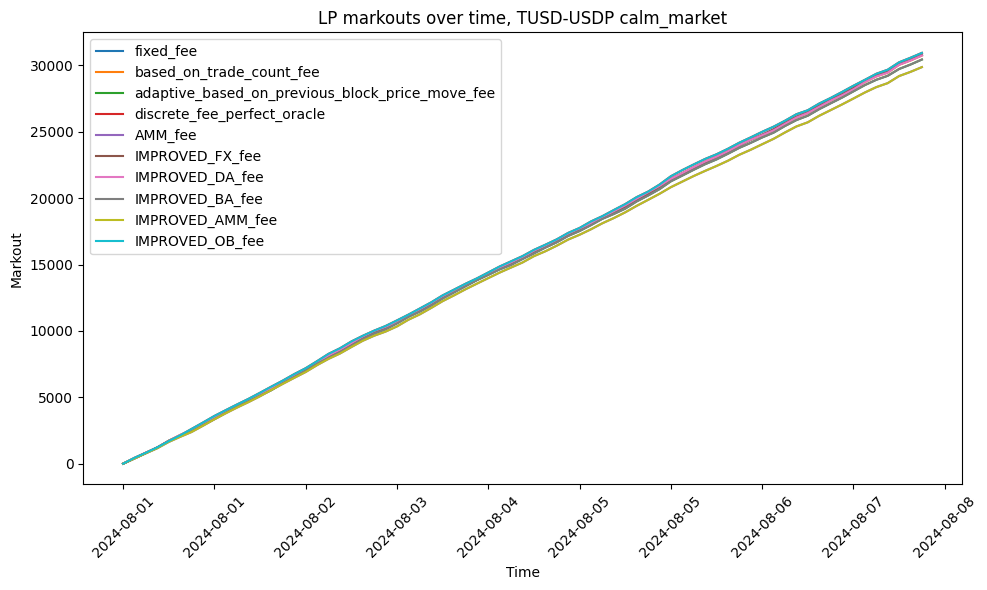

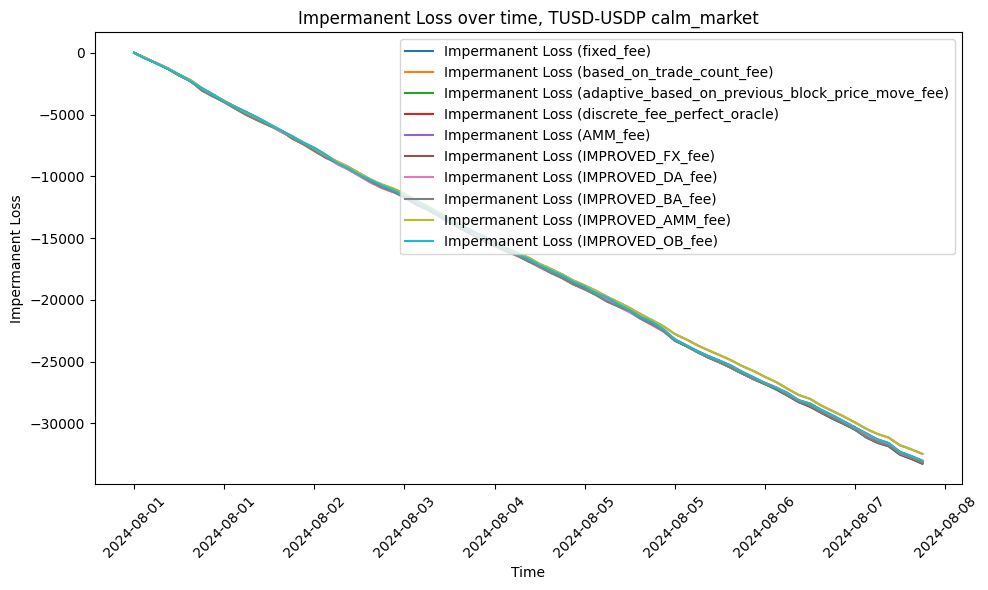

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,513.28,60,7.94,-59196.06,5234,-56.82,30792.16,27.83,-33270.28
1,based_on_trade_count_fee,468.89,57,7.72,-59171.35,5232,-56.81,30738.72,27.89,-33150.17
2,adaptive_based_on_previous_block_price_move_fee,604.32,90,6.65,-59235.44,5226,-56.94,30436.92,26.91,-33156.23
3,discrete_fee_perfect_oracle,241.79,41,5.62,-59099.43,5236,-56.69,30938.47,28.50,-33027.26
4,AMM_fee,456.24,100,4.67,-58797.28,5215,-56.64,29866.03,26.30,-32474.78
5,IMPROVED_FX_fee,513.28,60,7.94,-59196.06,5234,-56.82,30792.16,27.83,-33270.28
6,IMPROVED_DA_fee,468.89,57,7.72,-59171.35,5232,-56.81,30738.72,27.89,-33150.17
7,IMPROVED_BA_fee,604.32,90,6.65,-59235.44,5226,-56.94,30436.92,26.91,-33156.23
8,IMPROVED_AMM_fee,456.24,100,4.67,-58797.28,5215,-56.64,29866.03,26.30,-32474.78
9,IMPROVED_OB_fee,241.79,41,5.62,-59099.43,5236,-56.69,30938.47,28.50,-33027.26


In [16]:
plot_results_for_period(
    "TUSD-USDP calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

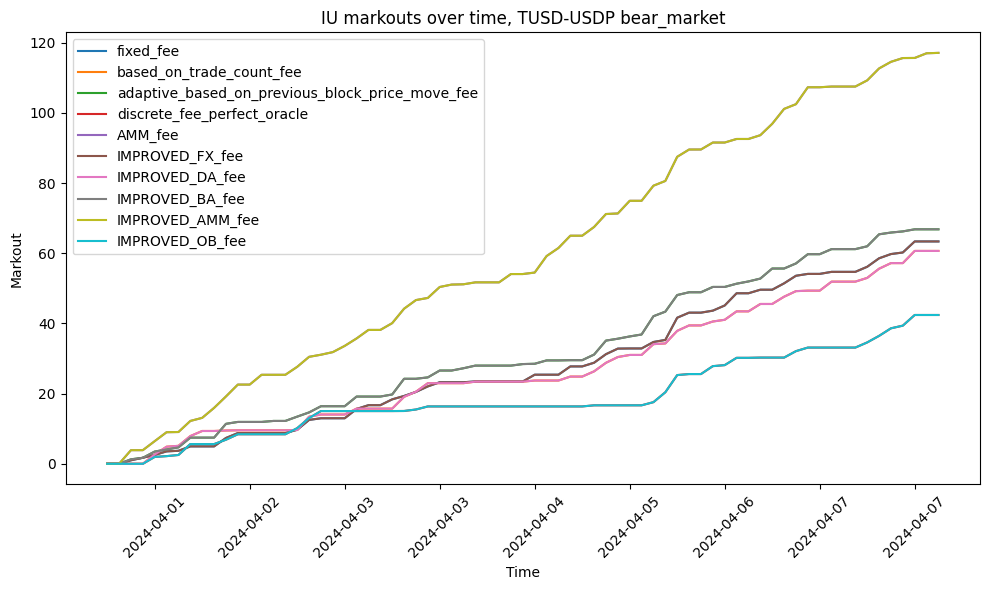

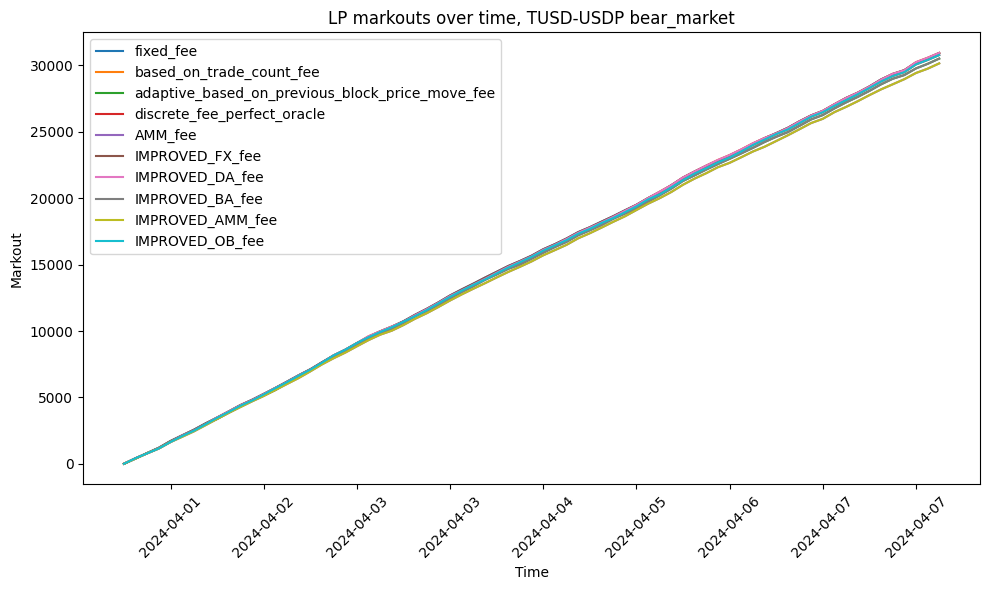

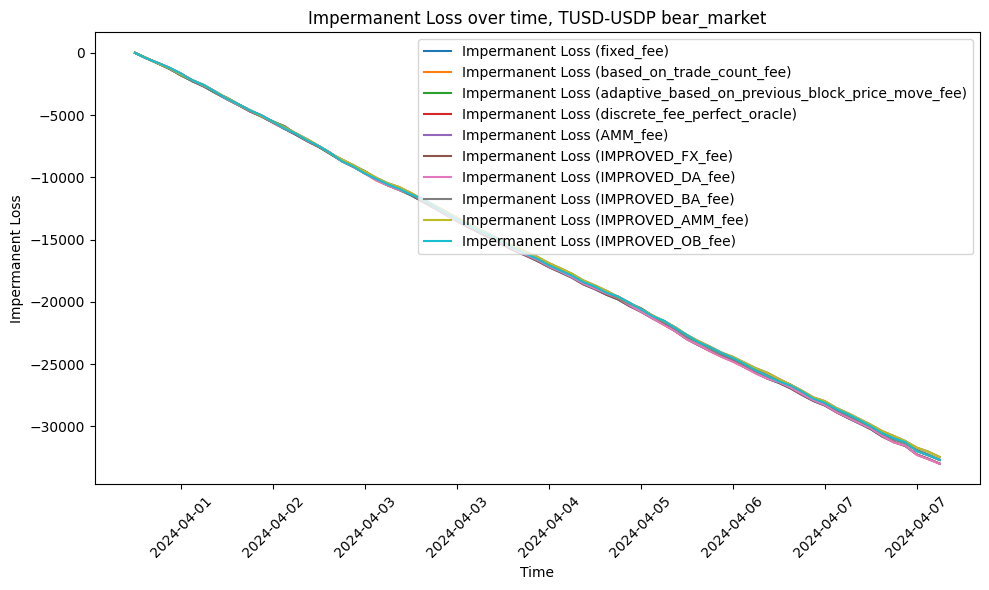

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,63.37,64,1.14,-59471.73,5227,-57.11,30935.74,28.21,-32999.77
1,based_on_trade_count_fee,60.66,64,1.10,-59503.87,5225,-57.15,30948.71,28.23,-33012.38
2,adaptive_based_on_previous_block_price_move_fee,66.83,86,0.92,-59293.22,5229,-56.92,30518.54,27.38,-32699.31
3,discrete_fee_perfect_oracle,42.41,45,1.09,-59198.10,5233,-56.78,30785.68,28.47,-32705.68
4,AMM_fee,117.11,104,1.29,-59203.68,5231,-56.80,30158.26,26.61,-32469.52
5,IMPROVED_FX_fee,63.37,64,1.14,-59471.73,5227,-57.11,30935.74,28.21,-32999.77
6,IMPROVED_DA_fee,60.66,64,1.10,-59503.87,5225,-57.15,30948.71,28.23,-33012.38
7,IMPROVED_BA_fee,66.83,86,0.92,-59293.22,5229,-56.92,30518.54,27.38,-32699.31
8,IMPROVED_AMM_fee,117.11,104,1.29,-59203.68,5231,-56.80,30158.26,26.61,-32469.52
9,IMPROVED_OB_fee,42.41,45,1.09,-59198.10,5233,-56.78,30785.68,28.47,-32705.68


In [17]:
plot_results_for_period(
    "TUSD-USDP bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

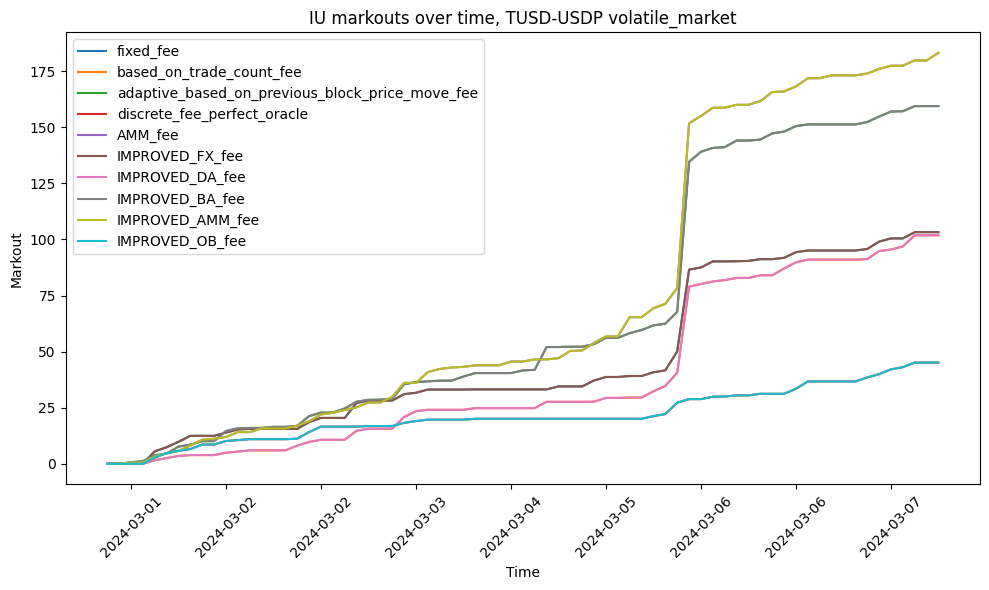

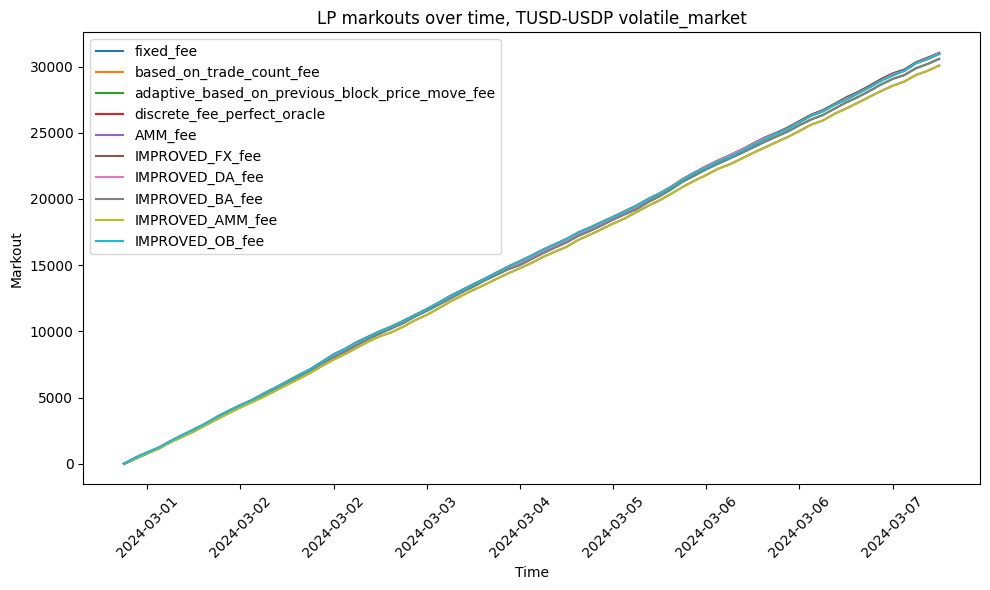

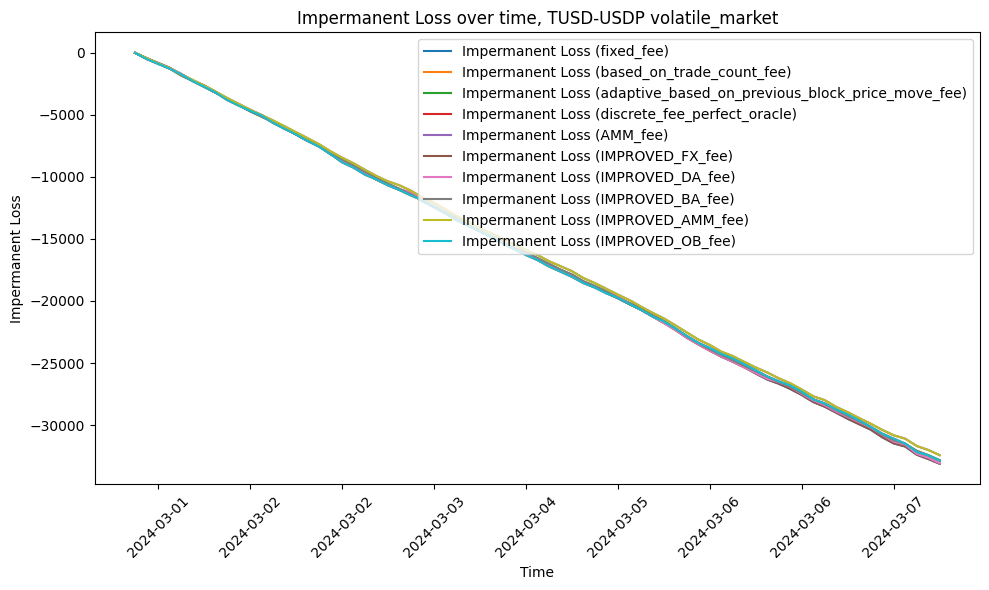

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,103.26,67,1.74,-59551.19,5230,-57.13,31032.83,28.16,-33122.85
1,based_on_trade_count_fee,101.88,66,1.74,-59449.00,5225,-57.09,30997.41,28.19,-33083.43
2,adaptive_based_on_previous_block_price_move_fee,159.47,88,2.03,-59353.31,5231,-56.93,30579.78,27.28,-32835.32
3,discrete_fee_perfect_oracle,45.13,49,1.07,-59372.78,5229,-56.97,30947.64,28.54,-32872.21
4,AMM_fee,183.20,105,1.94,-59065.92,5222,-56.75,30079.49,26.50,-32429.95
5,IMPROVED_FX_fee,103.26,67,1.74,-59551.19,5230,-57.13,31032.83,28.16,-33122.85
6,IMPROVED_DA_fee,101.88,66,1.74,-59449.00,5225,-57.09,30997.41,28.19,-33083.43
7,IMPROVED_BA_fee,159.47,88,2.03,-59353.31,5231,-56.93,30579.78,27.28,-32835.32
8,IMPROVED_AMM_fee,183.20,105,1.94,-59065.92,5222,-56.75,30079.49,26.50,-32429.95
9,IMPROVED_OB_fee,45.13,49,1.07,-59372.78,5229,-56.97,30947.64,28.54,-32872.21


In [18]:
plot_results_for_period(
    "TUSD-USDP volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### USDC/USDP

##### bull_market

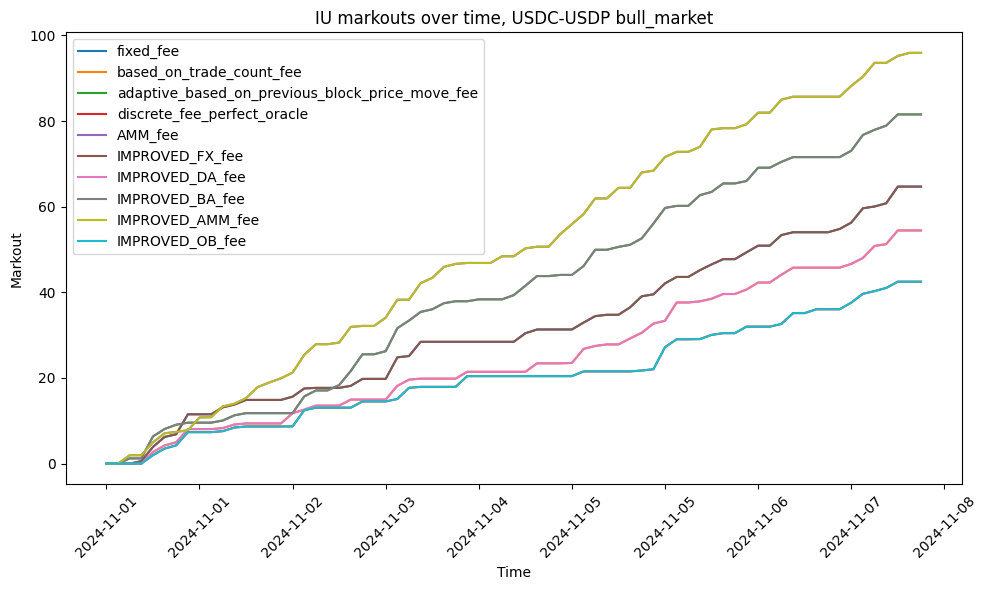

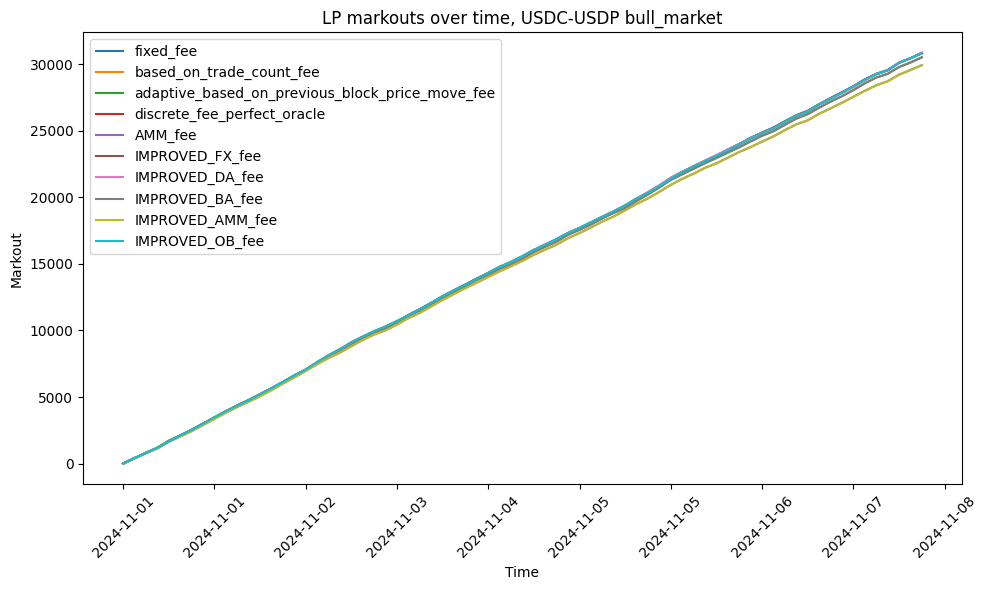

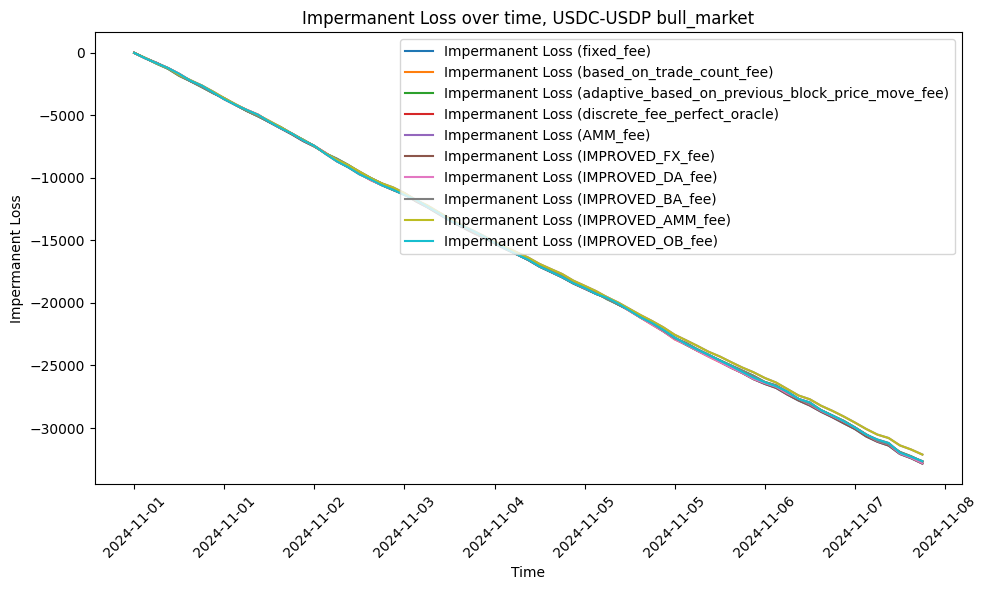

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,64.70,62,1.20,-59303.74,5220,-57.05,30842.47,28.21,-32848.75
1,based_on_trade_count_fee,54.45,61,1.04,-59337.21,5224,-57.04,30837.86,28.22,-32806.53
2,adaptive_based_on_previous_block_price_move_fee,81.55,86,1.10,-59282.56,5227,-56.96,30506.47,27.36,-32685.00
3,discrete_fee_perfect_oracle,42.49,47,1.05,-59143.53,5224,-56.86,30805.42,28.51,-32652.45
4,AMM_fee,95.93,93,1.19,-58845.95,5229,-56.53,29923.78,26.68,-32124.68
5,IMPROVED_FX_fee,64.70,62,1.20,-59303.74,5220,-57.05,30842.47,28.21,-32848.75
6,IMPROVED_DA_fee,54.45,61,1.04,-59337.21,5224,-57.04,30837.86,28.22,-32806.53
7,IMPROVED_BA_fee,81.55,86,1.10,-59282.56,5227,-56.96,30506.47,27.36,-32685.00
8,IMPROVED_AMM_fee,95.93,93,1.19,-58845.95,5229,-56.53,29923.78,26.68,-32124.68
9,IMPROVED_OB_fee,42.49,47,1.05,-59143.53,5224,-56.86,30805.42,28.51,-32652.45


In [19]:
plot_results_for_period(
    "USDC-USDP bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

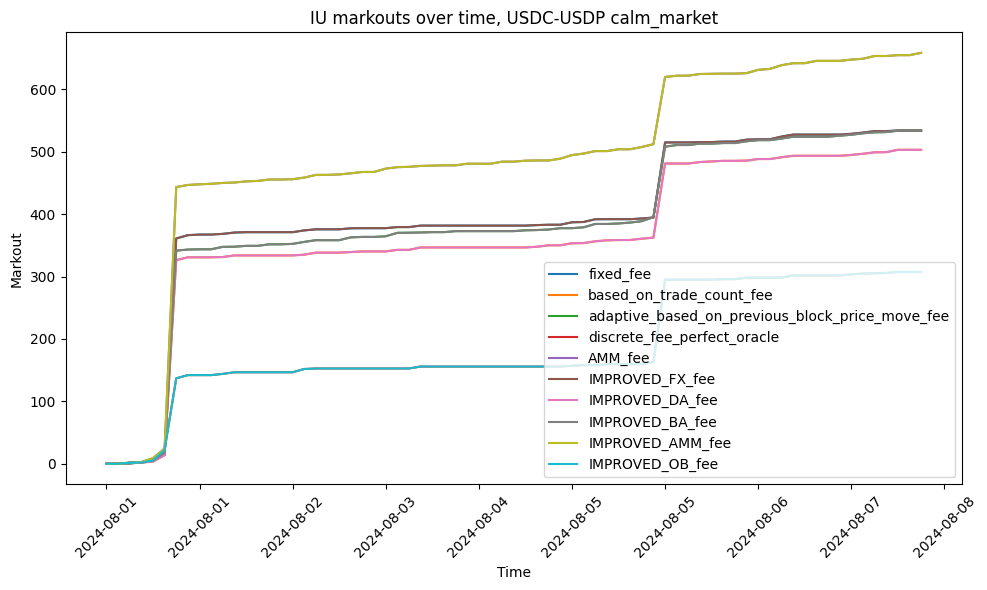

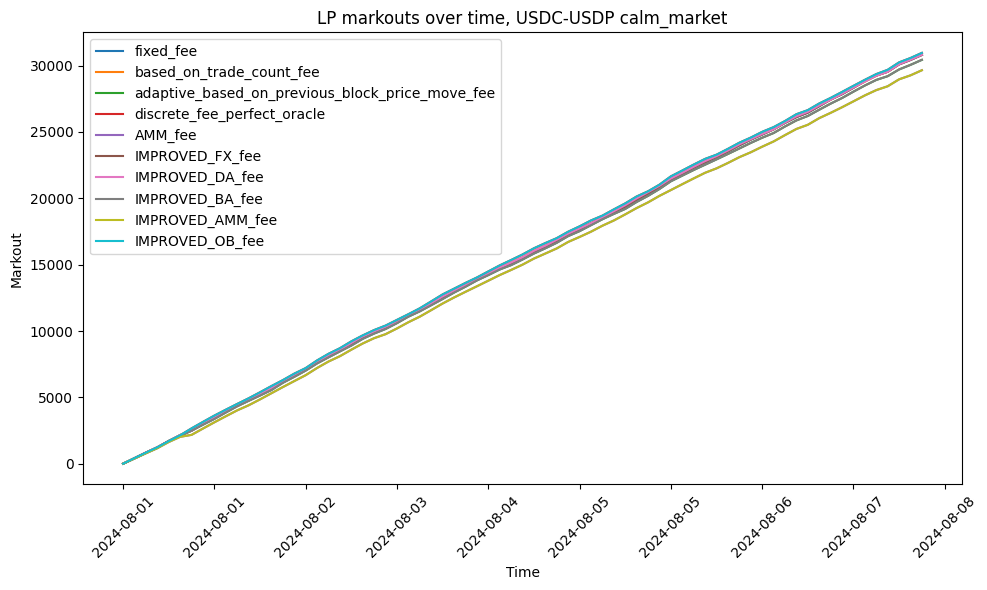

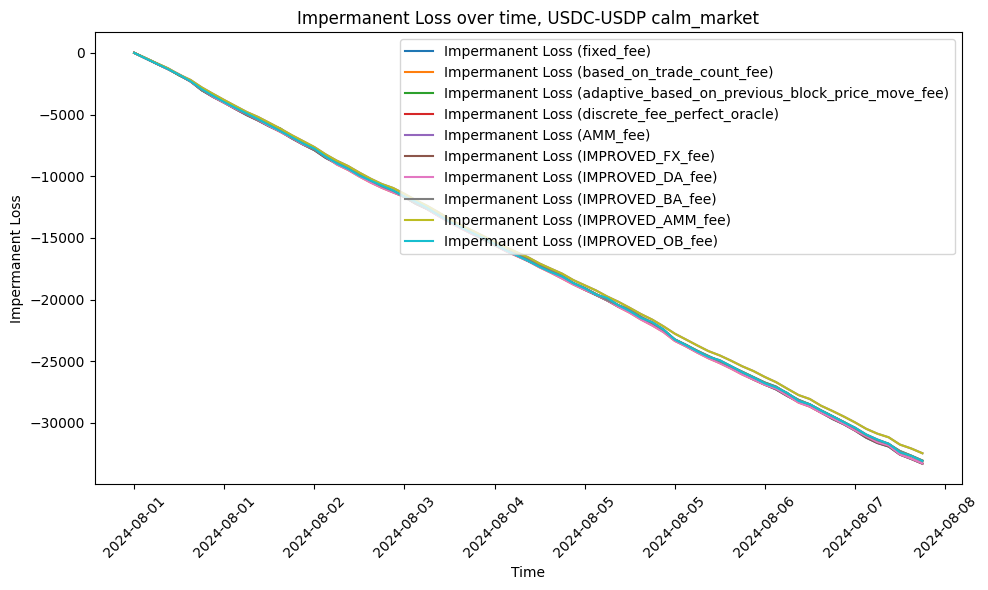

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,534.19,64,7.96,-59230.46,5228,-56.90,30806.39,27.80,-33308.96
1,based_on_trade_count_fee,503.23,62,7.66,-59323.70,5228,-56.99,30819.74,27.85,-33284.61
2,adaptive_based_on_previous_block_price_move_fee,533.87,85,6.22,-59134.32,5222,-56.86,30438.18,27.04,-33053.13
3,discrete_fee_perfect_oracle,307.34,42,6.82,-59029.48,5233,-56.65,30962.76,28.48,-33093.02
4,AMM_fee,658.66,102,6.46,-58838.99,5218,-56.62,29654.58,25.99,-32462.21
5,IMPROVED_FX_fee,534.19,64,7.96,-59230.46,5228,-56.90,30806.39,27.80,-33308.96
6,IMPROVED_DA_fee,503.23,62,7.66,-59323.70,5228,-56.99,30819.74,27.85,-33284.61
7,IMPROVED_BA_fee,533.87,85,6.22,-59134.32,5222,-56.86,30438.18,27.04,-33053.13
8,IMPROVED_AMM_fee,658.66,102,6.46,-58838.99,5218,-56.62,29654.58,25.99,-32462.21
9,IMPROVED_OB_fee,307.34,42,6.82,-59029.48,5233,-56.65,30962.76,28.48,-33093.02


In [20]:
plot_results_for_period(
    "USDC-USDP calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

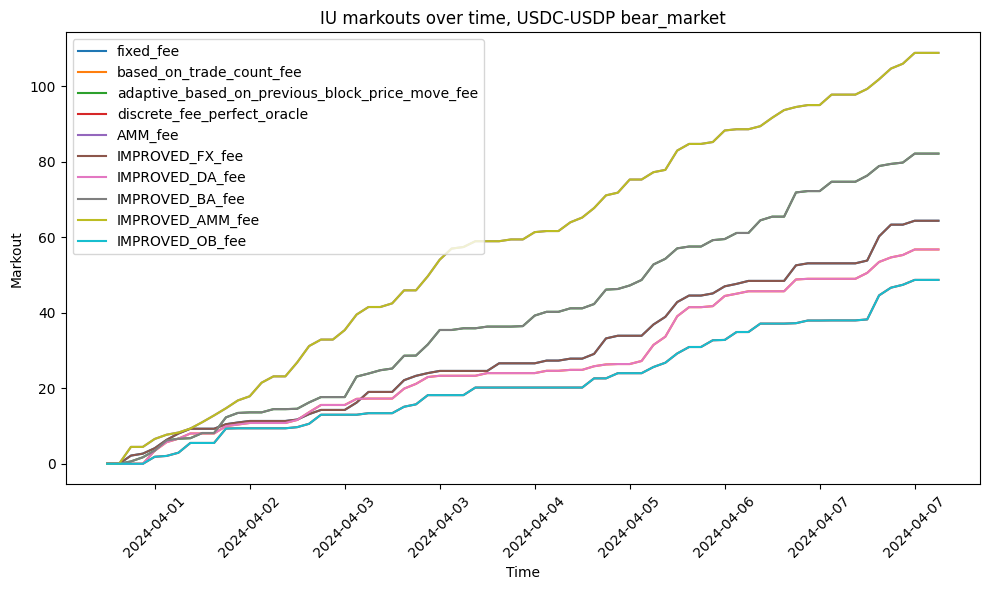

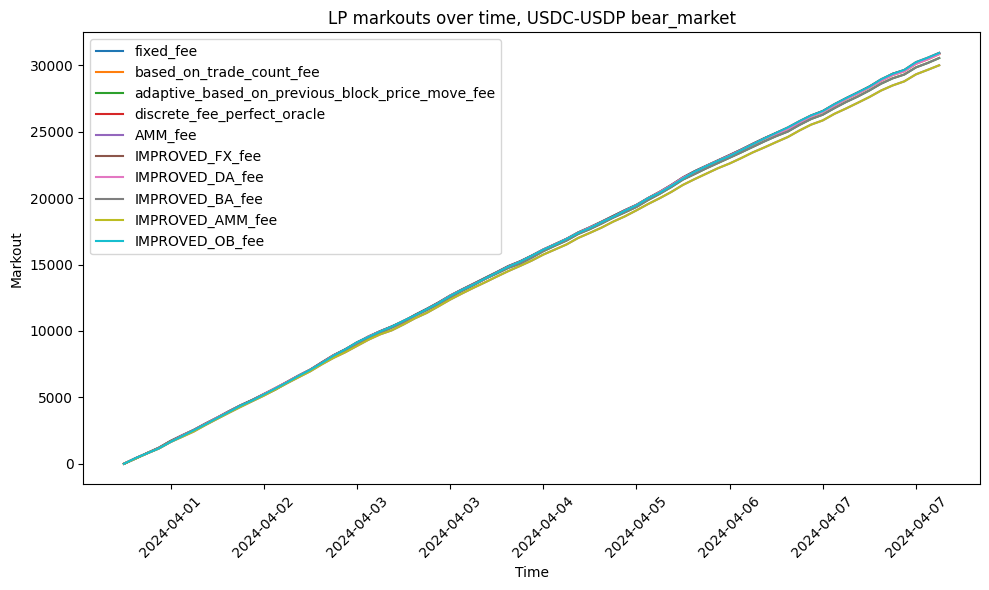

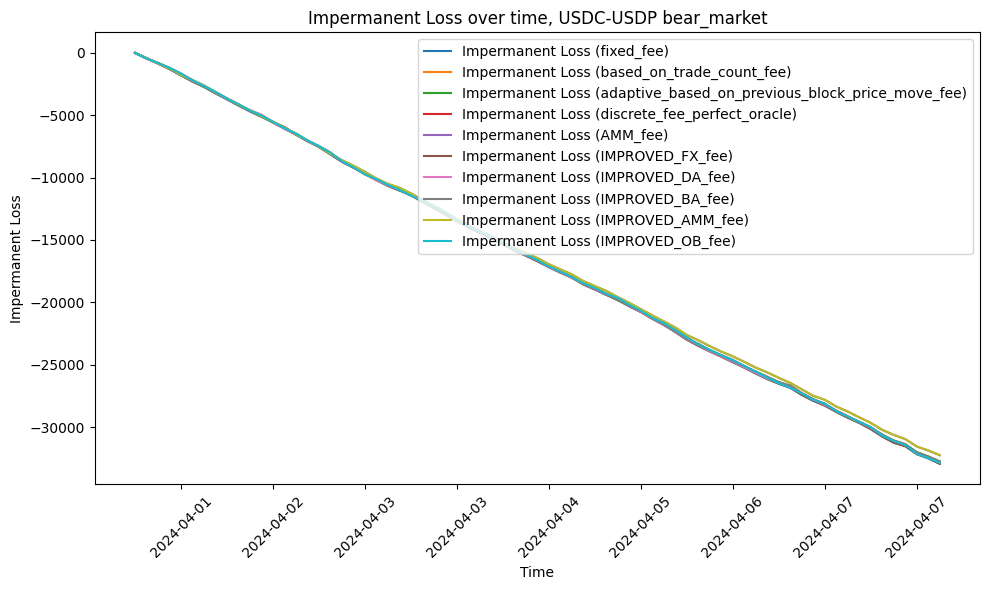

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,64.42,61,1.21,-59437.46,5232,-57.02,30906.34,28.21,-32942.73
1,based_on_trade_count_fee,56.80,59,1.12,-59344.70,5226,-56.99,30836.43,28.23,-32838.85
2,adaptive_based_on_previous_block_price_move_fee,82.21,89,1.08,-59342.77,5225,-57.02,30543.76,27.34,-32753.15
3,discrete_fee_perfect_oracle,48.74,48,1.17,-59300.42,5225,-56.97,30929.98,28.57,-32846.07
4,AMM_fee,108.91,96,1.30,-58964.11,5228,-56.60,29997.95,26.65,-32252.85
5,IMPROVED_FX_fee,64.42,61,1.21,-59437.46,5232,-57.02,30906.34,28.21,-32942.73
6,IMPROVED_DA_fee,56.80,59,1.12,-59344.70,5226,-56.99,30836.43,28.23,-32838.85
7,IMPROVED_BA_fee,82.21,89,1.08,-59342.77,5225,-57.02,30543.76,27.34,-32753.15
8,IMPROVED_AMM_fee,108.91,96,1.30,-58964.11,5228,-56.60,29997.95,26.65,-32252.85
9,IMPROVED_OB_fee,48.74,48,1.17,-59300.42,5225,-56.97,30929.98,28.57,-32846.07


In [21]:
plot_results_for_period(
    "USDC-USDP bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

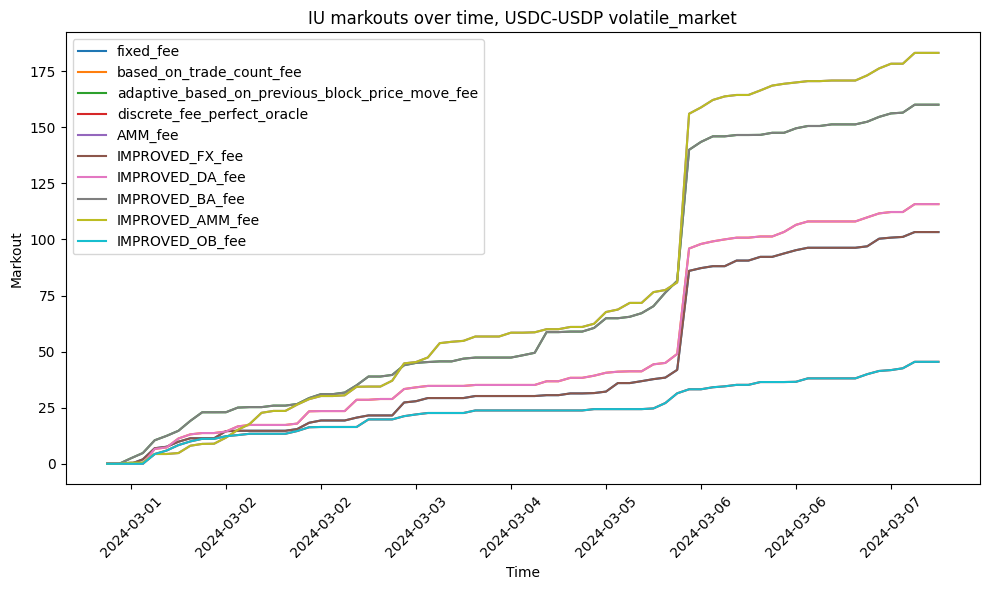

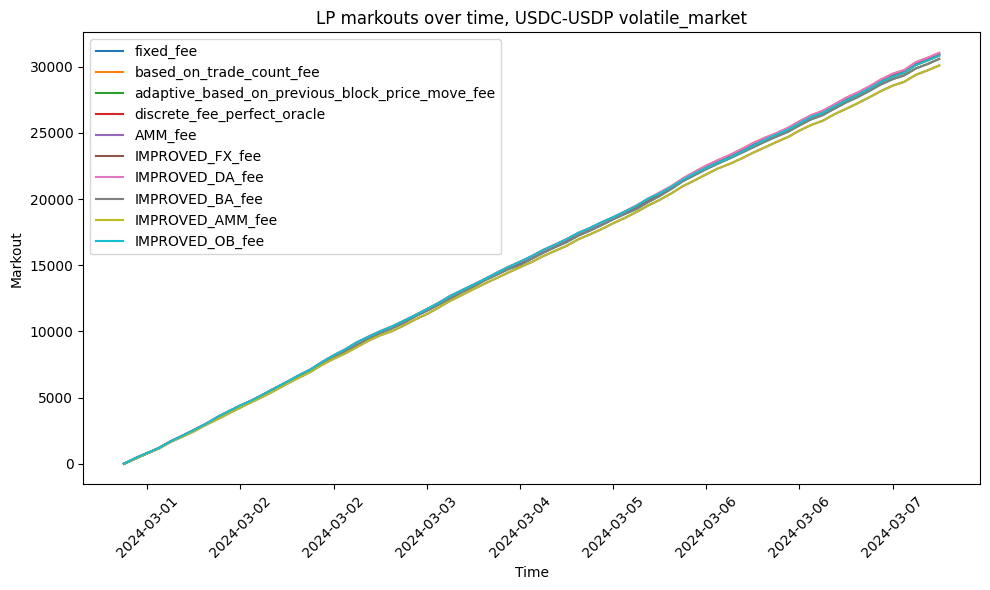

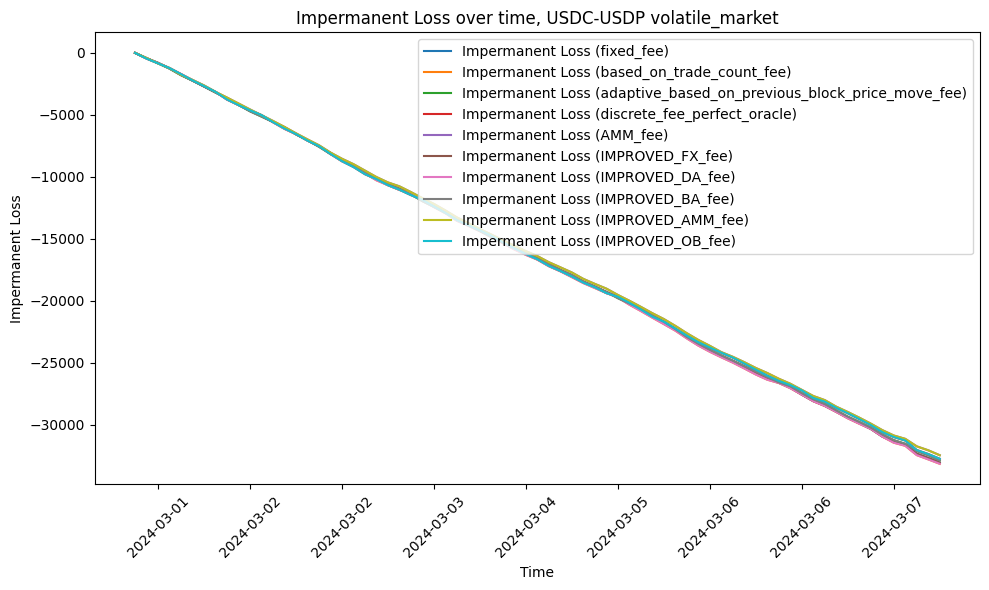

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,103.30,66,1.77,-59460.11,5226,-57.10,30968.57,28.16,-33042.46
1,based_on_trade_count_fee,115.74,67,1.93,-59627.28,5233,-57.19,31051.96,28.16,-33135.11
2,adaptive_based_on_previous_block_price_move_fee,160.07,90,1.99,-59322.60,5223,-56.99,30599.27,27.28,-32866.47
3,discrete_fee_perfect_oracle,45.45,45,1.17,-59215.81,5222,-56.92,30849.50,28.58,-32728.36
4,AMM_fee,183.16,104,1.96,-59142.00,5229,-56.76,30102.00,26.52,-32444.26
5,IMPROVED_FX_fee,103.30,66,1.77,-59460.11,5226,-57.10,30968.57,28.16,-33042.46
6,IMPROVED_DA_fee,115.74,67,1.93,-59627.28,5233,-57.19,31051.96,28.16,-33135.11
7,IMPROVED_BA_fee,160.07,90,1.99,-59322.60,5223,-56.99,30599.27,27.28,-32866.47
8,IMPROVED_AMM_fee,183.16,104,1.96,-59142.00,5229,-56.76,30102.00,26.52,-32444.26
9,IMPROVED_OB_fee,45.45,45,1.17,-59215.81,5222,-56.92,30849.50,28.58,-32728.36


In [22]:
plot_results_for_period(
    "USDC-USDP volatile_market",
    list(fee_algos_to_consider.keys()),
)

### Results: Non-stable / Stable (USDT-priced)

#### USDC/RAD

##### bull_market

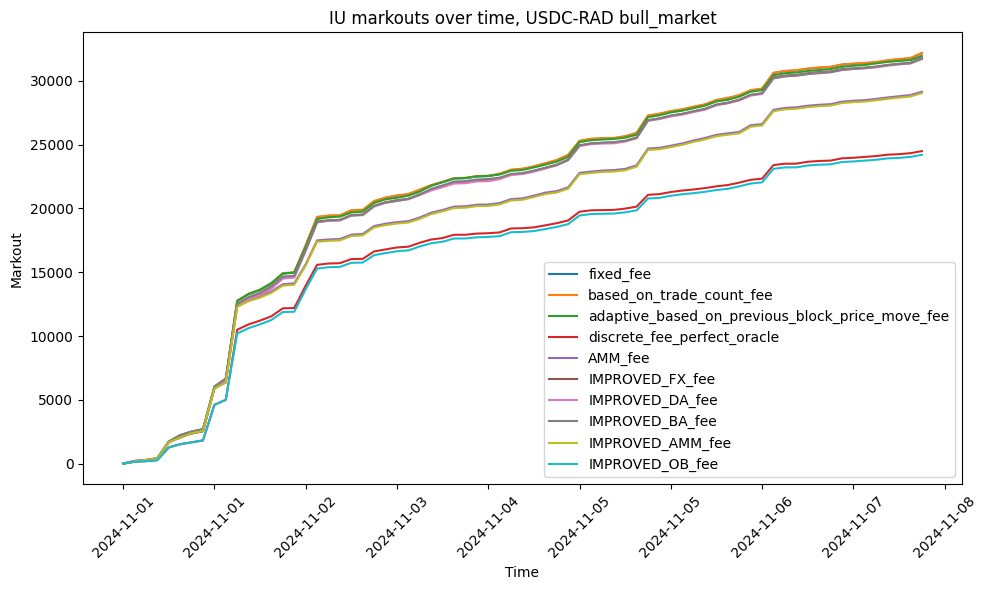

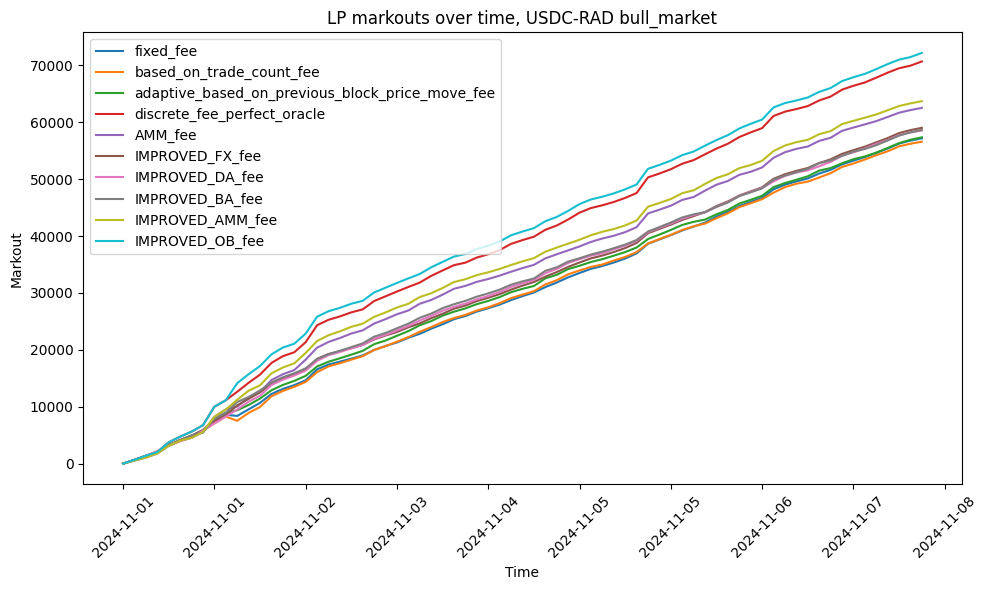

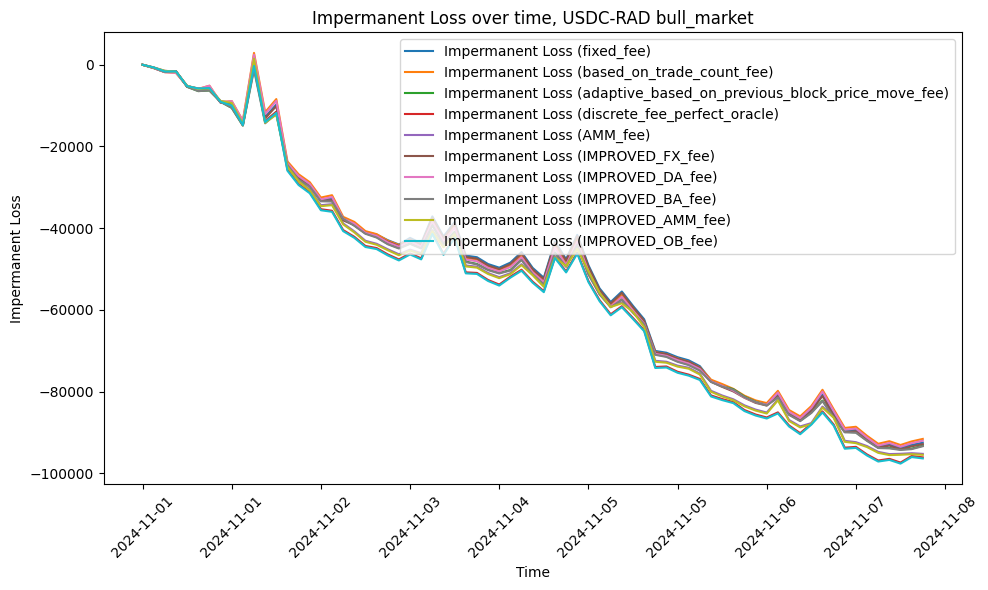

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,32158.78,1425,14.44,-59482.63,5239,-56.95,57183.19,17.48,-92516.34
1,based_on_trade_count_fee,32184.53,1423,14.47,-59484.78,5237,-56.97,56588.75,17.31,-91590.33
2,adaptive_based_on_previous_block_price_move_fee,31946.78,1425,14.38,-58907.05,5225,-56.53,57358.13,17.57,-93250.52
3,discrete_fee_perfect_oracle,24486.22,958,15.64,-59303.76,5234,-56.82,70695.42,27.10,-96108.00
4,AMM_fee,29142.24,1295,14.43,-59334.68,5217,-57.06,62532.29,20.44,-95248.43
5,IMPROVED_FX_fee,31811.71,1427,14.29,-59484.77,5239,-56.95,59026.67,18.05,-92874.49
6,IMPROVED_DA_fee,31761.38,1425,14.28,-59487.03,5237,-56.97,58565.00,17.92,-92021.29
7,IMPROVED_BA_fee,31700.35,1426,14.28,-58906.75,5225,-56.53,58673.89,17.98,-93375.76
8,IMPROVED_AMM_fee,29033.79,1296,14.37,-59334.95,5217,-57.06,63711.30,20.82,-95491.66
9,IMPROVED_OB_fee,24196.63,960,15.47,-59306.43,5234,-56.82,72204.13,27.69,-96365.00


In [23]:
plot_results_for_period(
    "USDC-RAD bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

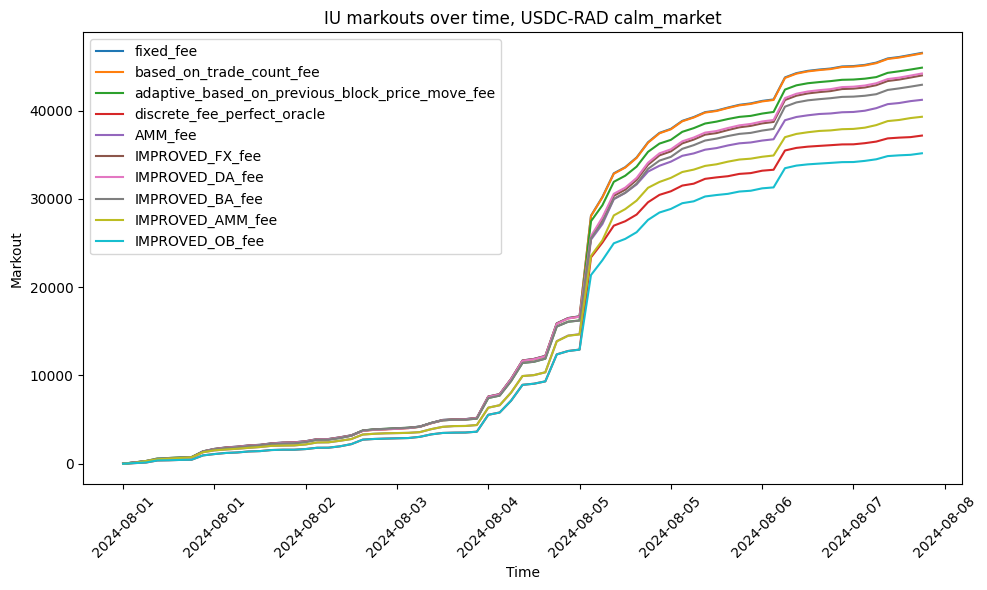

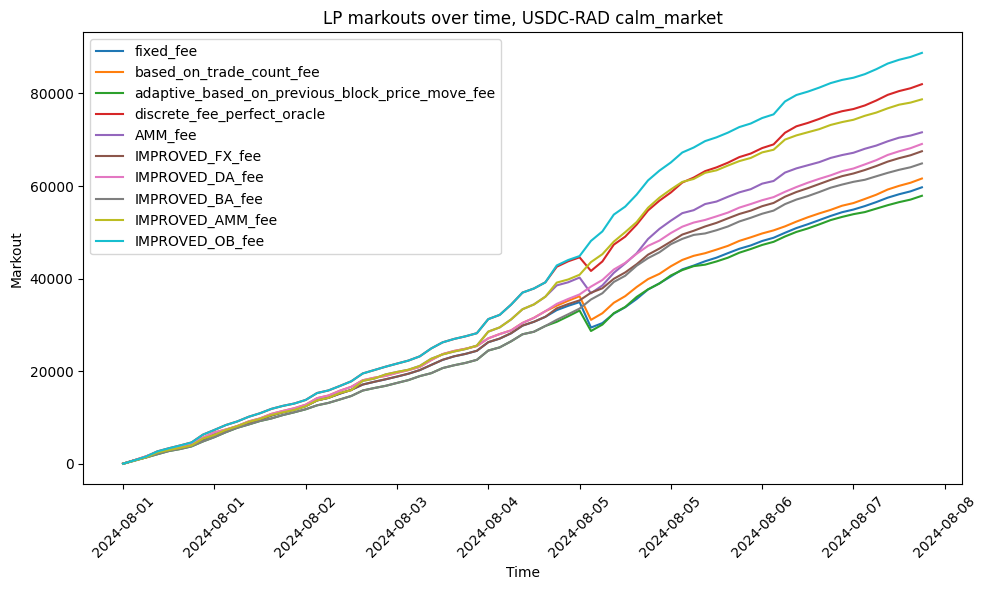

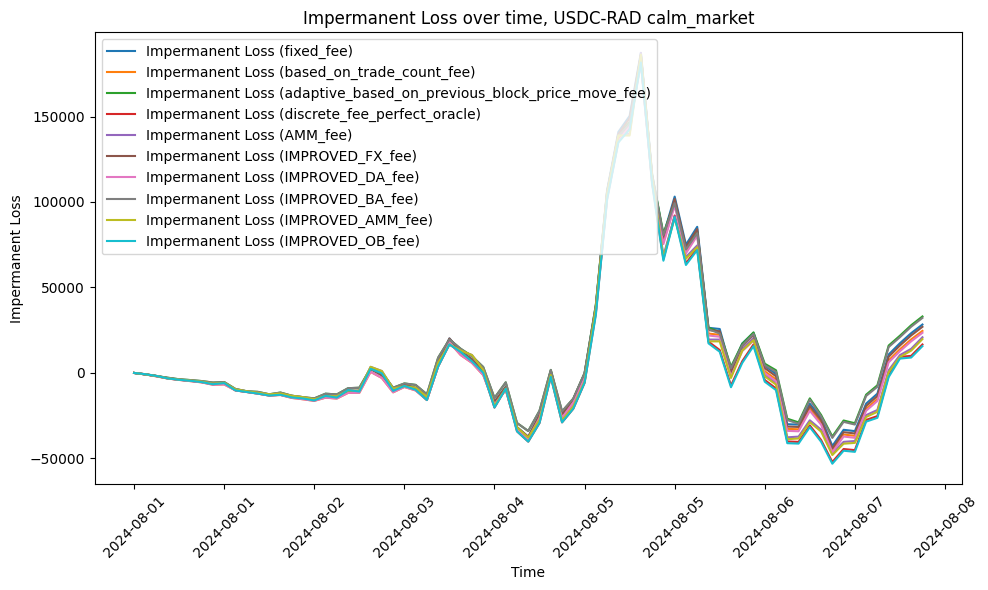

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,46526.74,1957,15.83,-57462.40,5219,-58.50,59726.95,15.23,28312.34
1,based_on_trade_count_fee,46465.86,1962,15.80,-57481.42,5219,-58.51,61624.03,15.71,24599.75
2,adaptive_based_on_previous_block_price_move_fee,44850.46,1941,15.67,-57766.59,5233,-58.65,57895.15,15.05,33038.07
3,discrete_fee_perfect_oracle,37160.45,1423,17.05,-56675.92,5234,-57.50,82011.17,25.91,16642.13
4,AMM_fee,41208.71,1713,16.23,-57453.36,5238,-58.26,71609.75,20.32,20872.57
5,IMPROVED_FX_fee,43971.52,1959,15.08,-57455.93,5219,-58.49,67521.33,17.32,26983.18
6,IMPROVED_DA_fee,44190.40,1964,15.14,-57473.53,5219,-58.50,69092.79,17.71,23476.71
7,IMPROVED_BA_fee,42914.27,1945,15.10,-57761.09,5233,-58.64,64883.88,16.95,32194.14
8,IMPROVED_AMM_fee,39289.81,1717,15.60,-57452.37,5238,-58.26,78737.02,22.46,19816.39
9,IMPROVED_OB_fee,35155.49,1427,16.28,-56665.66,5234,-57.49,88775.02,28.23,15670.54


In [25]:
plot_results_for_period(
    "USDC-RAD calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

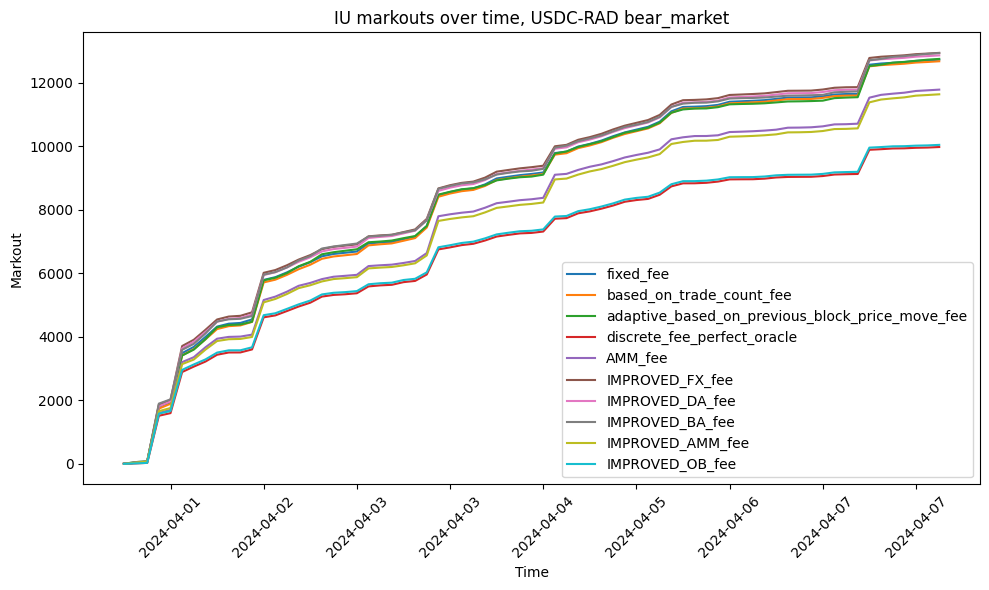

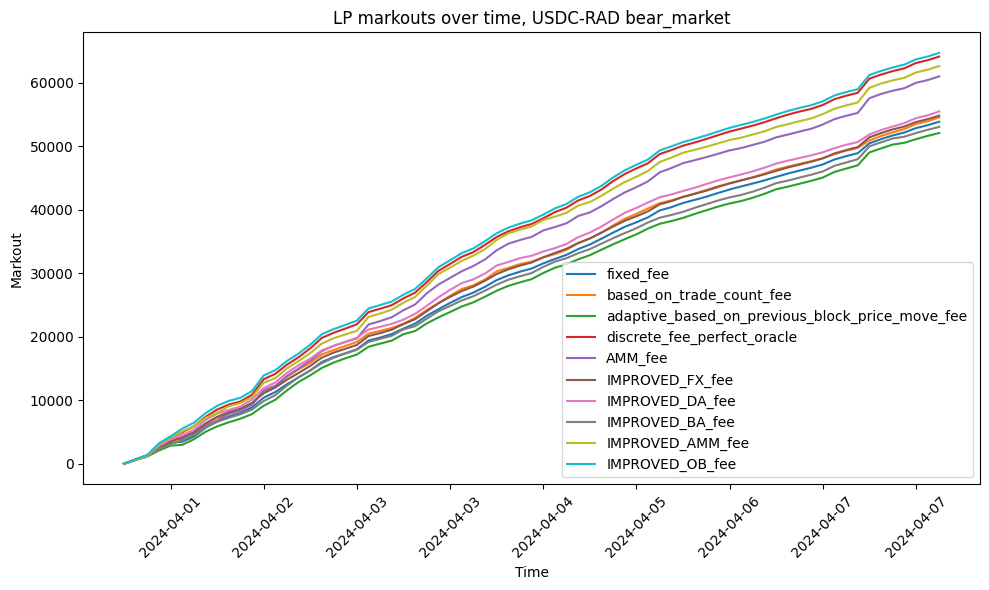

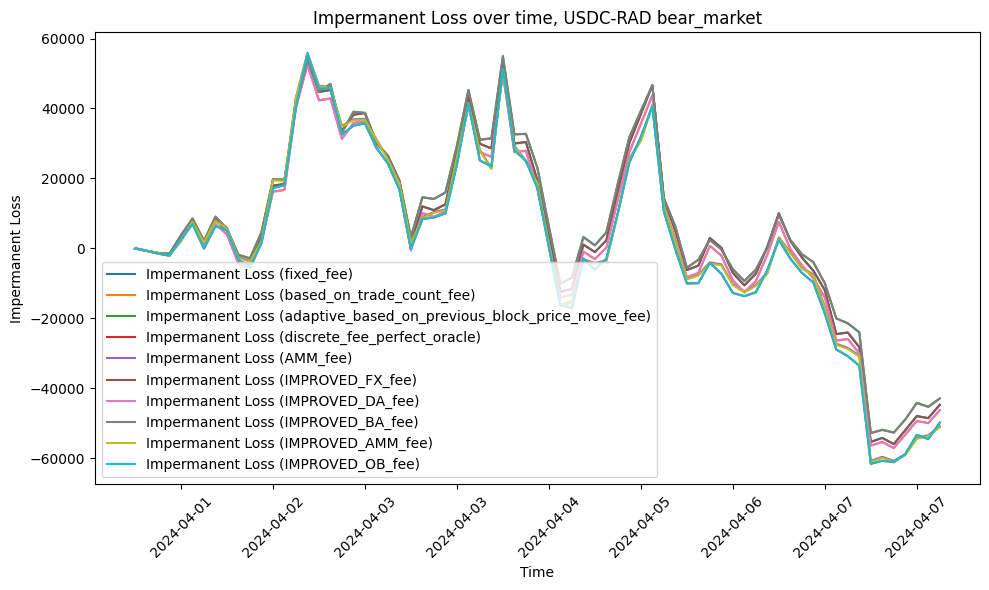

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,12733.56,1317,8.43,-57083.71,5218,-58.31,53838.21,21.63,-44736.52
1,based_on_trade_count_fee,12682.58,1321,8.37,-57119.87,5216,-58.36,54523.82,21.86,-46286.27
2,adaptive_based_on_previous_block_price_move_fee,12757.08,1293,8.59,-57434.21,5223,-58.63,52056.61,21.12,-42886.03
3,discrete_fee_perfect_oracle,9980.83,971,8.84,-56863.31,5217,-58.06,64084.05,30.40,-49838.03
4,AMM_fee,11789.15,1130,9.03,-57689.50,5227,-58.83,60966.42,26.66,-50853.79
5,IMPROVED_FX_fee,12946.90,1319,8.58,-57107.24,5218,-58.33,54789.92,22.01,-44738.22
6,IMPROVED_DA_fee,12867.97,1322,8.50,-57129.89,5216,-58.38,55453.03,22.24,-46264.87
7,IMPROVED_BA_fee,12940.13,1295,8.71,-57433.72,5223,-58.63,53015.98,21.51,-42946.24
8,IMPROVED_AMM_fee,11641.69,1137,8.92,-57659.53,5227,-58.79,62600.65,27.38,-51155.98
9,IMPROVED_OB_fee,10048.27,972,8.90,-56863.33,5217,-58.06,64663.19,30.67,-49839.31


In [26]:
plot_results_for_period(
    "USDC-RAD bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

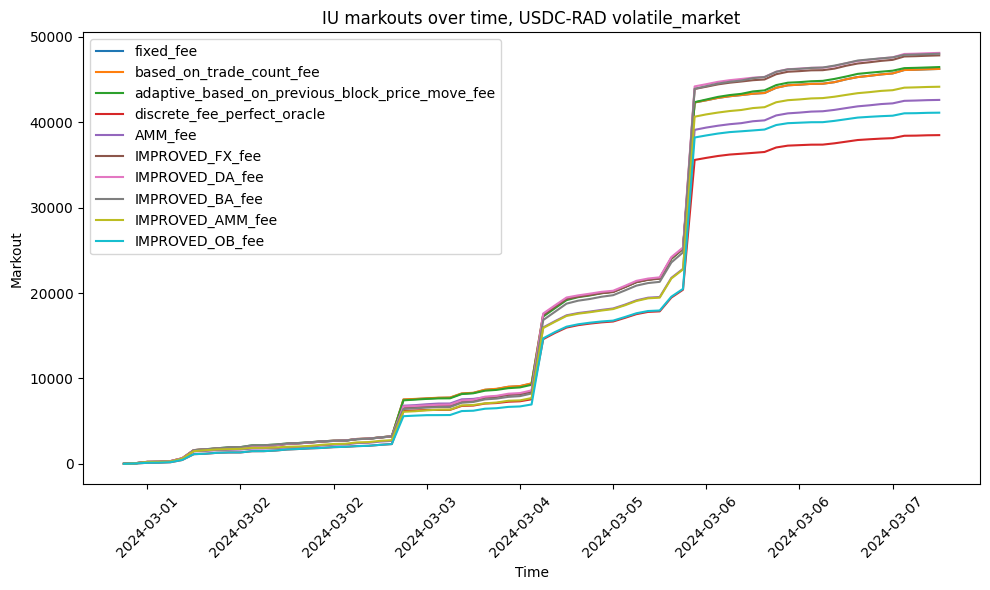

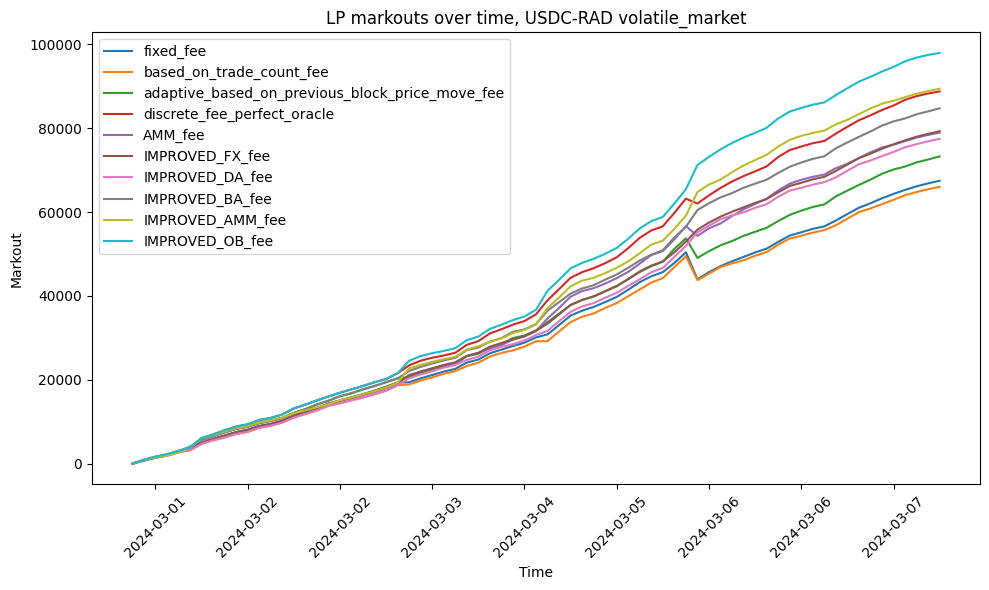

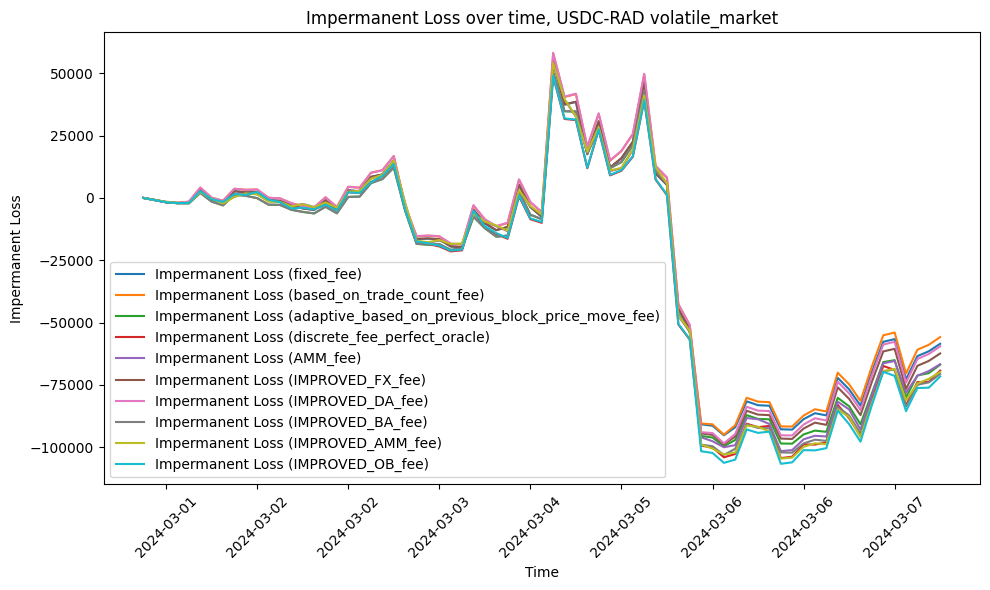

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,46247.04,2209,14.80,-60455.59,5229,-55.35,67448.48,16.00,-58485.06
1,based_on_trade_count_fee,46246.20,2207,14.81,-60456.56,5229,-55.35,66008.96,15.66,-55801.92
2,adaptive_based_on_previous_block_price_move_fee,46467.24,2121,15.22,-60953.69,5234,-55.74,73250.11,17.66,-66889.83
3,discrete_fee_perfect_oracle,38494.09,1576,16.64,-60683.34,5232,-55.53,88735.57,26.05,-69243.54
4,AMM_fee,42617.06,1828,15.94,-61223.15,5231,-56.03,78920.92,20.96,-66679.52
5,IMPROVED_FX_fee,47833.35,2210,15.48,-60457.05,5229,-55.35,79255.99,18.95,-62358.86
6,IMPROVED_DA_fee,48126.82,2208,15.57,-60457.91,5229,-55.35,77430.26,18.51,-59503.10
7,IMPROVED_BA_fee,48028.17,2122,15.90,-60993.03,5234,-55.77,84720.74,20.59,-70611.41
8,IMPROVED_AMM_fee,44160.05,1832,16.67,-61239.97,5233,-56.02,89377.92,23.89,-69790.52
9,IMPROVED_OB_fee,41123.05,1576,17.99,-60669.57,5232,-55.51,97921.33,28.98,-71605.61


In [27]:
plot_results_for_period(
    "USDC-RAD volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### ETH/USDT

##### bull_market

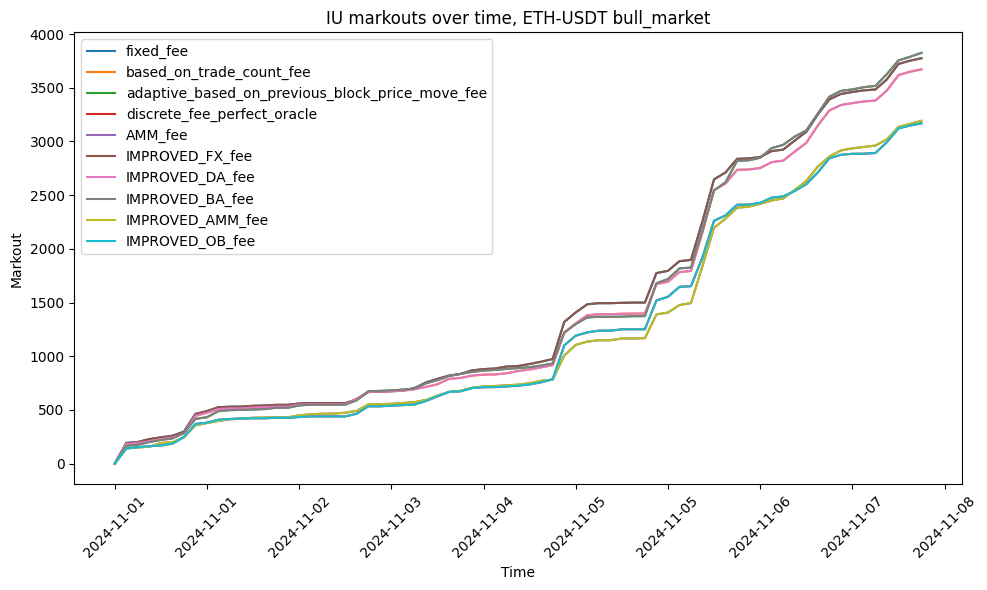

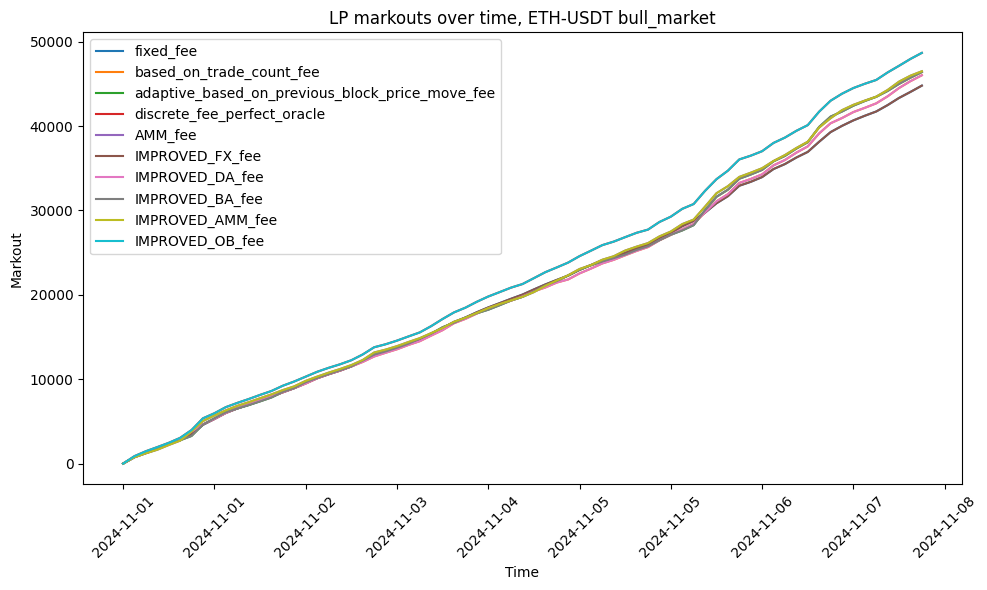

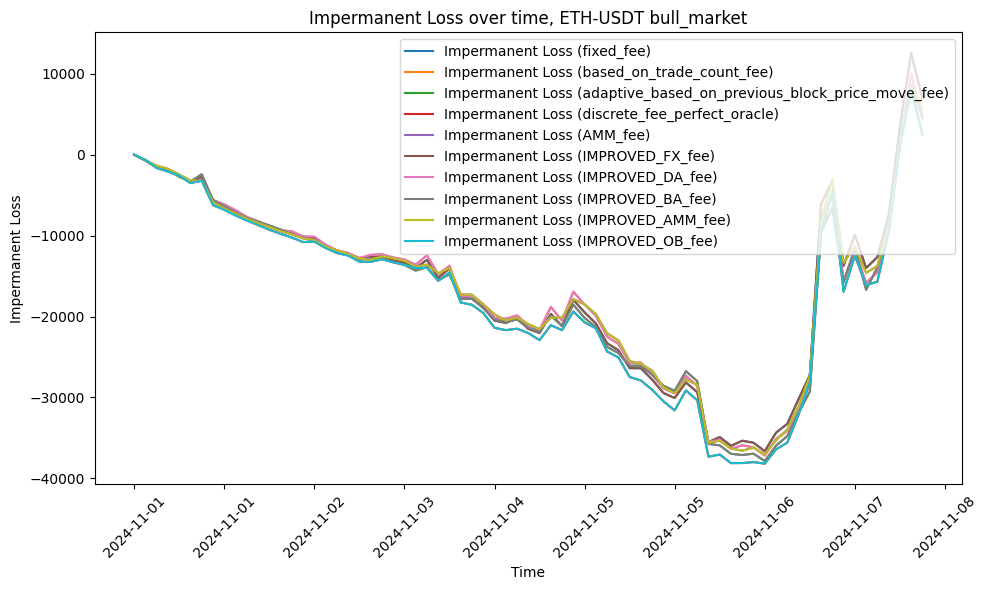

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,3774.48,693,5.11,-60276.08,5242,-57.44,44790.87,25.06,6949.30
1,based_on_trade_count_fee,3670.95,690,5.01,-60227.49,5239,-57.43,46019.10,25.84,4484.32
2,adaptive_based_on_previous_block_price_move_fee,3824.49,681,5.22,-60152.30,5235,-57.39,46395.05,26.06,4750.80
3,discrete_fee_perfect_oracle,3168.89,502,5.74,-59765.70,5226,-57.11,48671.42,30.44,2519.46
4,AMM_fee,3191.97,586,5.07,-59443.65,5235,-56.74,46493.33,27.71,5675.32
5,IMPROVED_FX_fee,3774.48,693,5.11,-60276.08,5242,-57.44,44790.87,25.06,6949.30
6,IMPROVED_DA_fee,3670.95,690,5.01,-60227.49,5239,-57.43,46019.10,25.84,4484.32
7,IMPROVED_BA_fee,3824.49,681,5.22,-60152.30,5235,-57.39,46395.05,26.06,4750.80
8,IMPROVED_AMM_fee,3191.97,586,5.07,-59443.65,5235,-56.74,46493.33,27.71,5675.32
9,IMPROVED_OB_fee,3168.89,502,5.74,-59765.70,5226,-57.11,48671.42,30.44,2519.46


In [28]:
plot_results_for_period(
    "ETH-USDT bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

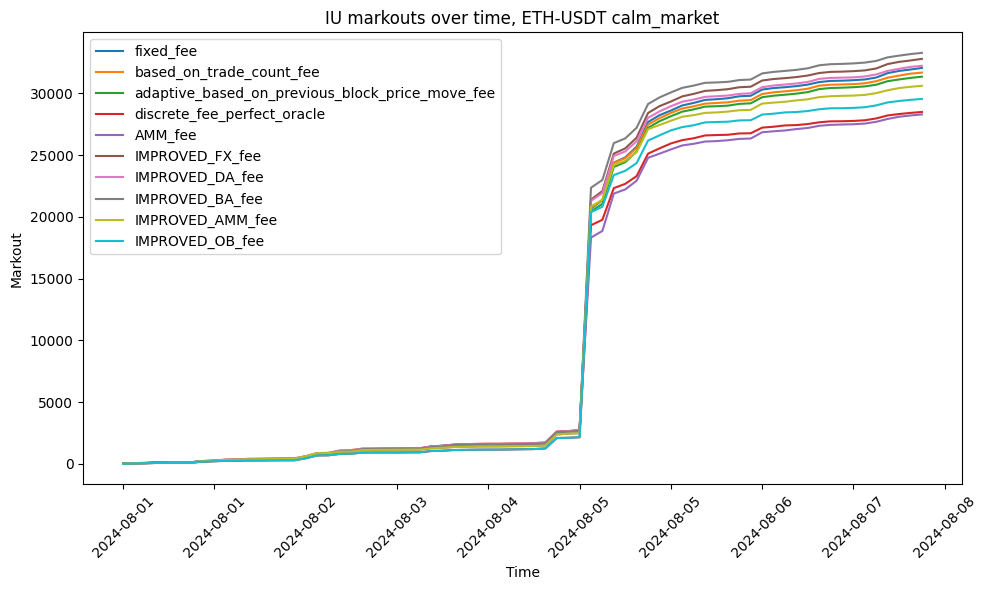

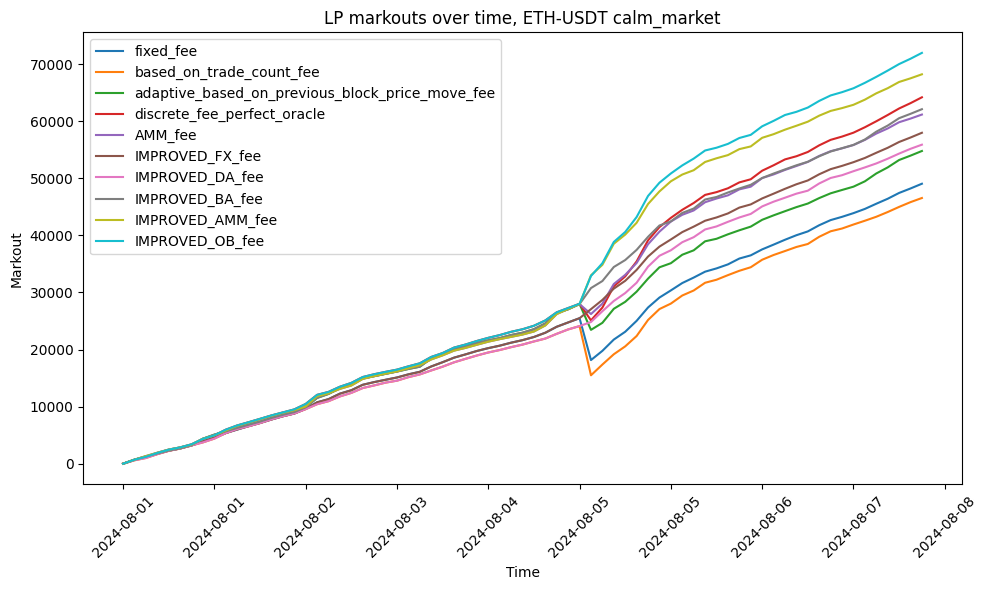

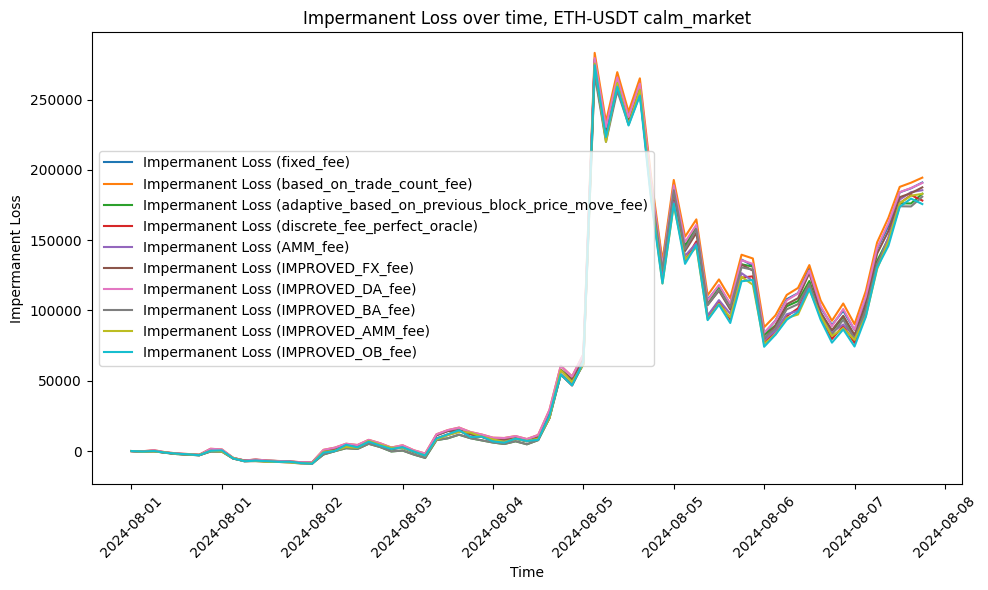

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,32071.94,1608,15.59,-57207.18,5237,-59.20,49042.12,16.22,191012.56
1,based_on_trade_count_fee,31690.49,1617,15.47,-56677.76,5220,-58.86,46542.38,15.45,194463.49
2,adaptive_based_on_previous_block_price_move_fee,31361.96,1579,15.58,-56839.82,5220,-58.99,54776.76,18.40,183019.57
3,discrete_fee_perfect_oracle,28503.44,1186,17.96,-56724.72,5227,-58.79,64182.91,25.15,178193.85
4,AMM_fee,28301.37,1361,16.09,-56834.53,5235,-58.81,61159.00,22.44,185528.58
5,IMPROVED_FX_fee,32805.56,1608,16.07,-57209.13,5237,-59.19,57968.00,19.27,187556.07
6,IMPROVED_DA_fee,32240.96,1617,15.86,-56679.87,5220,-58.86,55882.27,18.65,190689.37
7,IMPROVED_BA_fee,33290.83,1579,16.67,-56841.00,5220,-58.99,62099.25,20.97,180900.42
8,IMPROVED_AMM_fee,30624.93,1360,17.57,-56803.68,5235,-58.77,68210.76,25.18,182977.25
9,IMPROVED_OB_fee,29561.02,1187,18.83,-56733.73,5227,-58.80,71962.70,28.39,175675.68


In [30]:
plot_results_for_period(
    "ETH-USDT calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

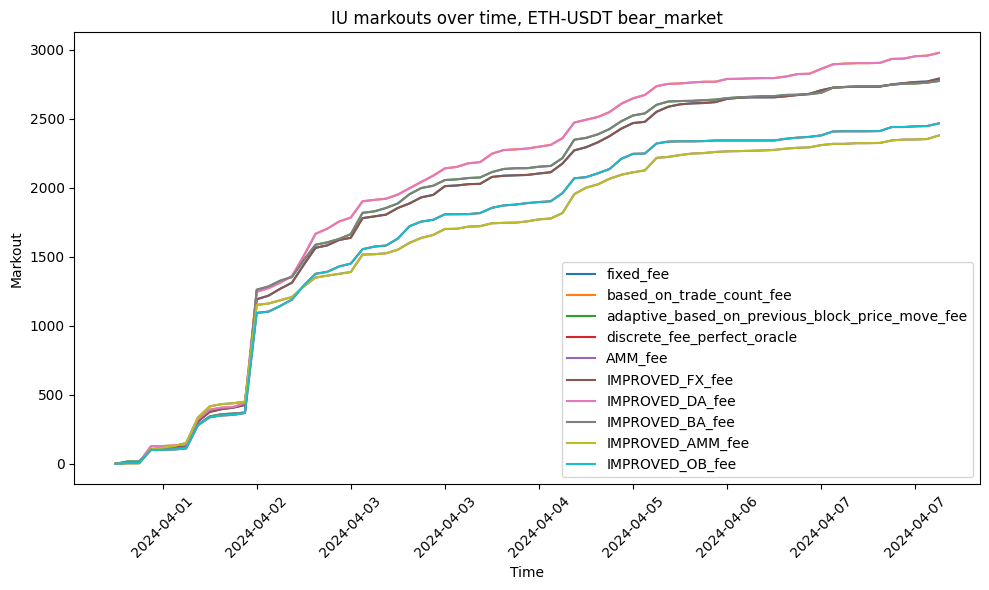

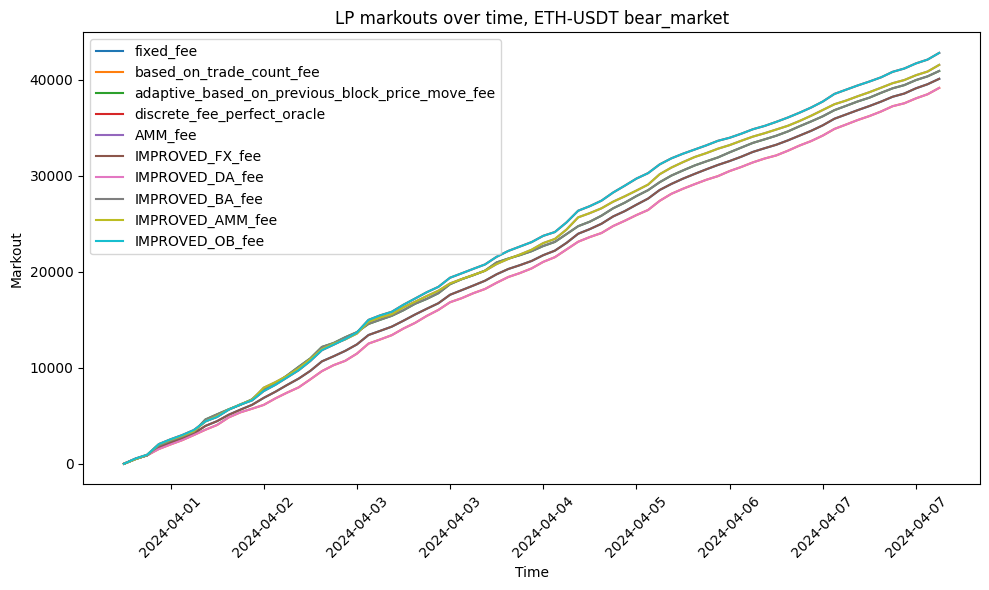

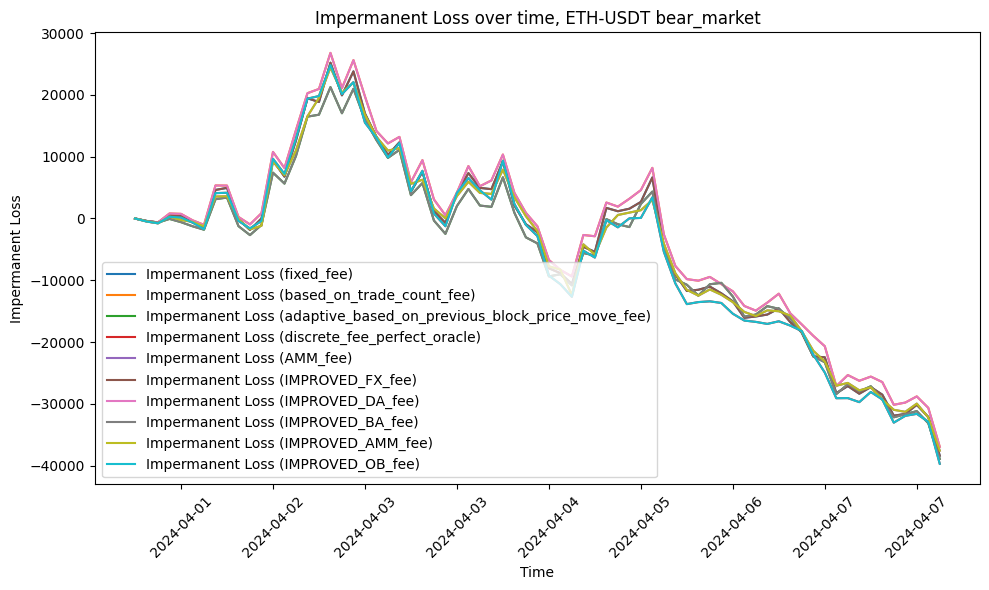

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2790.09,550,4.93,-58041.84,5251,-57.74,40073.34,25.50,-38383.67
1,based_on_trade_count_fee,2976.78,529,5.37,-57796.20,5235,-57.70,39127.15,25.14,-36942.84
2,adaptive_based_on_previous_block_price_move_fee,2773.09,541,5.05,-57881.97,5239,-57.71,40890.31,26.34,-38911.26
3,discrete_fee_perfect_oracle,2465.83,386,5.95,-57841.59,5236,-57.71,42772.61,30.20,-39695.85
4,AMM_fee,2378.43,460,5.04,-57648.42,5232,-57.53,41524.39,28.18,-37564.43
5,IMPROVED_FX_fee,2790.09,550,4.93,-58041.84,5251,-57.74,40073.34,25.50,-38383.67
6,IMPROVED_DA_fee,2976.78,529,5.37,-57796.20,5235,-57.70,39127.15,25.14,-36942.84
7,IMPROVED_BA_fee,2773.09,541,5.05,-57881.97,5239,-57.71,40890.31,26.34,-38911.26
8,IMPROVED_AMM_fee,2378.43,460,5.04,-57648.42,5232,-57.53,41524.39,28.18,-37564.43
9,IMPROVED_OB_fee,2465.83,386,5.95,-57841.59,5236,-57.71,42772.61,30.20,-39695.85


In [31]:
plot_results_for_period(
    "ETH-USDT bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

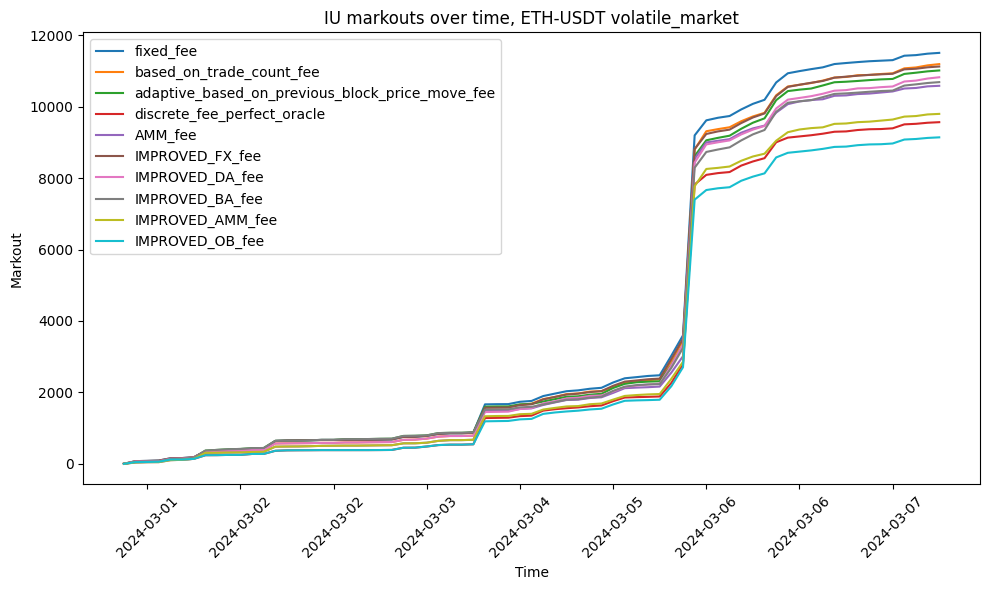

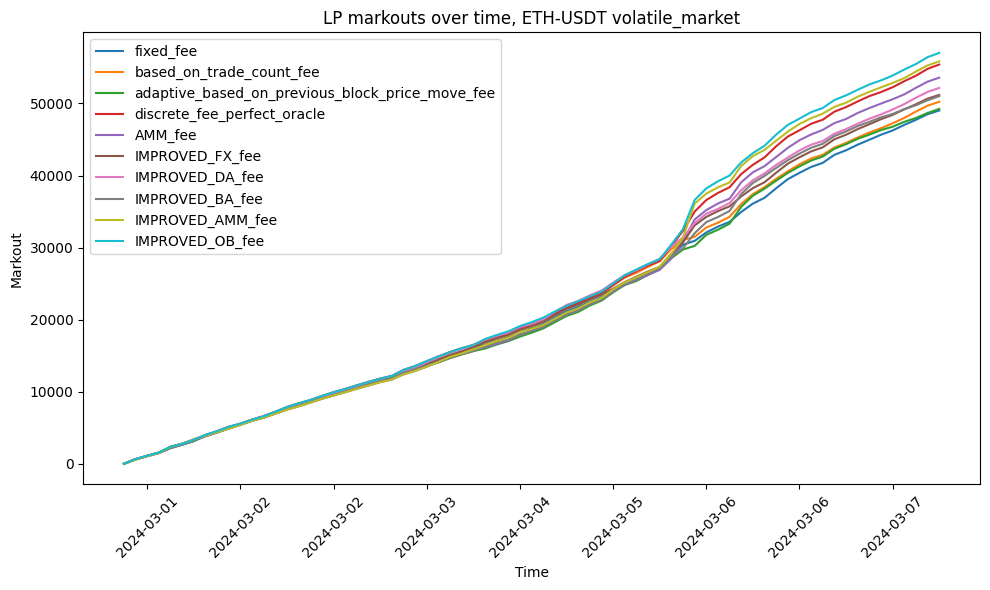

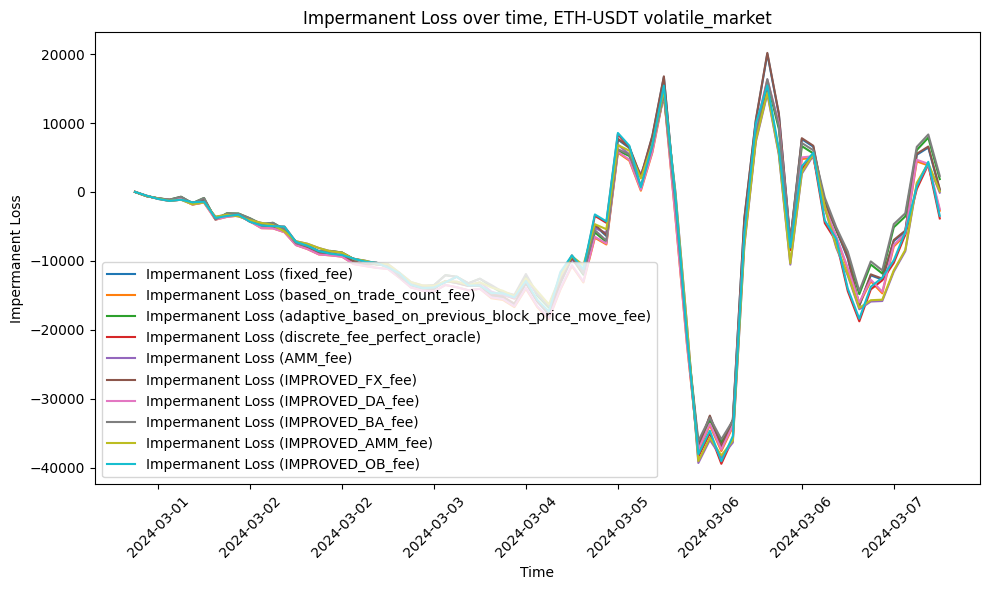

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,11508.47,940,9.99,-60377.92,5232,-56.00,49027.32,21.98,258.11
1,based_on_trade_count_fee,11194.43,944,9.80,-60071.80,5236,-55.67,50240.90,22.62,-2722.14
2,adaptive_based_on_previous_block_price_move_fee,11015.92,921,9.84,-60236.81,5243,-55.76,49241.78,22.38,1860.31
3,discrete_fee_perfect_oracle,9567.82,657,11.49,-60075.02,5226,-55.78,55399.56,29.01,-3849.53
4,AMM_fee,10586.25,788,10.88,-59970.19,5227,-55.68,53582.10,26.14,-103.31
5,IMPROVED_FX_fee,11126.69,940,9.76,-60385.79,5232,-56.01,51183.07,23.08,402.42
6,IMPROVED_DA_fee,10825.75,943,9.58,-60074.28,5236,-55.67,52155.42,23.62,-2487.75
7,IMPROVED_BA_fee,10689.57,917,9.68,-60247.63,5243,-55.77,51009.55,23.35,2317.78
8,IMPROVED_AMM_fee,9799.78,804,10.08,-60041.89,5225,-55.75,55837.86,27.25,90.78
9,IMPROVED_OB_fee,9142.88,654,11.16,-60074.82,5226,-55.78,57018.15,30.07,-3466.83


In [32]:
plot_results_for_period(
    "ETH-USDT volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### BTC/USDT

##### bull_market

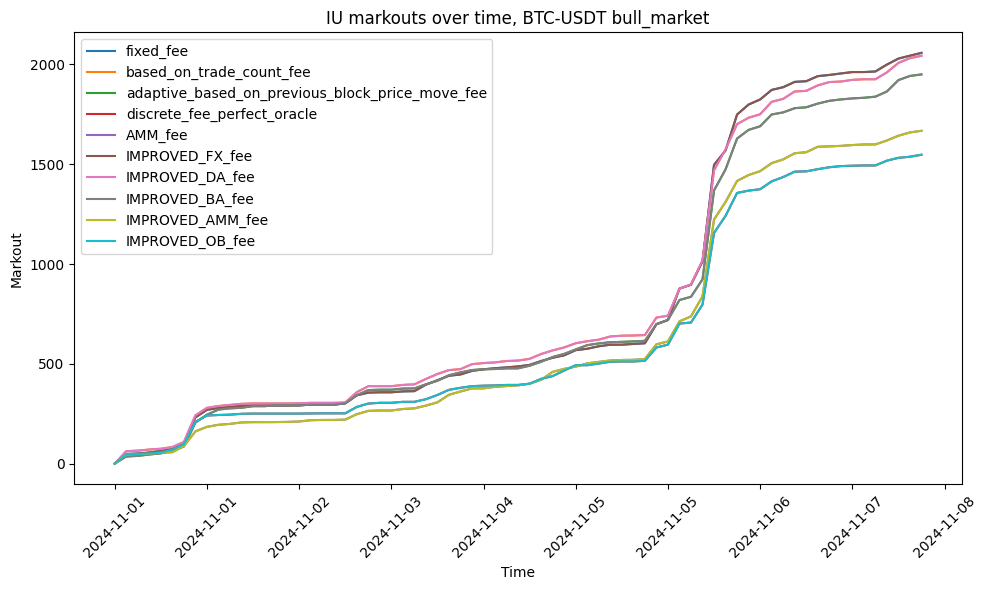

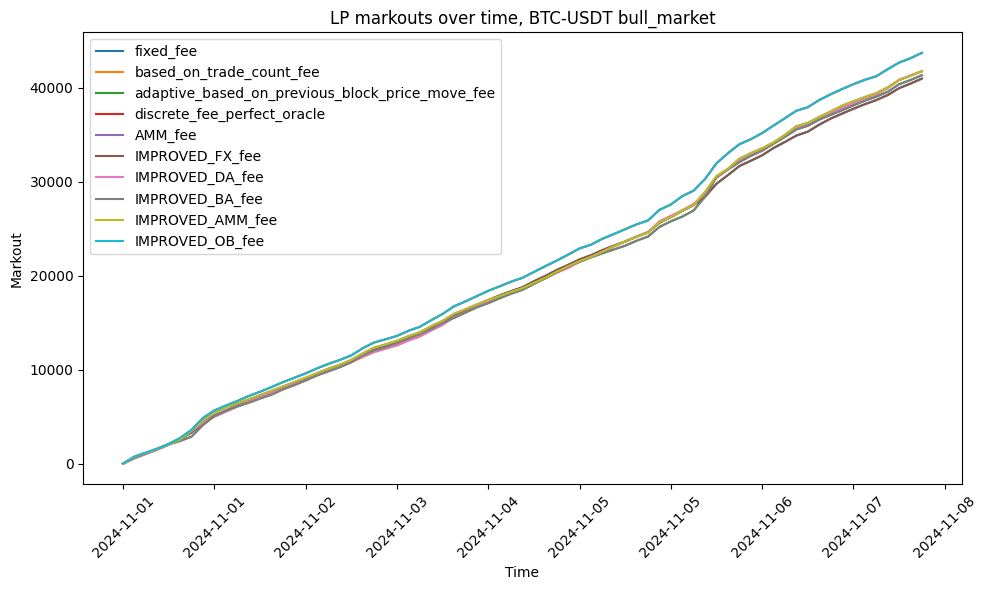

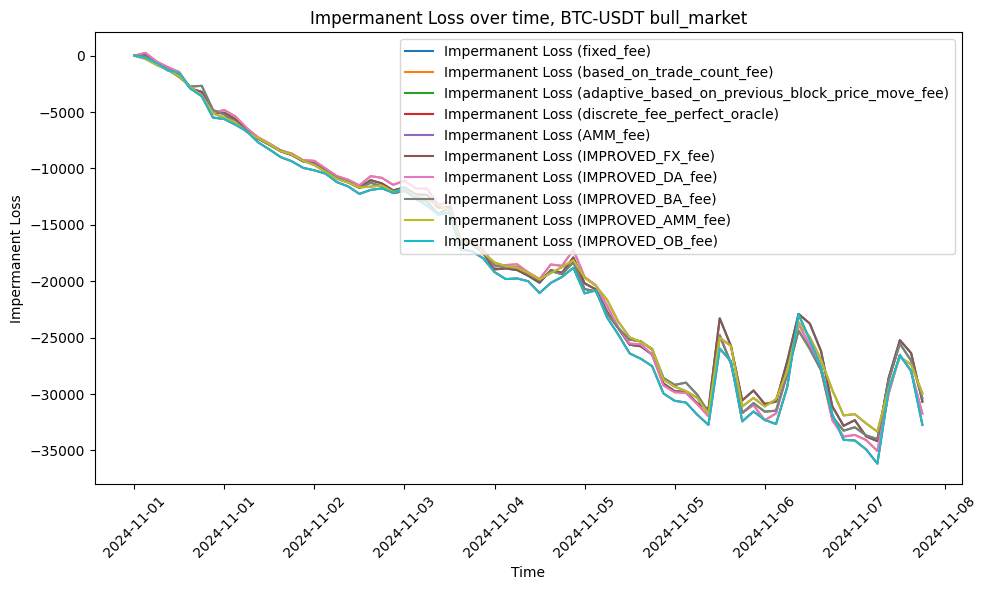

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2058.03,521,3.89,-59671.09,5232,-57.10,40993.84,26.03,-30675.40
1,based_on_trade_count_fee,2043.23,519,3.87,-60141.64,5245,-57.40,41790.82,26.52,-31735.07
2,adaptive_based_on_previous_block_price_move_fee,1950.06,520,3.72,-59660.24,5225,-57.15,41353.82,26.36,-30396.40
3,discrete_fee_perfect_oracle,1547.67,383,3.95,-59262.56,5234,-56.65,43734.80,30.42,-32737.69
4,AMM_fee,1667.49,440,3.73,-59314.40,5225,-56.81,41769.37,28.02,-29934.04
5,IMPROVED_FX_fee,2058.03,521,3.89,-59671.09,5232,-57.10,40993.84,26.03,-30675.40
6,IMPROVED_DA_fee,2043.23,519,3.87,-60141.64,5245,-57.40,41790.82,26.52,-31735.07
7,IMPROVED_BA_fee,1950.06,520,3.72,-59660.24,5225,-57.15,41353.82,26.36,-30396.40
8,IMPROVED_AMM_fee,1667.49,440,3.73,-59314.40,5225,-56.81,41769.37,28.02,-29934.04
9,IMPROVED_OB_fee,1547.67,383,3.95,-59262.56,5234,-56.65,43734.80,30.42,-32737.69


In [33]:
plot_results_for_period(
    "BTC-USDT bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

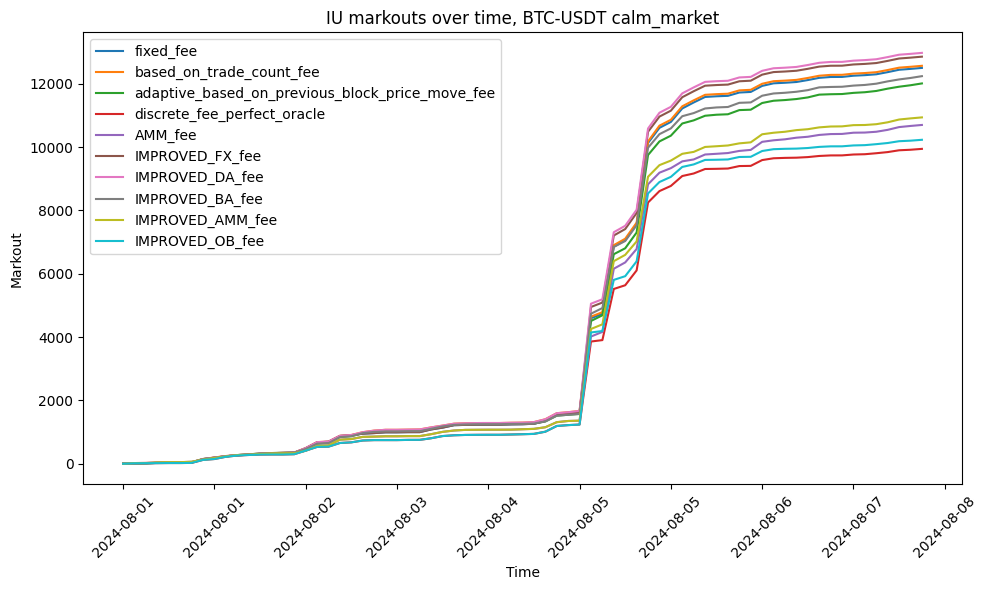

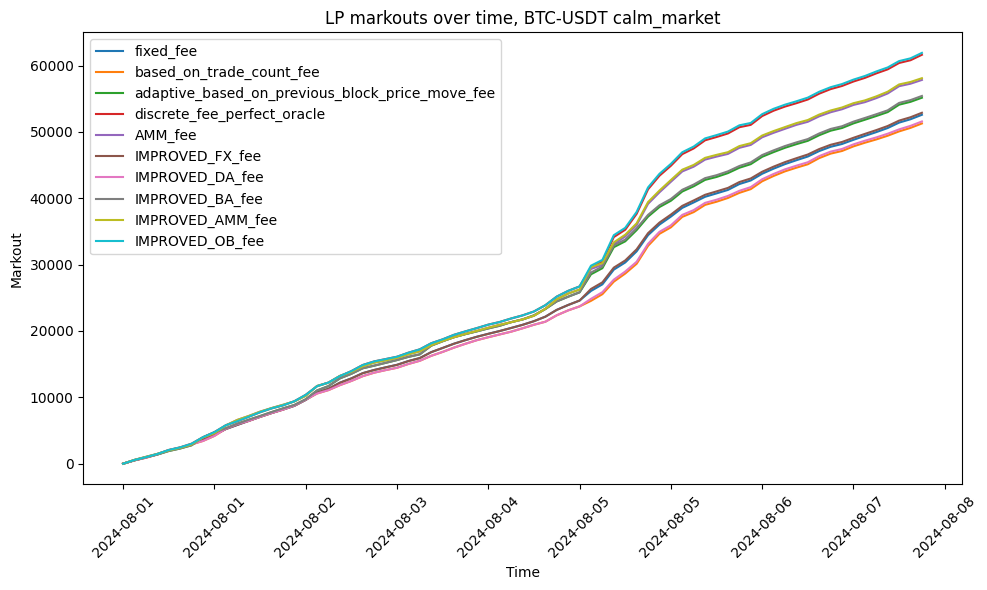

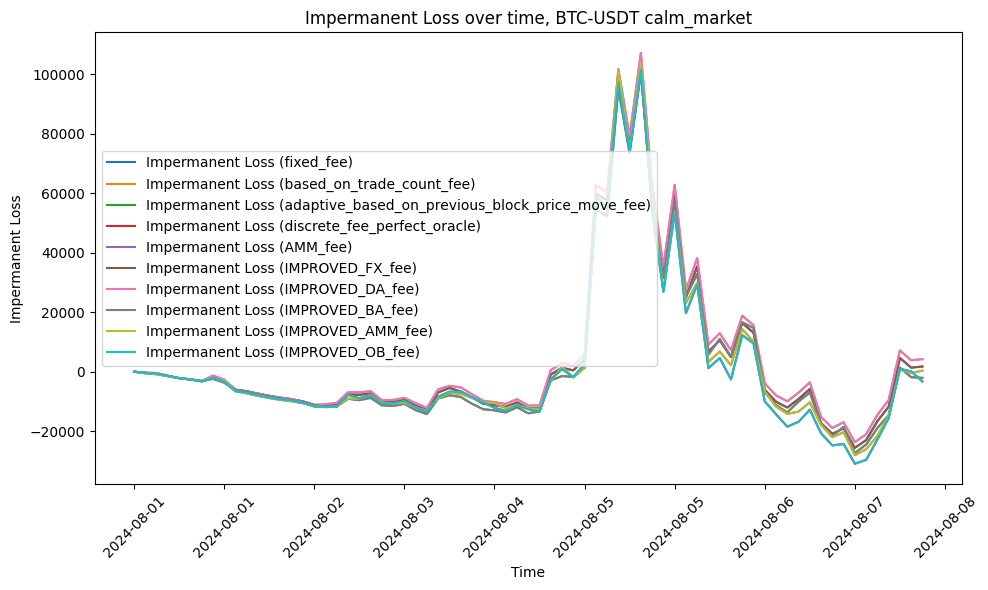

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,12501.69,1192,8.81,-58364.44,5240,-58.35,52584.64,21.74,1739.98
1,based_on_trade_count_fee,12567.81,1189,8.86,-58312.21,5242,-58.28,51275.25,21.19,4221.62
2,adaptive_based_on_previous_block_price_move_fee,12011.21,1165,8.70,-57881.55,5230,-57.97,55157.30,23.18,-2083.01
3,discrete_fee_perfect_oracle,9944.36,878,9.40,-57948.64,5232,-58.01,61628.23,29.97,-3315.83
4,AMM_fee,10699.87,1011,8.87,-57997.50,5232,-58.05,57835.90,26.23,339.98
5,IMPROVED_FX_fee,12856.83,1193,9.06,-58364.44,5240,-58.35,52886.59,21.86,1739.53
6,IMPROVED_DA_fee,12976.45,1190,9.14,-58312.21,5242,-58.28,51577.47,21.31,4221.38
7,IMPROVED_BA_fee,12241.07,1166,8.86,-57881.56,5230,-57.97,55420.51,23.29,-2083.80
8,IMPROVED_AMM_fee,10938.66,1012,9.07,-57991.96,5232,-58.05,58097.65,26.34,339.20
9,IMPROVED_OB_fee,10230.97,879,9.67,-57948.64,5232,-58.01,61913.02,30.11,-3316.47


In [35]:
plot_results_for_period(
    "BTC-USDT calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

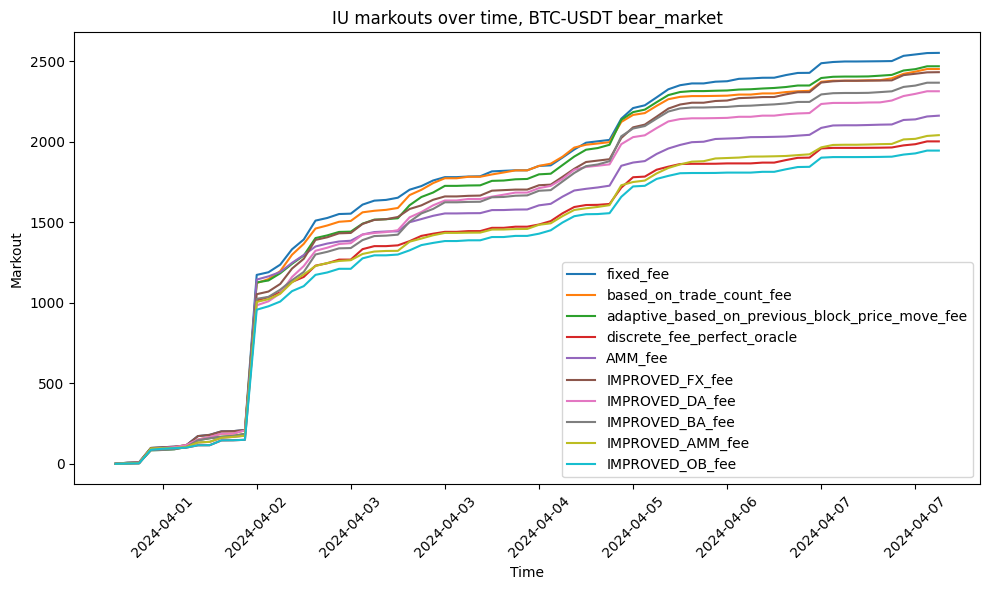

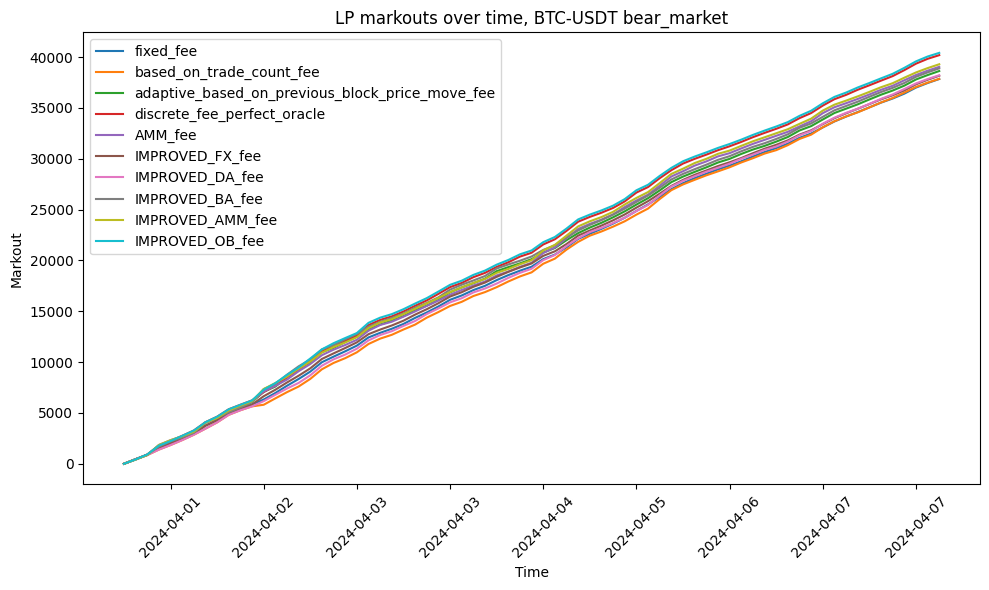

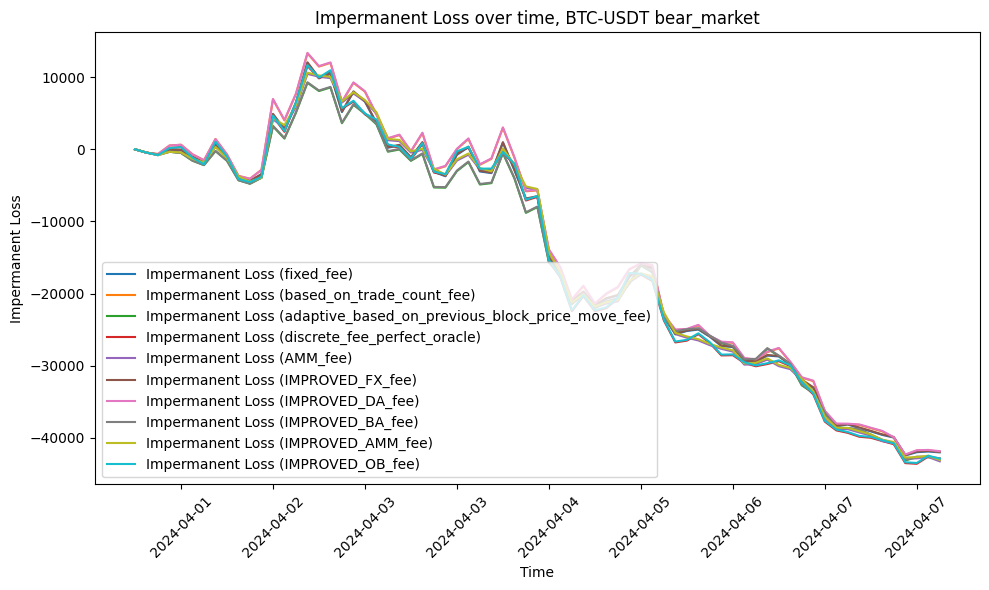

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2553.31,434,5.62,-58124.45,5235,-57.19,37849.51,25.74,-41998.97
1,based_on_trade_count_fee,2452.90,449,5.32,-58295.21,5230,-57.39,37862.83,25.63,-41897.60
2,adaptive_based_on_previous_block_price_move_fee,2470.08,437,5.48,-58088.60,5226,-57.27,38635.27,26.37,-42889.93
3,discrete_fee_perfect_oracle,2003.38,316,6.06,-58229.52,5223,-57.42,40196.41,29.89,-42988.88
4,AMM_fee,2163.13,397,5.38,-58305.18,5231,-57.40,39047.76,27.54,-43242.29
5,IMPROVED_FX_fee,2433.41,435,5.39,-58124.36,5235,-57.19,38170.01,26.00,-41921.85
6,IMPROVED_DA_fee,2314.86,451,5.04,-58304.92,5230,-57.40,38217.58,25.91,-41832.88
7,IMPROVED_BA_fee,2368.06,438,5.28,-58088.52,5226,-57.27,38898.44,26.60,-42812.15
8,IMPROVED_AMM_fee,2042.14,391,5.20,-58220.30,5229,-57.33,39299.22,27.90,-43064.92
9,IMPROVED_OB_fee,1946.18,316,5.93,-58229.39,5223,-57.42,40418.97,30.11,-42872.54


In [36]:
plot_results_for_period(
    "BTC-USDT bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

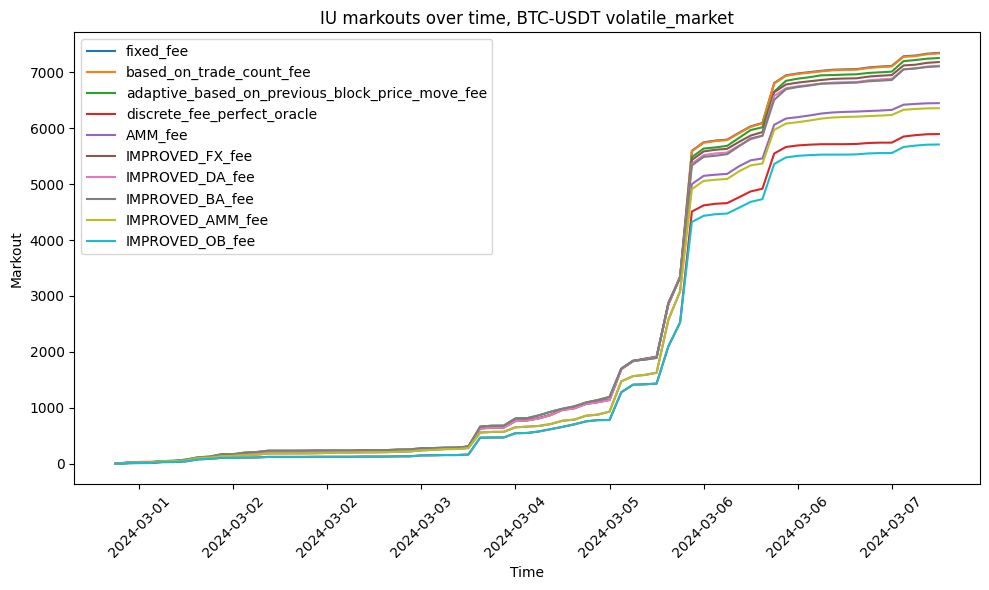

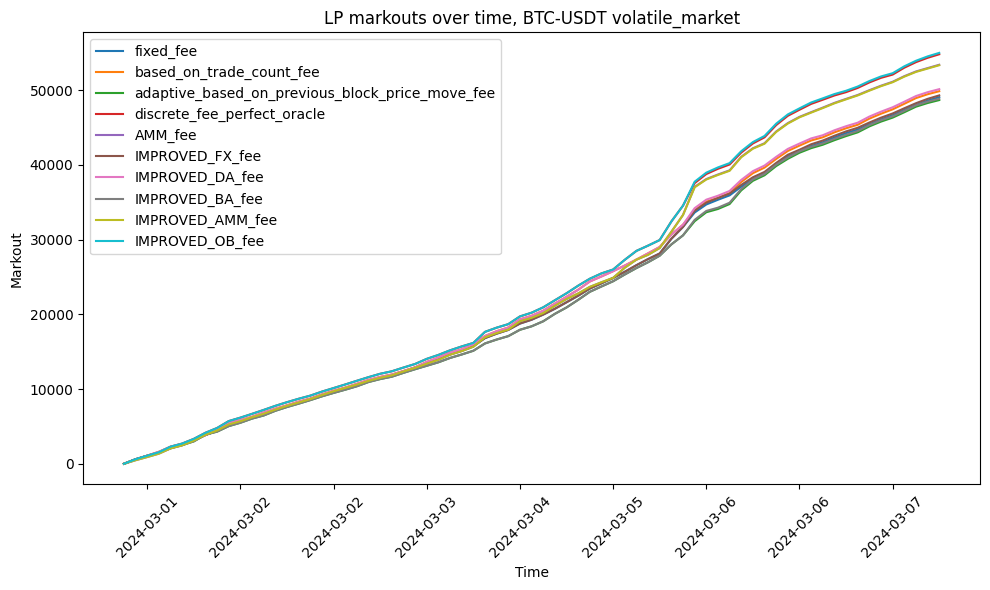

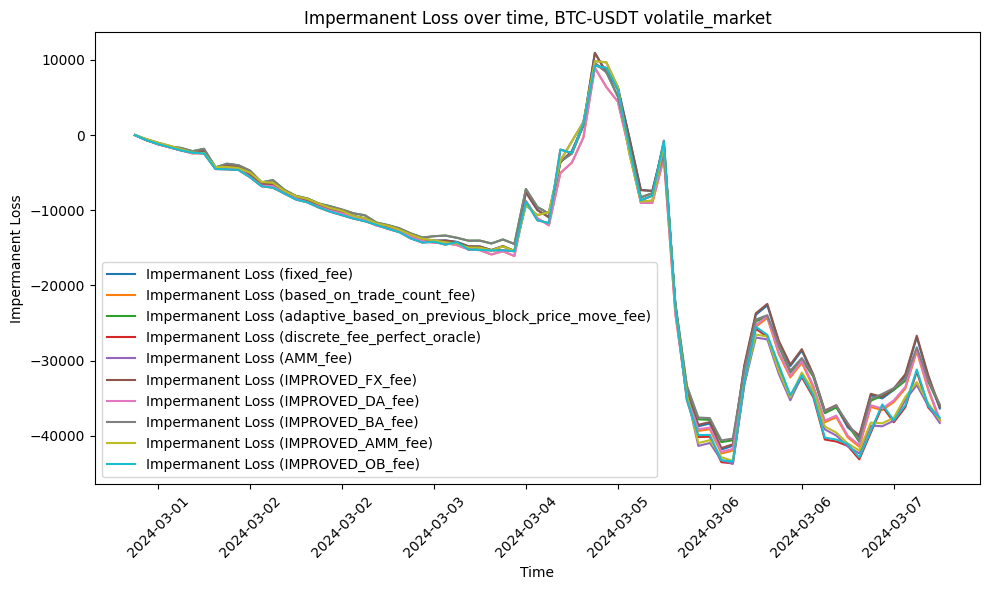

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,7345.42,872,7.27,-60090.20,5231,-56.21,49058.31,23.59,-36375.14
1,based_on_trade_count_fee,7335.42,872,7.26,-60130.16,5233,-56.22,49853.48,23.97,-38009.95
2,adaptive_based_on_previous_block_price_move_fee,7253.44,857,7.29,-60370.08,5232,-56.46,48664.48,23.58,-36040.23
3,discrete_fee_perfect_oracle,5894.30,629,7.98,-59723.71,5235,-55.82,54794.95,30.30,-37860.68
4,AMM_fee,6446.77,746,7.47,-59954.82,5233,-56.06,53391.42,27.62,-38291.15
5,IMPROVED_FX_fee,7181.48,871,7.15,-60090.12,5231,-56.21,49290.84,23.77,-36176.88
6,IMPROVED_DA_fee,7114.47,871,7.09,-60130.07,5233,-56.22,50126.35,24.18,-37784.49
7,IMPROVED_BA_fee,7104.30,856,7.19,-60369.74,5232,-56.46,48840.49,23.74,-35803.79
8,IMPROVED_AMM_fee,6356.16,745,7.40,-59954.67,5233,-56.06,53329.41,27.66,-37900.37
9,IMPROVED_OB_fee,5707.82,628,7.78,-59723.61,5235,-55.82,54980.82,30.49,-37606.47


In [37]:
plot_results_for_period(
    "BTC-USDT volatile_market",
    list(fee_algos_to_consider.keys()),
)

### Results: Non-stable / Non-stable (USDT-priced)

#### ETH/BTC

##### bull_market

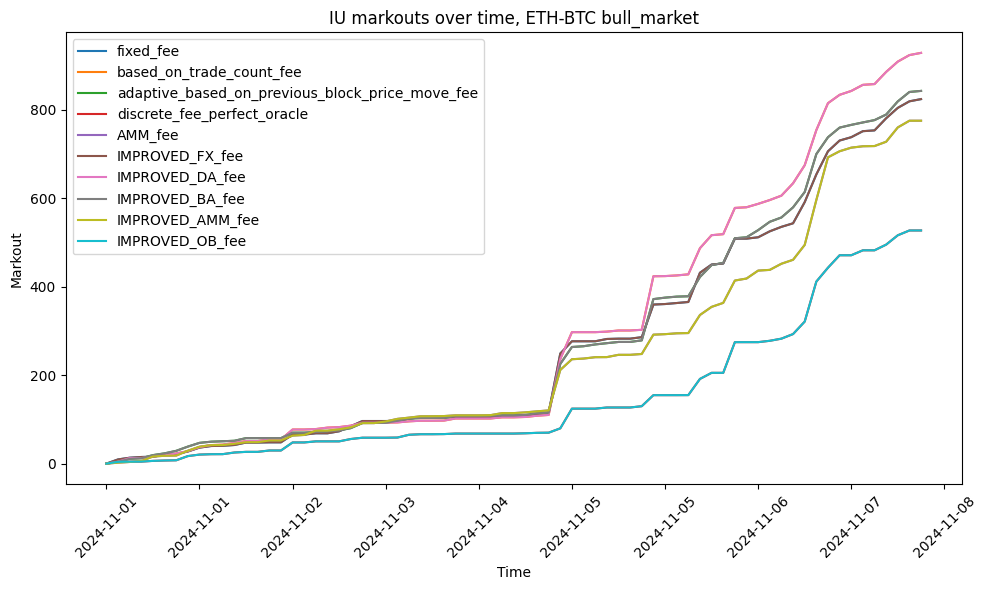

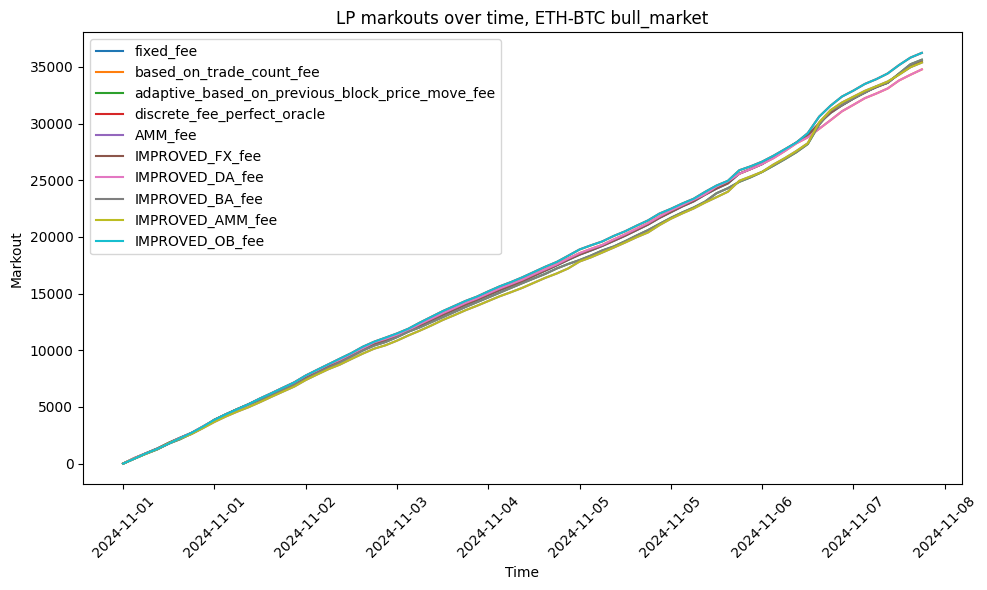

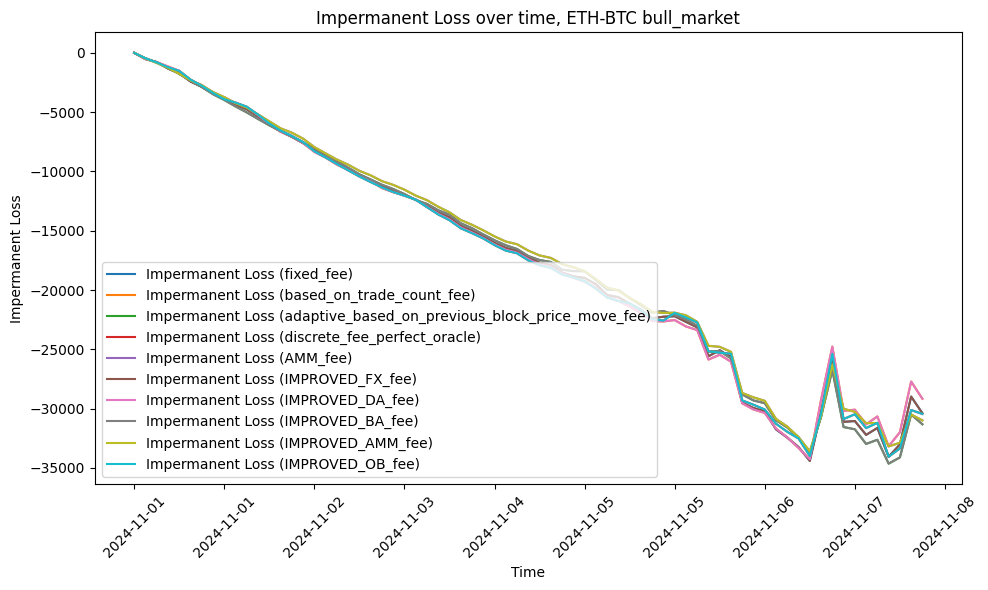

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,824.54,265,3.18,-59115.23,5219,-56.44,35463.88,27.14,-30393.16
1,based_on_trade_count_fee,929.13,254,3.65,-59221.26,5229,-56.41,34786.25,26.67,-29170.04
2,adaptive_based_on_previous_block_price_move_fee,843.10,271,3.17,-59456.20,5228,-56.65,35639.70,27.09,-31323.34
3,discrete_fee_perfect_oracle,527.41,173,3.06,-59391.62,5230,-56.59,36244.41,29.67,-30452.27
4,AMM_fee,775.67,238,3.28,-58961.56,5232,-56.14,35390.47,27.50,-30993.09
5,IMPROVED_FX_fee,824.54,265,3.18,-59115.23,5219,-56.44,35463.88,27.14,-30393.16
6,IMPROVED_DA_fee,929.13,254,3.65,-59221.26,5229,-56.41,34786.25,26.67,-29170.04
7,IMPROVED_BA_fee,843.10,271,3.17,-59456.20,5228,-56.65,35639.70,27.09,-31323.34
8,IMPROVED_AMM_fee,775.67,238,3.28,-58961.56,5232,-56.14,35390.47,27.50,-30993.09
9,IMPROVED_OB_fee,527.41,173,3.06,-59391.62,5230,-56.59,36244.41,29.67,-30452.27


In [38]:
plot_results_for_period(
    "ETH-BTC bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

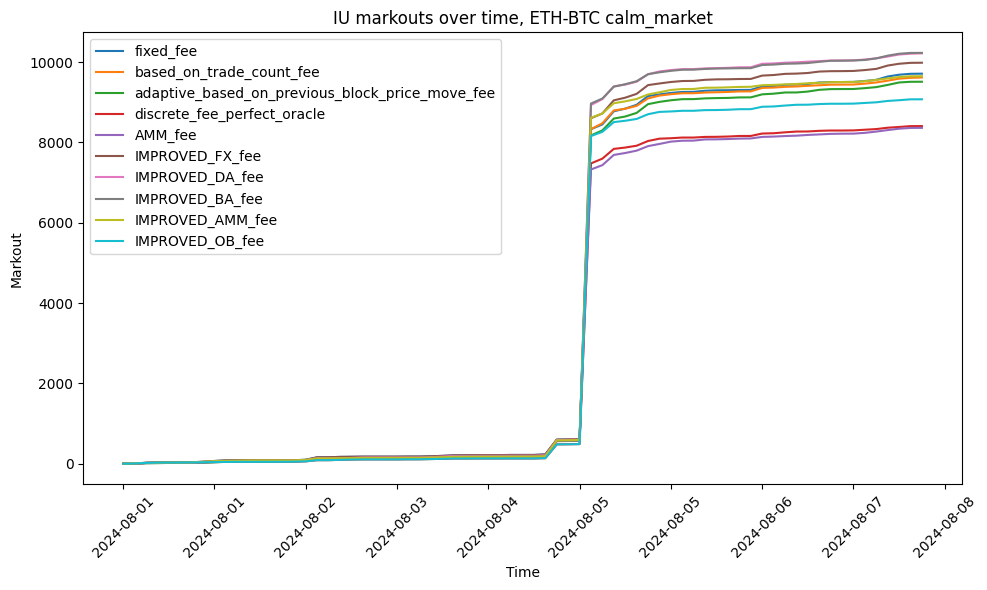

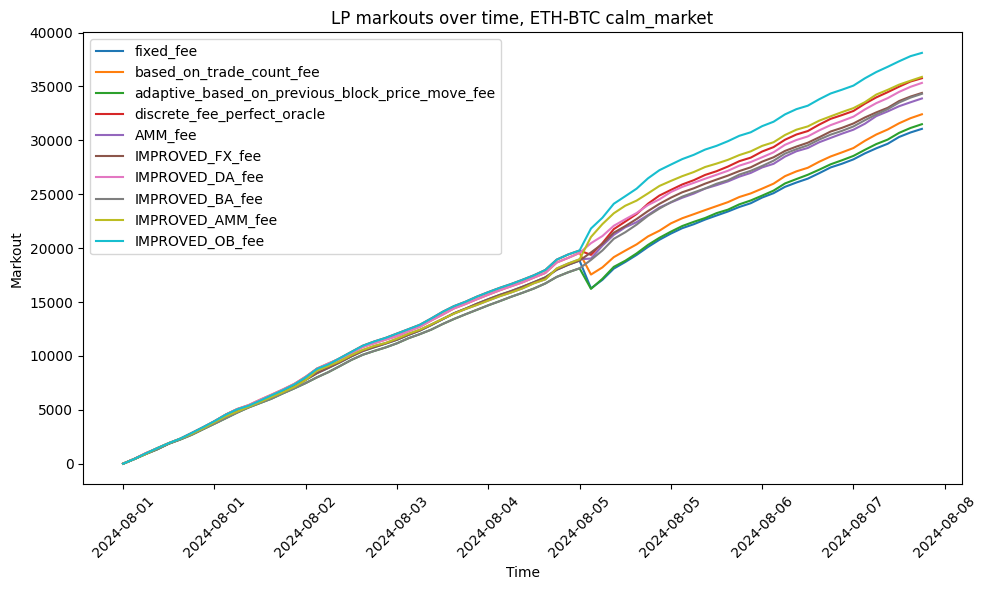

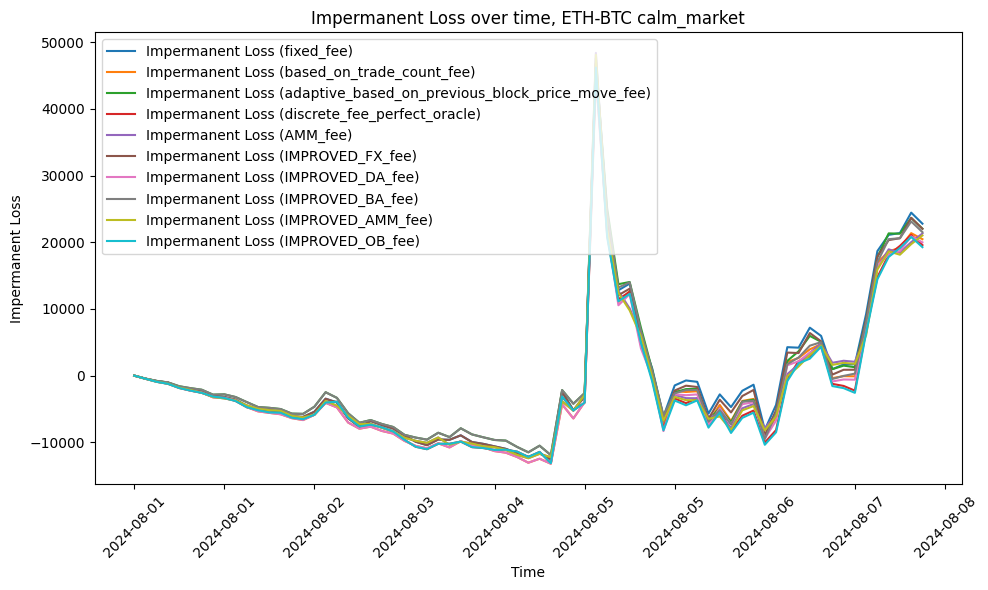

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,9711.57,483,17.21,-55174.76,5221,-59.79,31062.00,20.89,22784.02
1,based_on_trade_count_fee,9616.67,493,16.93,-55131.94,5227,-59.63,32415.13,21.72,20457.30
2,adaptive_based_on_previous_block_price_move_fee,9510.64,511,16.44,-55049.57,5223,-59.62,31494.48,20.97,22029.90
3,discrete_fee_perfect_oracle,8406.74,369,19.14,-55405.87,5234,-59.89,35758.16,26.21,19575.58
4,AMM_fee,8362.19,434,16.72,-55205.44,5216,-59.86,33881.03,23.82,21312.23
5,IMPROVED_FX_fee,9984.14,483,18.21,-55183.34,5221,-59.80,34393.45,23.38,22011.57
6,IMPROVED_DA_fee,10217.66,493,18.48,-55132.21,5227,-59.63,35324.71,23.91,19982.01
7,IMPROVED_BA_fee,10229.42,518,18.05,-55009.55,5222,-59.59,34312.19,23.03,21511.89
8,IMPROVED_AMM_fee,9648.73,433,19.78,-55206.14,5216,-59.86,35882.30,25.45,21016.06
9,IMPROVED_OB_fee,9073.47,368,21.30,-55374.64,5234,-59.86,38110.72,28.20,19263.30


In [39]:
plot_results_for_period(
    "ETH-BTC calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

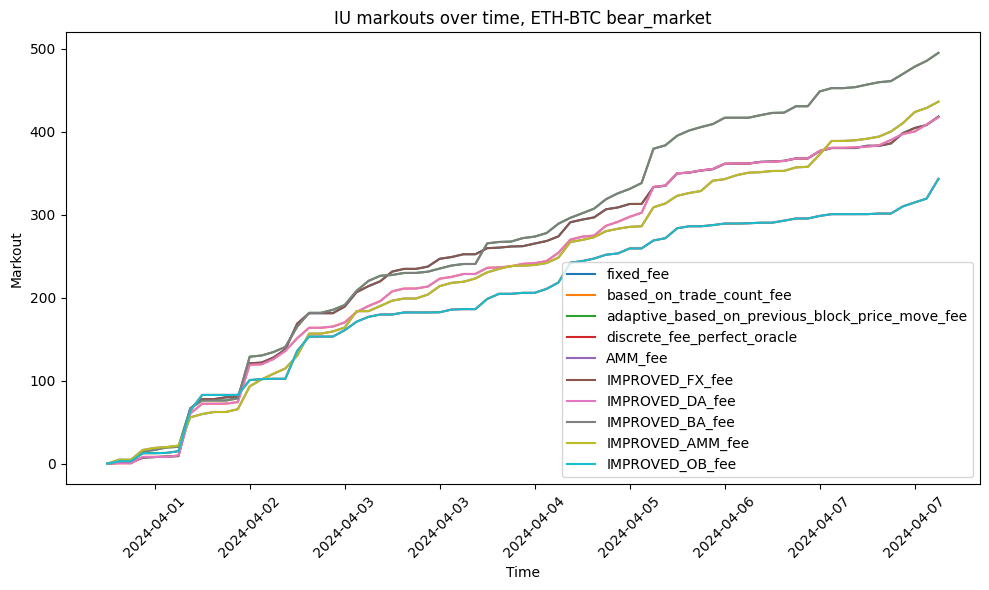

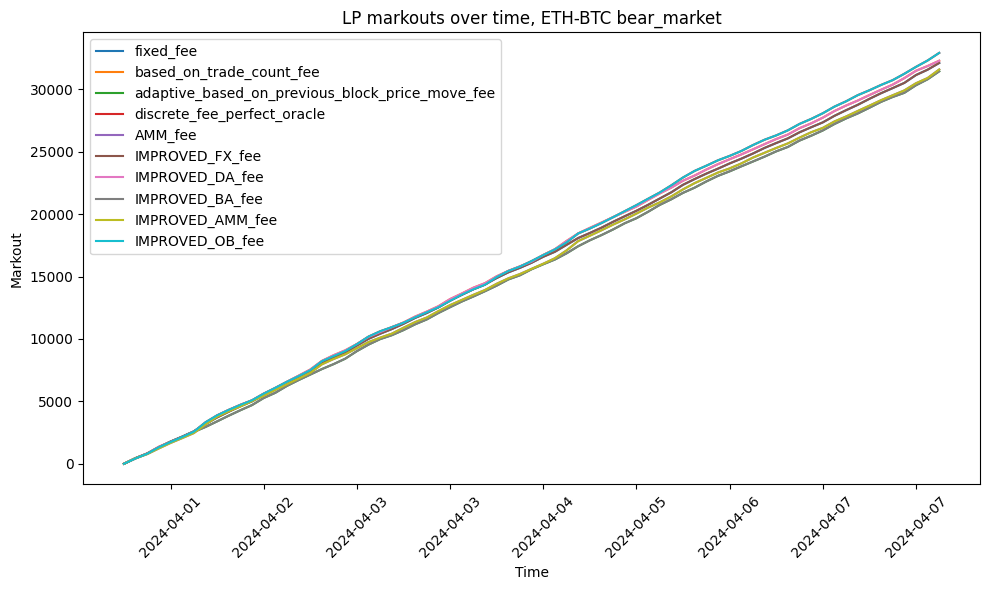

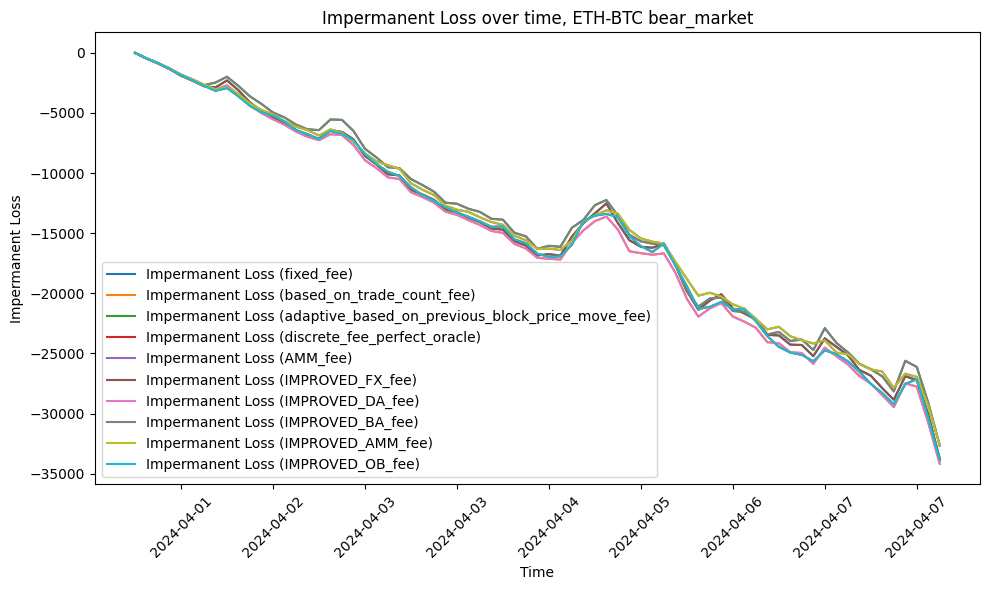

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,418.12,223,2.13,-57245.72,5226,-58.76,32105.54,27.43,-33768.86
1,based_on_trade_count_fee,417.30,221,2.14,-57123.60,5222,-58.67,32284.89,27.63,-34182.83
2,adaptive_based_on_previous_block_price_move_fee,494.87,236,2.34,-57067.83,5212,-58.74,31436.38,26.58,-32665.15
3,discrete_fee_perfect_oracle,343.15,166,2.32,-57147.14,5214,-58.78,32913.16,29.38,-33896.45
4,AMM_fee,436.06,210,2.32,-57239.38,5234,-58.65,31584.06,27.13,-32650.59
5,IMPROVED_FX_fee,418.12,223,2.13,-57245.72,5226,-58.76,32105.54,27.43,-33768.86
6,IMPROVED_DA_fee,417.30,221,2.14,-57123.60,5222,-58.67,32284.89,27.63,-34182.83
7,IMPROVED_BA_fee,494.87,236,2.34,-57067.83,5212,-58.74,31436.38,26.58,-32665.15
8,IMPROVED_AMM_fee,436.06,210,2.32,-57239.38,5234,-58.65,31584.06,27.13,-32650.59
9,IMPROVED_OB_fee,343.15,166,2.32,-57147.14,5214,-58.78,32913.16,29.38,-33896.45


In [40]:
plot_results_for_period(
    "ETH-BTC bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

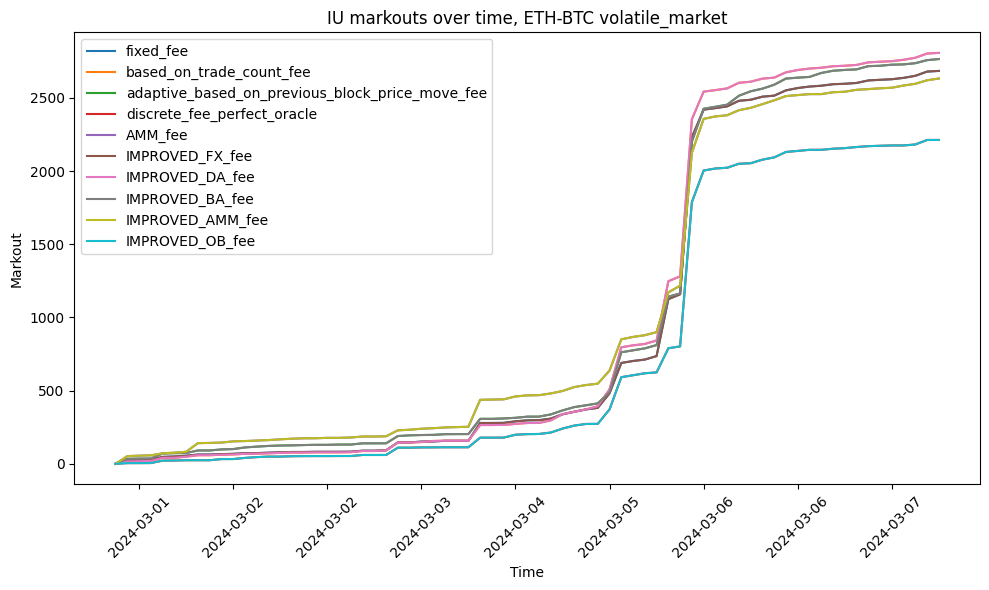

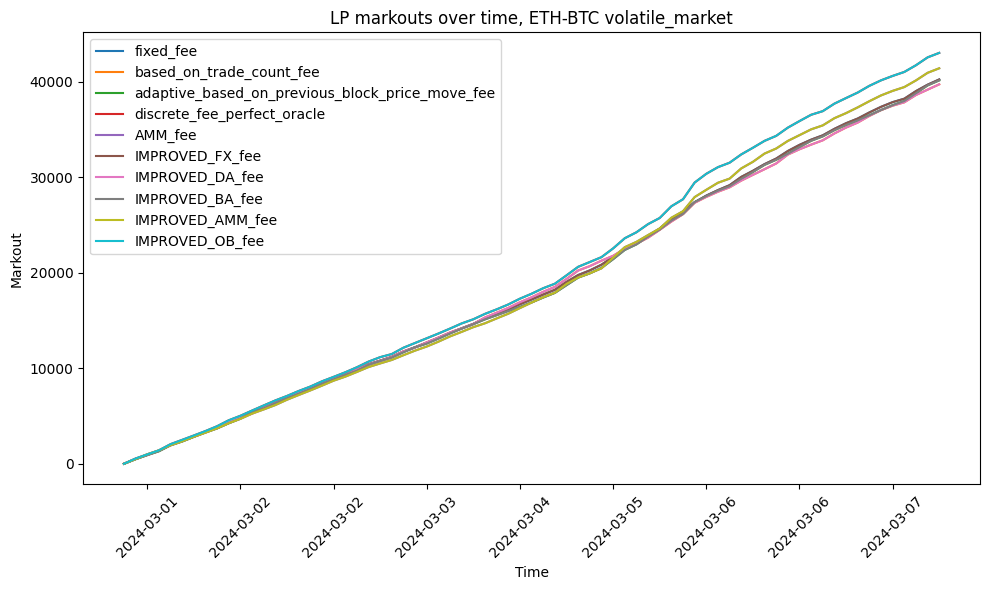

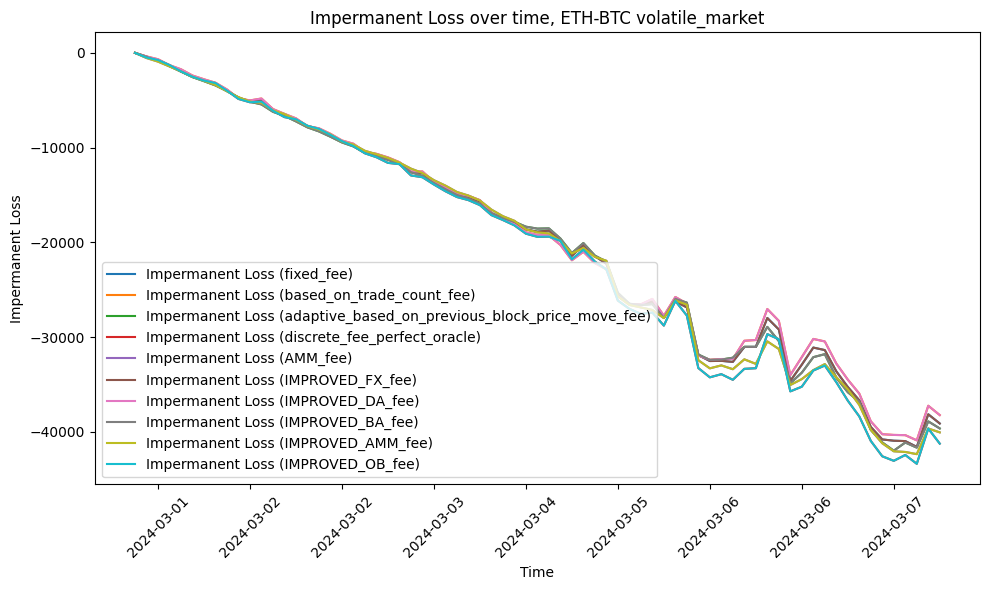

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2684.95,416,5.92,-60727.30,5219,-55.08,40230.36,25.86,-39104.16
1,based_on_trade_count_fee,2808.22,416,6.16,-60833.58,5223,-55.13,39718.71,25.47,-38218.22
2,adaptive_based_on_previous_block_price_move_fee,2765.98,415,6.07,-61010.59,5224,-55.26,40132.61,25.73,-39626.49
3,discrete_fee_perfect_oracle,2213.18,291,6.76,-61224.68,5240,-55.28,43010.48,29.97,-41229.04
4,AMM_fee,2632.94,389,6.15,-61149.13,5221,-55.40,41398.19,27.03,-40042.79
5,IMPROVED_FX_fee,2684.95,416,5.92,-60727.30,5219,-55.08,40230.36,25.86,-39104.16
6,IMPROVED_DA_fee,2808.22,416,6.16,-60833.58,5223,-55.13,39718.71,25.47,-38218.22
7,IMPROVED_BA_fee,2765.98,415,6.07,-61010.59,5224,-55.26,40132.61,25.73,-39626.49
8,IMPROVED_AMM_fee,2632.94,389,6.15,-61149.13,5221,-55.40,41398.19,27.03,-40042.79
9,IMPROVED_OB_fee,2213.18,291,6.76,-61224.68,5240,-55.28,43010.48,29.97,-41229.04


In [41]:
plot_results_for_period(
    "ETH-BTC volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### BNB/ETH

##### bull_market

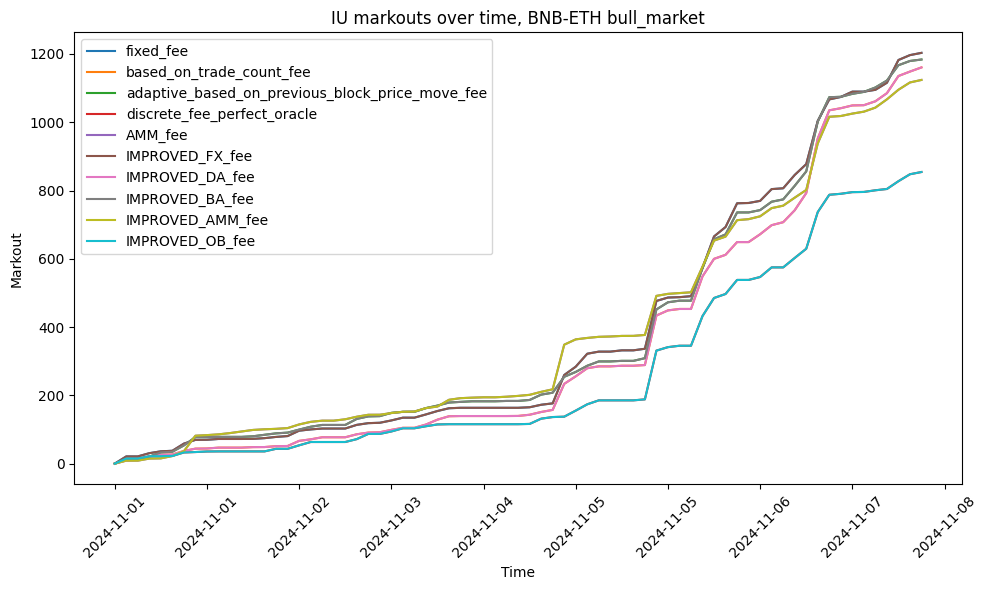

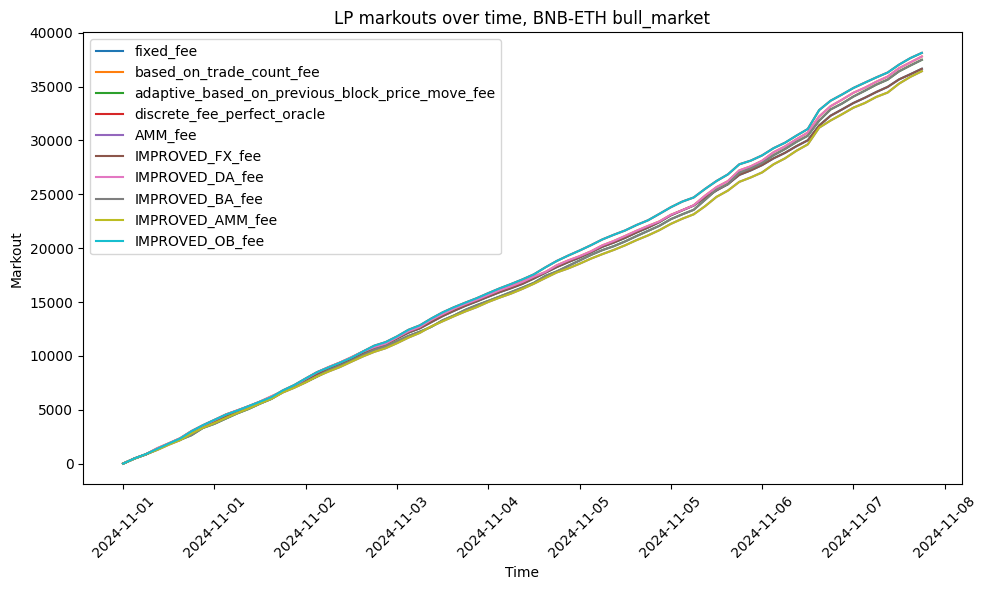

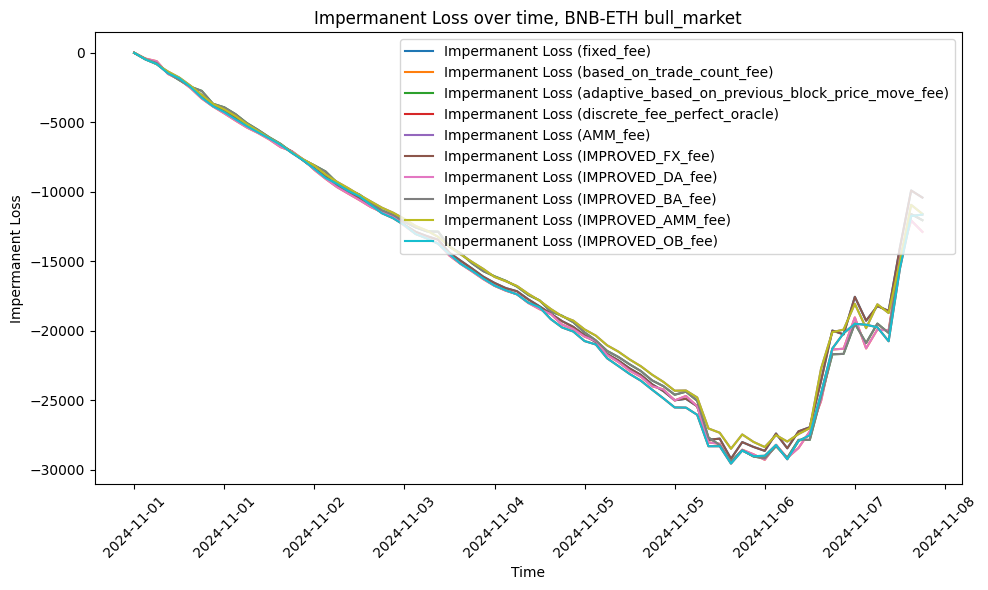

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,1203.29,323,3.70,-59621.25,5232,-57.14,36646.78,26.78,-10418.63
1,based_on_trade_count_fee,1160.67,329,3.54,-59666.87,5242,-57.07,37784.34,27.51,-12888.05
2,adaptive_based_on_previous_block_price_move_fee,1183.81,347,3.43,-59320.97,5225,-56.94,37478.62,27.02,-12047.89
3,discrete_fee_perfect_oracle,854.26,227,3.73,-59380.67,5232,-56.91,38121.45,29.96,-11645.72
4,AMM_fee,1123.98,309,3.66,-59135.00,5236,-56.63,36419.38,26.94,-11594.79
5,IMPROVED_FX_fee,1203.29,323,3.70,-59621.25,5232,-57.14,36646.78,26.78,-10418.63
6,IMPROVED_DA_fee,1160.67,329,3.54,-59666.87,5242,-57.07,37784.34,27.51,-12888.05
7,IMPROVED_BA_fee,1183.81,347,3.43,-59320.97,5225,-56.94,37478.62,27.02,-12047.89
8,IMPROVED_AMM_fee,1123.98,309,3.66,-59135.00,5236,-56.63,36419.38,26.94,-11594.79
9,IMPROVED_OB_fee,854.26,227,3.73,-59380.67,5232,-56.91,38121.45,29.96,-11645.72


In [42]:
plot_results_for_period(
    "BNB-ETH bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

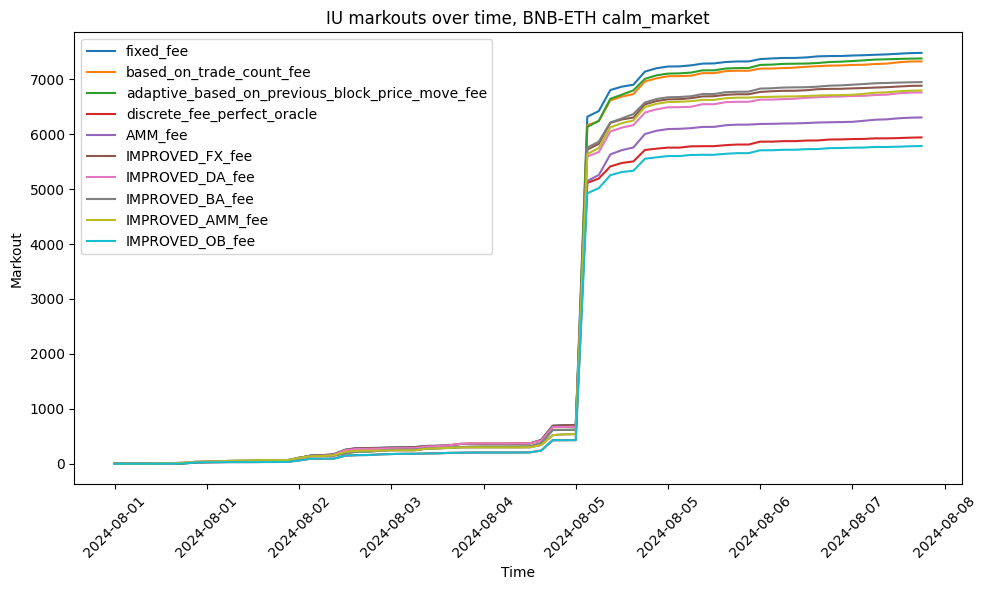

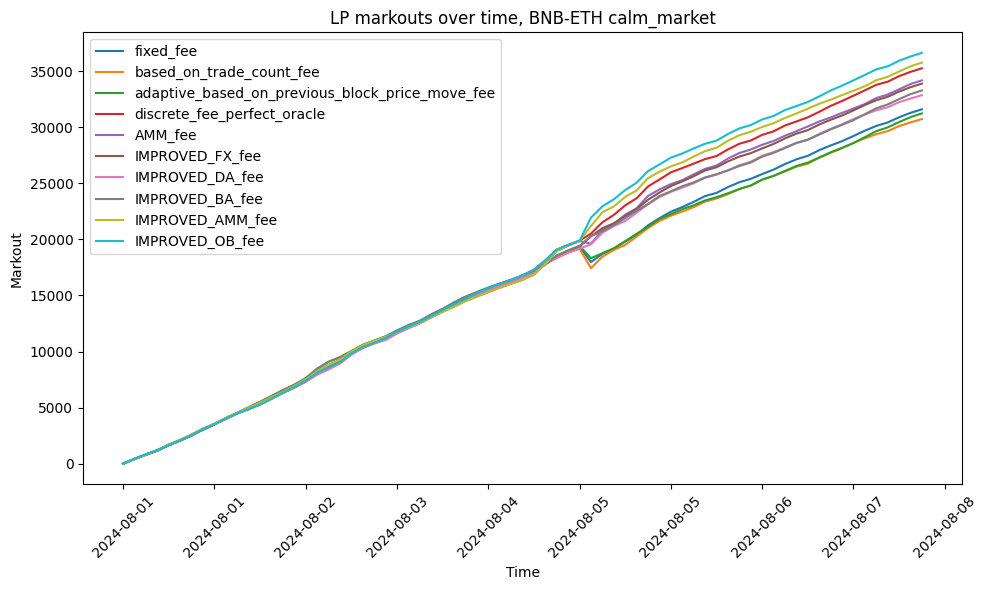

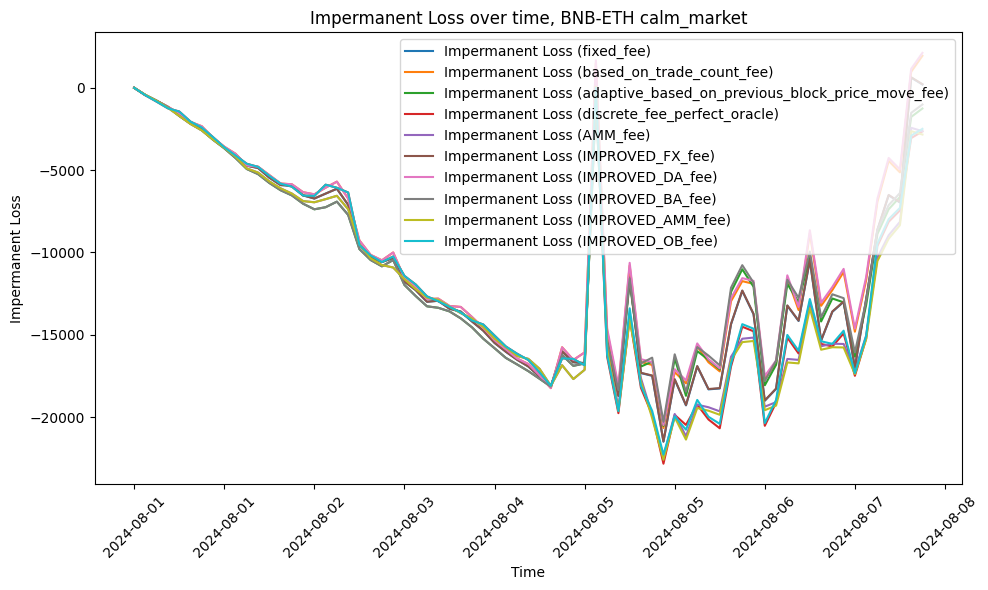

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,7480.59,467,14.57,-55302.72,5236,-60.52,31589.65,22.14,200.92
1,based_on_trade_count_fee,7325.12,466,14.35,-55079.24,5226,-60.38,30717.40,21.59,1945.94
2,adaptive_based_on_previous_block_price_move_fee,7379.22,475,14.26,-55329.85,5244,-60.46,31227.47,21.80,-1254.33
3,discrete_fee_perfect_oracle,5941.36,334,15.83,-55265.22,5232,-60.52,35246.92,27.35,-2645.13
4,AMM_fee,6305.02,448,13.00,-55107.94,5230,-60.36,34166.72,24.44,-2633.51
5,IMPROVED_FX_fee,6883.16,468,13.83,-55289.98,5236,-60.51,33876.67,24.00,220.86
6,IMPROVED_DA_fee,6759.58,466,13.71,-55079.15,5226,-60.38,32846.27,23.37,2123.52
7,IMPROVED_BA_fee,6948.19,474,13.88,-55326.21,5244,-60.46,33270.86,23.50,-1011.59
8,IMPROVED_AMM_fee,6796.68,449,14.28,-55108.50,5230,-60.36,35750.39,25.74,-2835.75
9,IMPROVED_OB_fee,5784.50,332,15.81,-55207.54,5232,-60.46,36619.42,28.63,-2491.94


In [43]:
plot_results_for_period(
    "BNB-ETH calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

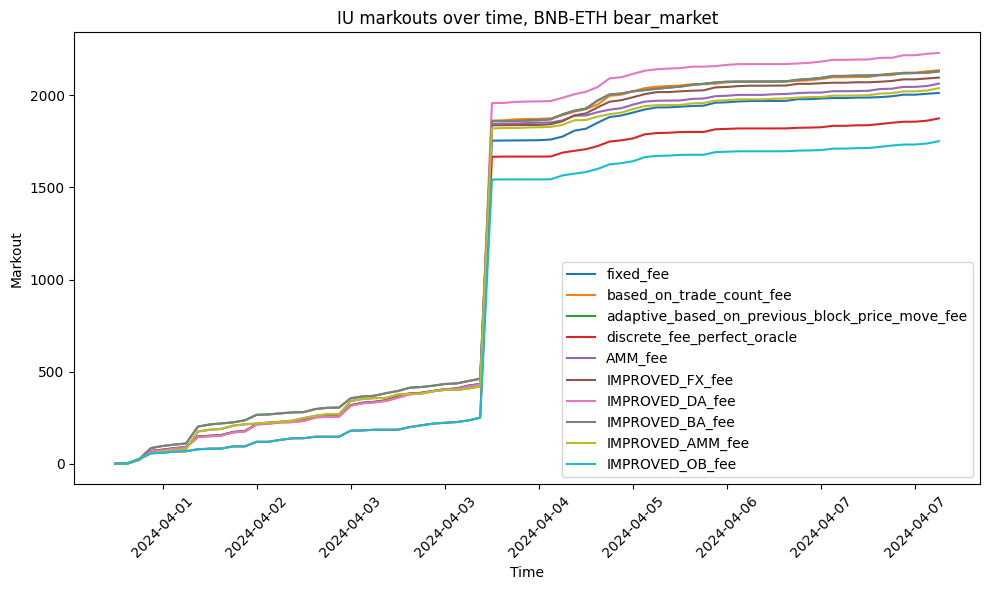

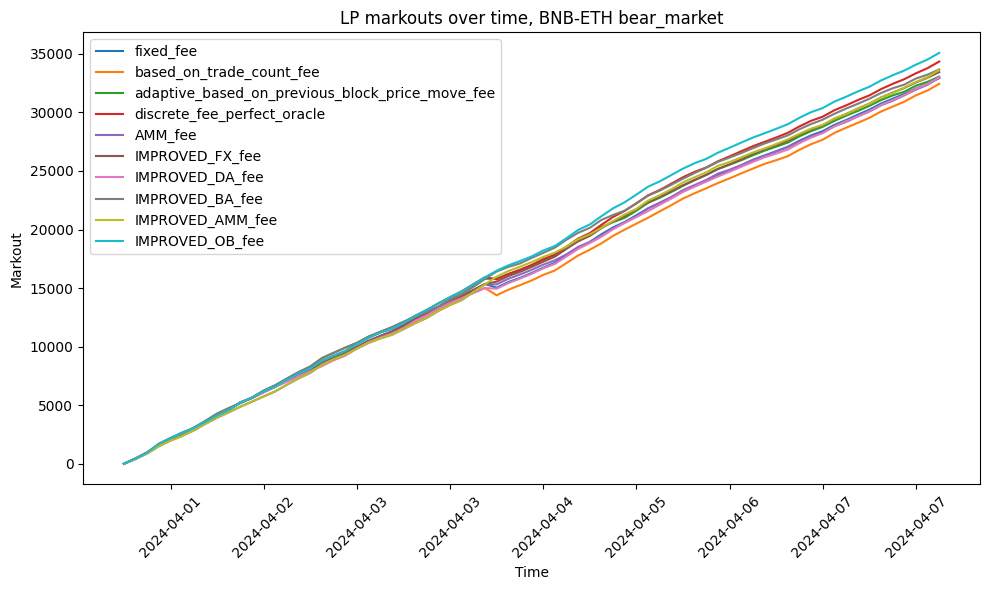

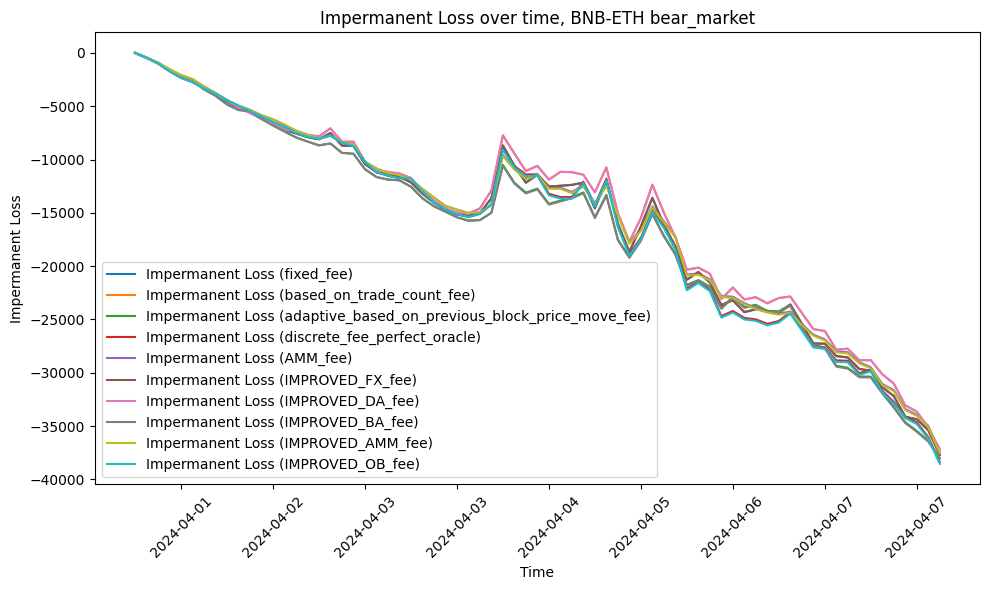

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2012.84,299,7.04,-57048.34,5243,-58.34,32922.22,26.05,-37693.37
1,based_on_trade_count_fee,2135.57,291,7.59,-56725.04,5225,-58.22,32433.87,25.83,-37183.88
2,adaptive_based_on_previous_block_price_move_fee,2130.60,321,6.98,-56725.52,5215,-58.32,33055.67,25.86,-37992.45
3,discrete_fee_perfect_oracle,1874.66,209,9.17,-56889.80,5231,-58.30,34342.04,29.10,-38391.90
4,AMM_fee,2063.23,270,7.94,-56658.12,5228,-58.12,32961.75,26.70,-37438.01
5,IMPROVED_FX_fee,2096.03,299,7.33,-57048.34,5243,-58.34,33436.26,26.45,-37694.17
6,IMPROVED_DA_fee,2230.18,291,7.93,-56725.04,5225,-58.22,32998.69,26.28,-37184.35
7,IMPROVED_BA_fee,2129.47,321,6.97,-56725.58,5215,-58.32,33666.59,26.34,-38069.17
8,IMPROVED_AMM_fee,2038.87,270,7.85,-56658.20,5228,-58.12,33622.07,27.23,-37541.07
9,IMPROVED_OB_fee,1750.80,210,8.57,-56873.90,5231,-58.28,35078.92,29.72,-38537.58


In [44]:
plot_results_for_period(
    "BNB-ETH bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

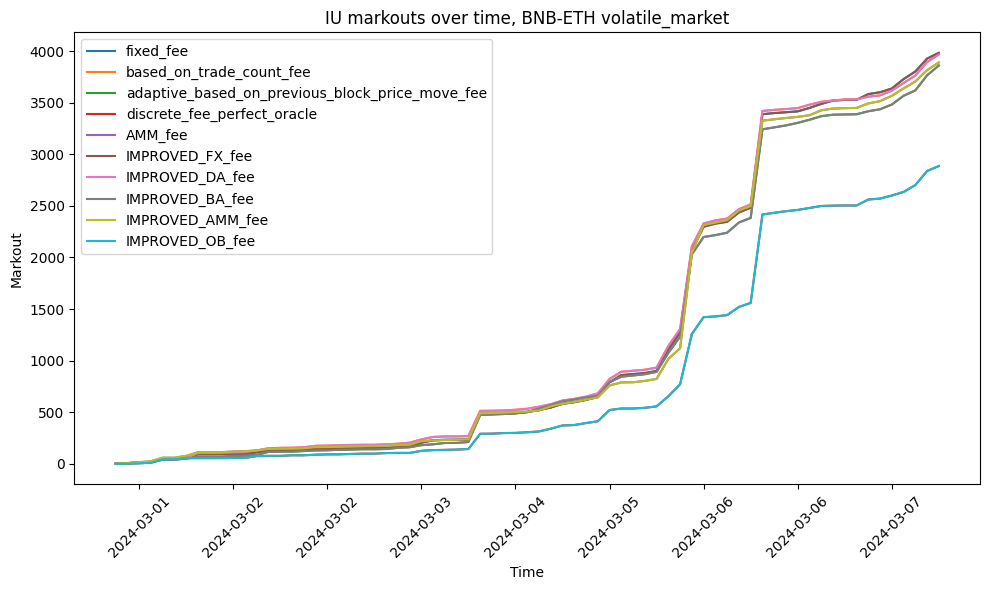

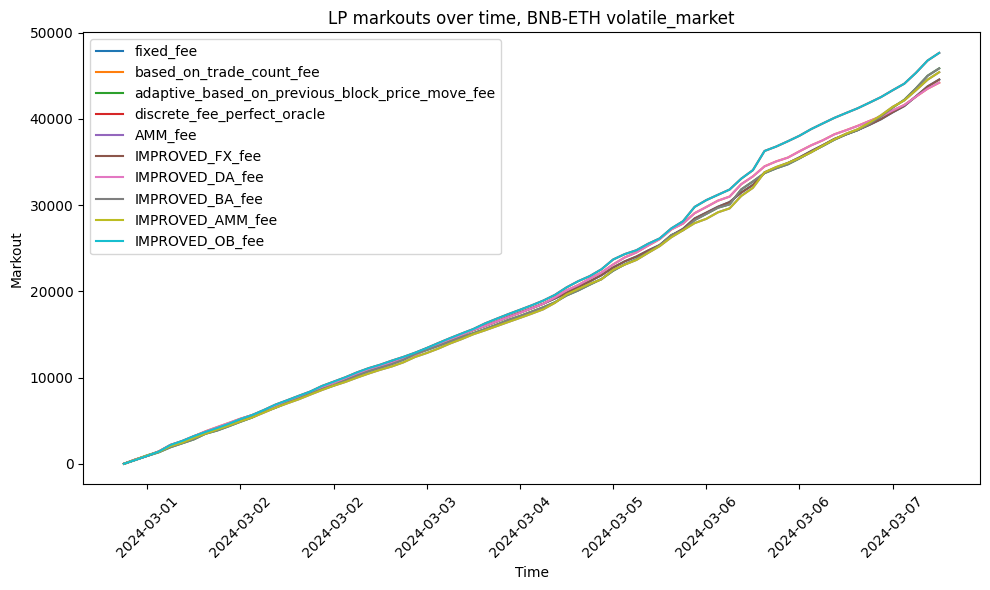

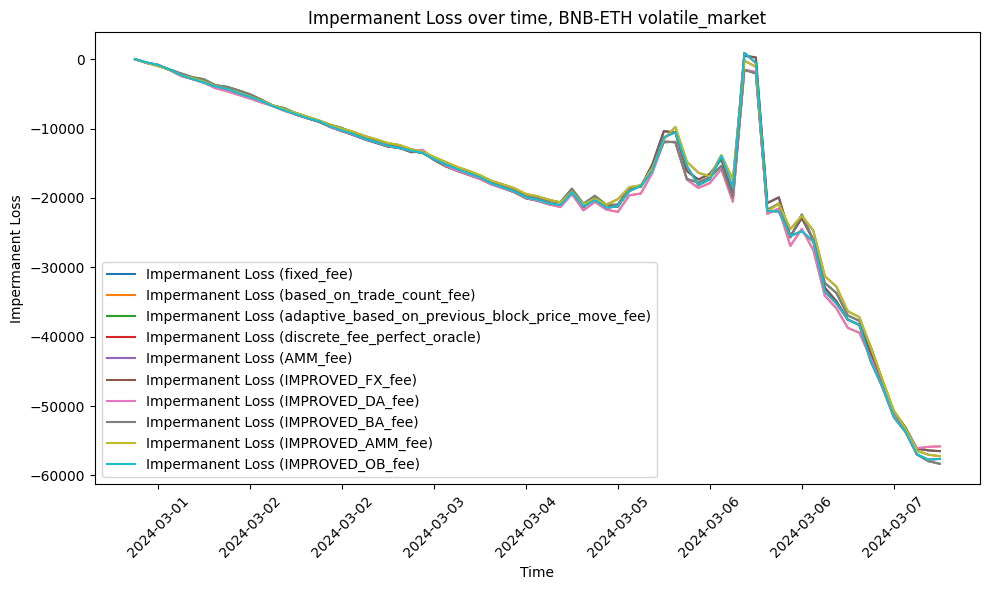

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,3983.09,597,5.92,-60776.62,5230,-55.25,44561.16,25.13,-56505.74
1,based_on_trade_count_fee,3967.32,595,5.92,-60759.89,5225,-55.28,44199.64,24.98,-55818.31
2,adaptive_based_on_previous_block_price_move_fee,3860.56,586,5.84,-60665.10,5245,-54.99,45857.40,25.99,-58328.16
3,discrete_fee_perfect_oracle,2886.07,400,6.20,-60527.49,5237,-54.95,47652.59,30.41,-57631.60
4,AMM_fee,3890.17,524,6.49,-60396.89,5234,-54.84,45414.76,26.69,-57235.89
5,IMPROVED_FX_fee,3983.09,597,5.92,-60776.62,5230,-55.25,44561.16,25.13,-56505.74
6,IMPROVED_DA_fee,3967.32,595,5.92,-60759.89,5225,-55.28,44199.64,24.98,-55818.31
7,IMPROVED_BA_fee,3860.56,586,5.84,-60665.10,5245,-54.99,45857.40,25.99,-58328.16
8,IMPROVED_AMM_fee,3890.17,524,6.49,-60396.89,5234,-54.84,45414.76,26.69,-57235.89
9,IMPROVED_OB_fee,2886.07,400,6.20,-60527.49,5237,-54.95,47652.59,30.41,-57631.60


In [45]:
plot_results_for_period(
    "BNB-ETH volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### DOGE/BTC

##### bull_market

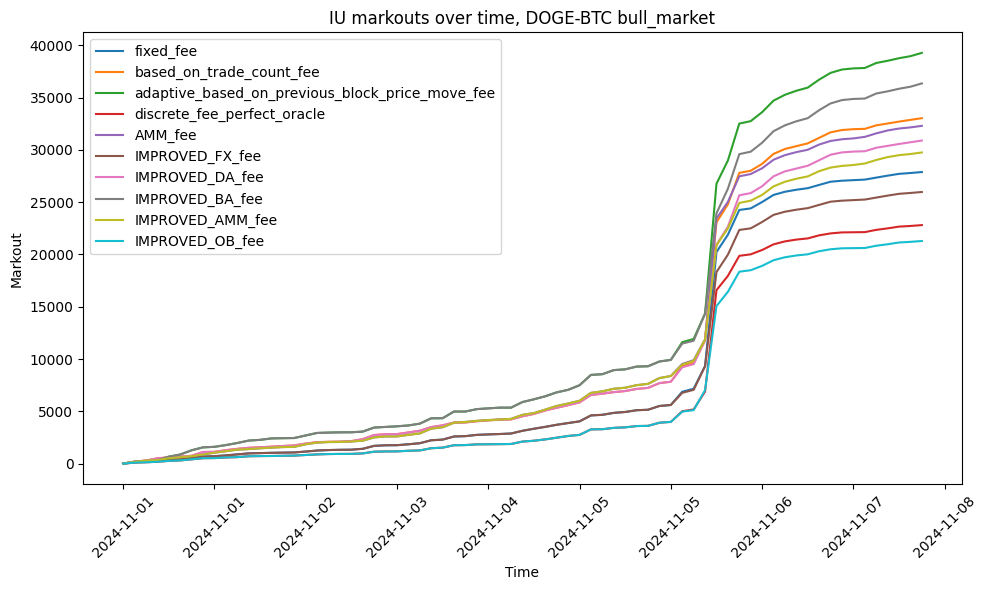

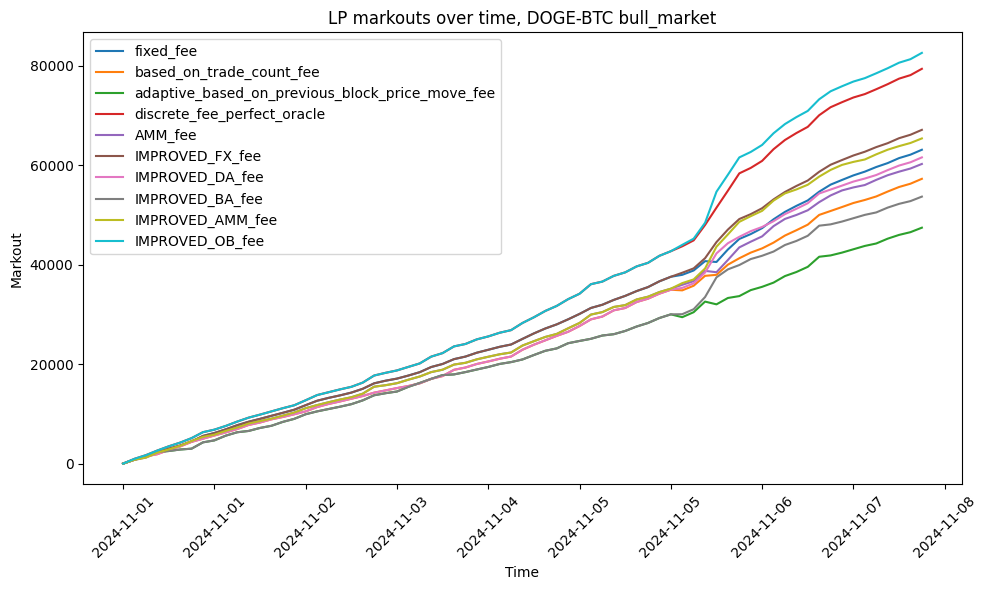

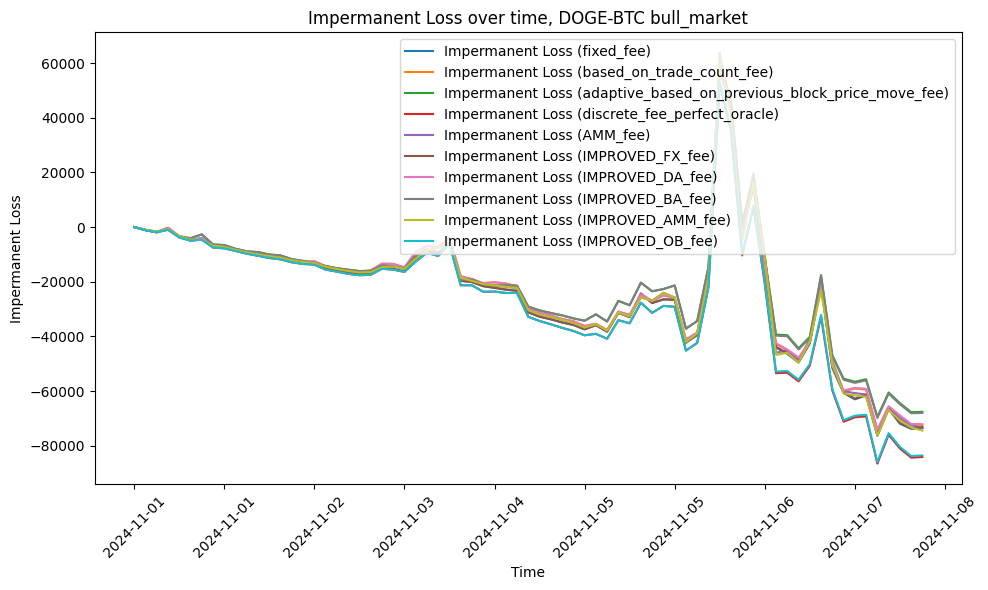

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,27883.93,1611,12.17,-59715.49,5224,-55.98,63081.80,18.79,-73420.60
1,based_on_trade_count_fee,33036.12,1294,15.14,-60051.53,5228,-56.25,57240.88,17.62,-72352.90
2,adaptive_based_on_previous_block_price_move_fee,39280.18,1125,18.73,-60180.37,5234,-56.31,47419.07,14.98,-67566.32
3,discrete_fee_perfect_oracle,22809.88,1204,13.21,-59853.29,5210,-56.25,79348.80,28.43,-84100.39
4,AMM_fee,32301.49,1067,17.11,-60752.88,5220,-56.99,60227.56,20.39,-73612.16
5,IMPROVED_FX_fee,25975.14,1610,11.50,-59792.07,5224,-56.06,67082.75,20.17,-73148.19
6,IMPROVED_DA_fee,30895.11,1291,14.38,-60032.47,5228,-56.23,61547.07,19.14,-72090.72
7,IMPROVED_BA_fee,36358.83,1129,17.65,-60116.90,5230,-56.30,53662.27,17.15,-67972.52
8,IMPROVED_AMM_fee,29755.54,1068,15.94,-60750.37,5220,-56.99,65358.51,22.29,-74441.00
9,IMPROVED_OB_fee,21291.11,1205,12.52,-59899.52,5212,-56.26,82552.89,29.86,-83506.50


In [46]:
plot_results_for_period(
    "DOGE-BTC bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

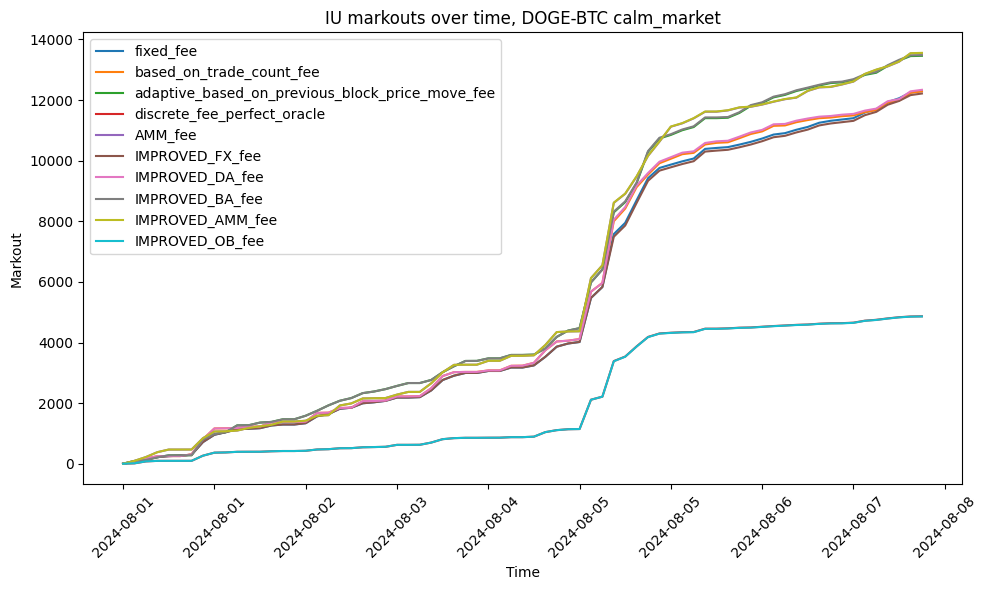

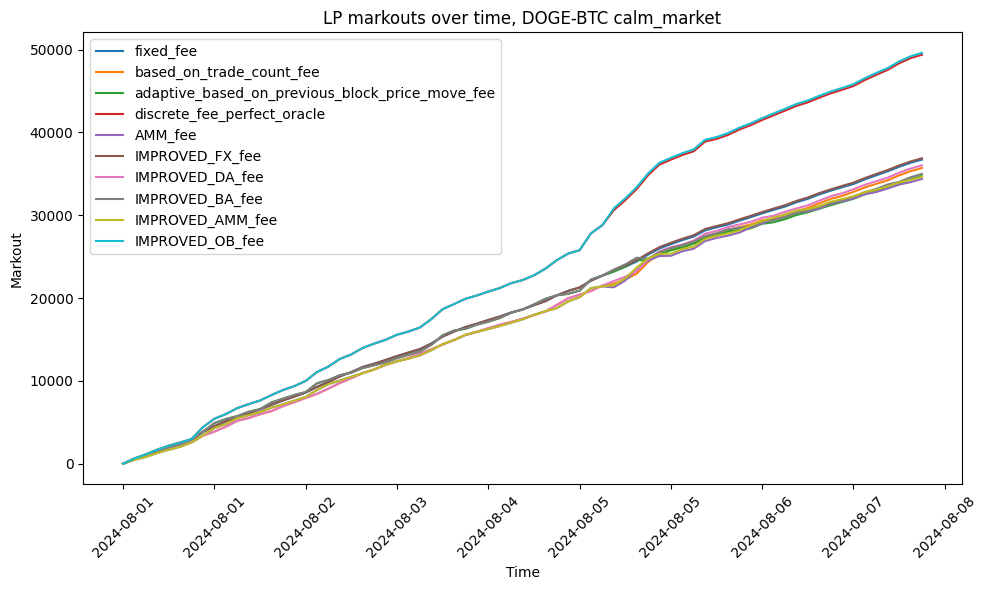

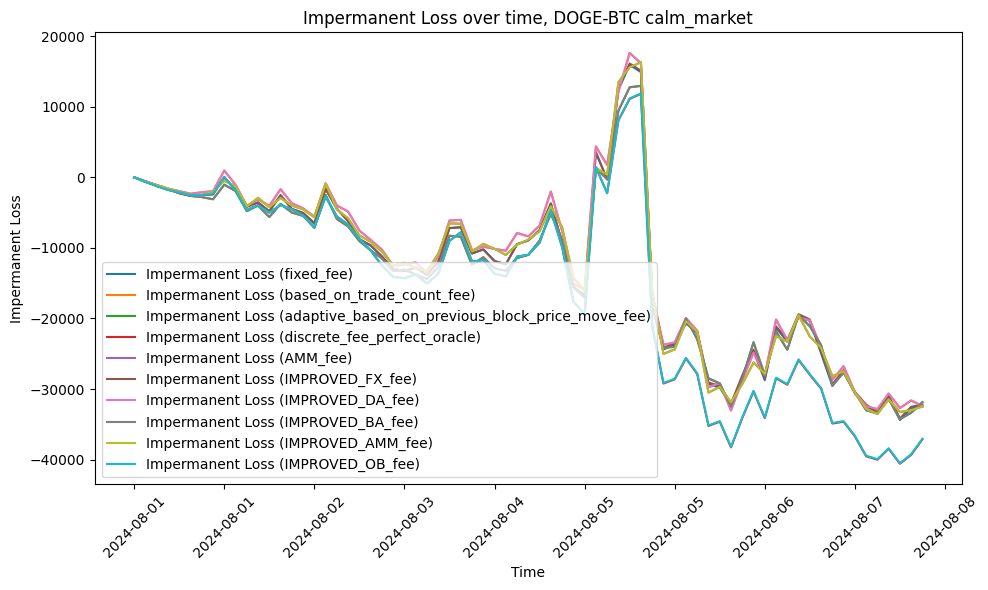

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,12304.75,473,14.84,-55749.89,5243,-59.83,36712.26,20.85,-32437.57
1,based_on_trade_count_fee,12287.63,563,14.81,-55429.25,5236,-59.57,35700.37,20.28,-32414.92
2,adaptive_based_on_previous_block_price_move_fee,13460.55,494,17.14,-56172.71,5248,-60.21,34741.86,20.22,-31852.33
3,discrete_fee_perfect_oracle,4864.81,654,7.09,-55528.81,5226,-59.78,49378.60,30.58,-37124.59
4,AMM_fee,13551.13,496,17.33,-56159.12,5232,-60.36,34375.91,20.08,-32483.75
5,IMPROVED_FX_fee,12216.35,470,14.85,-55723.36,5243,-59.80,36872.65,21.02,-32221.88
6,IMPROVED_DA_fee,12338.26,562,14.88,-55446.78,5236,-59.59,36021.81,20.47,-32384.12
7,IMPROVED_BA_fee,13484.47,495,17.16,-56172.42,5248,-60.21,34992.91,20.36,-31871.85
8,IMPROVED_AMM_fee,13557.94,497,17.34,-56151.92,5232,-60.36,34635.37,20.23,-32490.67
9,IMPROVED_OB_fee,4859.93,653,7.10,-55524.42,5226,-59.77,49601.56,30.74,-37048.69


In [48]:
plot_results_for_period(
    "DOGE-BTC calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

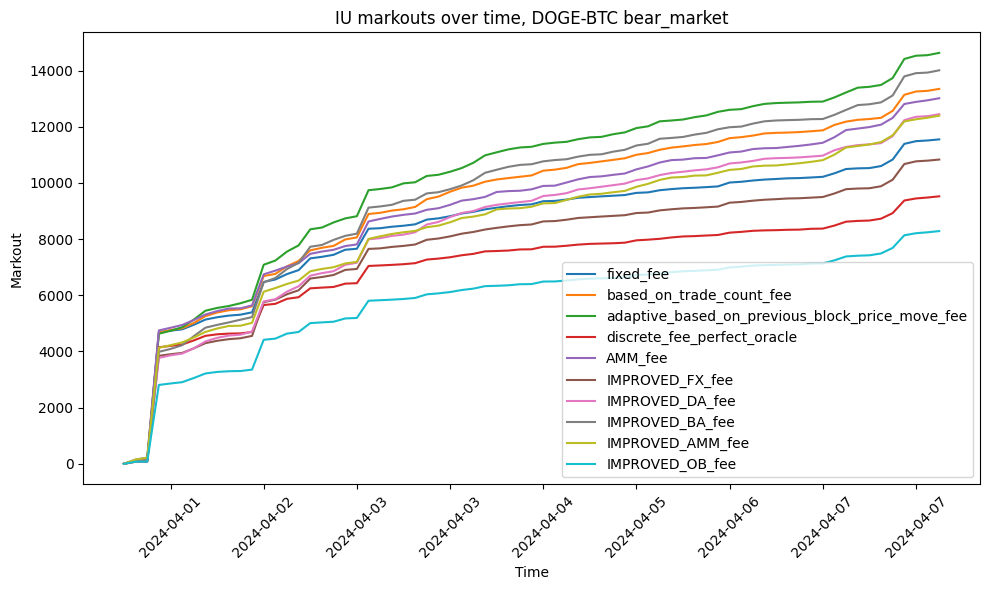

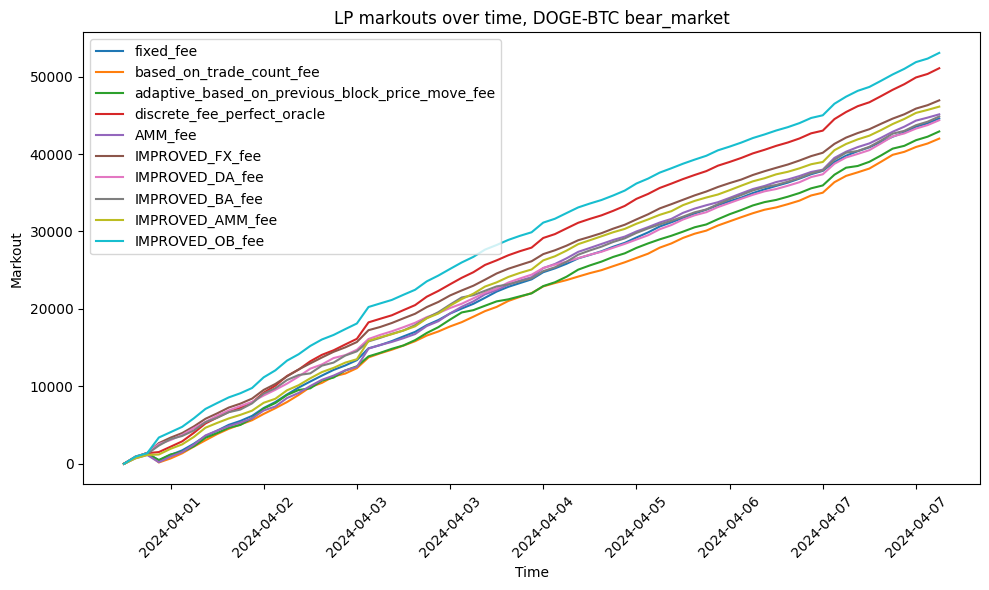

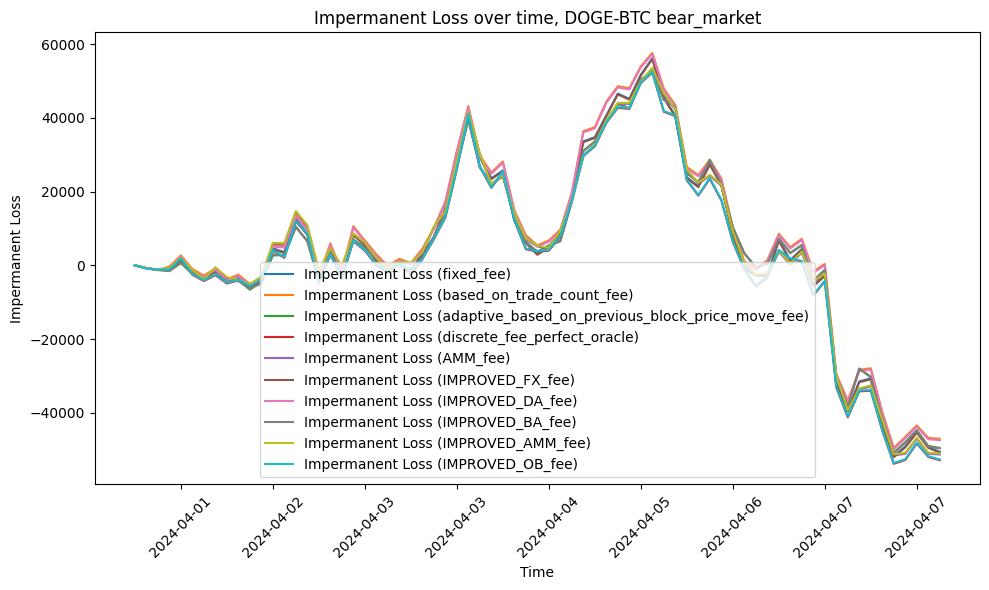

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,11552.20,1025,10.02,-55754.05,5238,-59.47,44594.78,21.33,-50599.57
1,based_on_trade_count_fee,13349.90,873,11.93,-55181.78,5222,-58.99,41993.31,20.44,-47072.62
2,adaptive_based_on_previous_block_price_move_fee,14632.25,779,13.70,-55787.79,5235,-59.49,42917.81,21.40,-49540.75
3,discrete_fee_perfect_oracle,9525.00,730,11.39,-56283.87,5236,-60.00,51081.93,28.79,-52867.42
4,AMM_fee,13017.06,749,13.05,-56543.65,5241,-60.24,45126.84,23.31,-51341.26
5,IMPROVED_FX_fee,10834.16,1025,9.50,-55754.35,5238,-59.47,46932.97,22.58,-50846.63
6,IMPROVED_DA_fee,12448.20,873,11.24,-55182.21,5222,-58.99,44371.19,21.72,-47430.42
7,IMPROVED_BA_fee,14011.61,779,13.25,-55729.16,5237,-59.40,44851.16,22.48,-49659.65
8,IMPROVED_AMM_fee,12396.90,751,12.50,-56543.00,5241,-60.24,46123.18,23.90,-51035.68
9,IMPROVED_OB_fee,8286.60,731,10.05,-56283.57,5236,-60.00,53063.96,30.11,-52663.34


In [49]:
plot_results_for_period(
    "DOGE-BTC bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

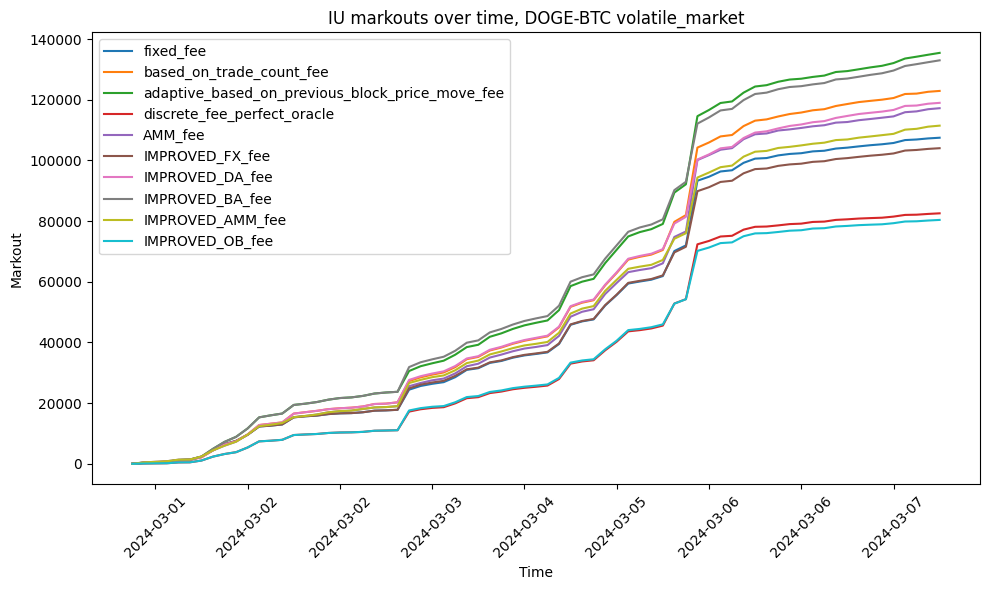

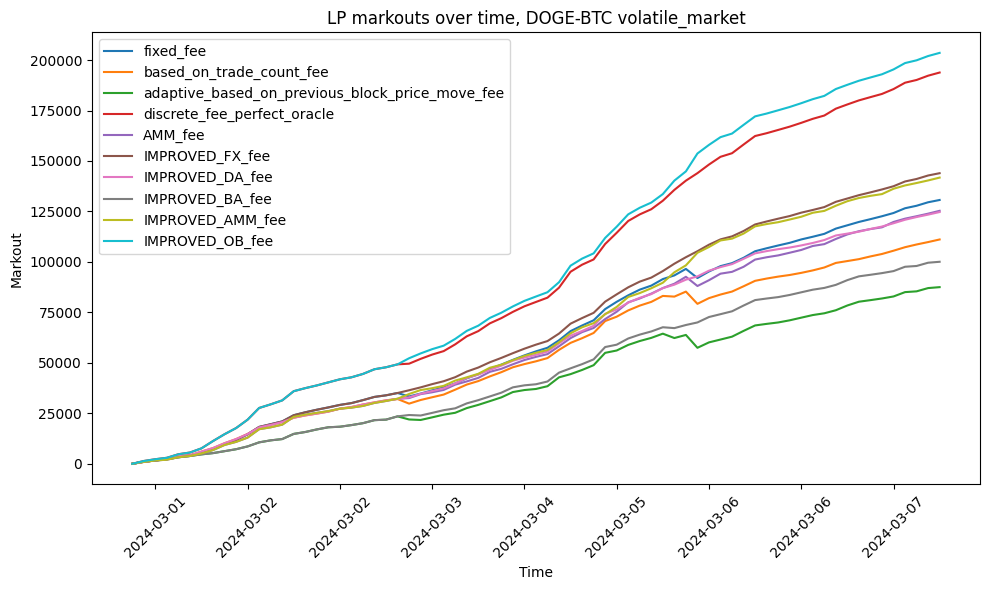

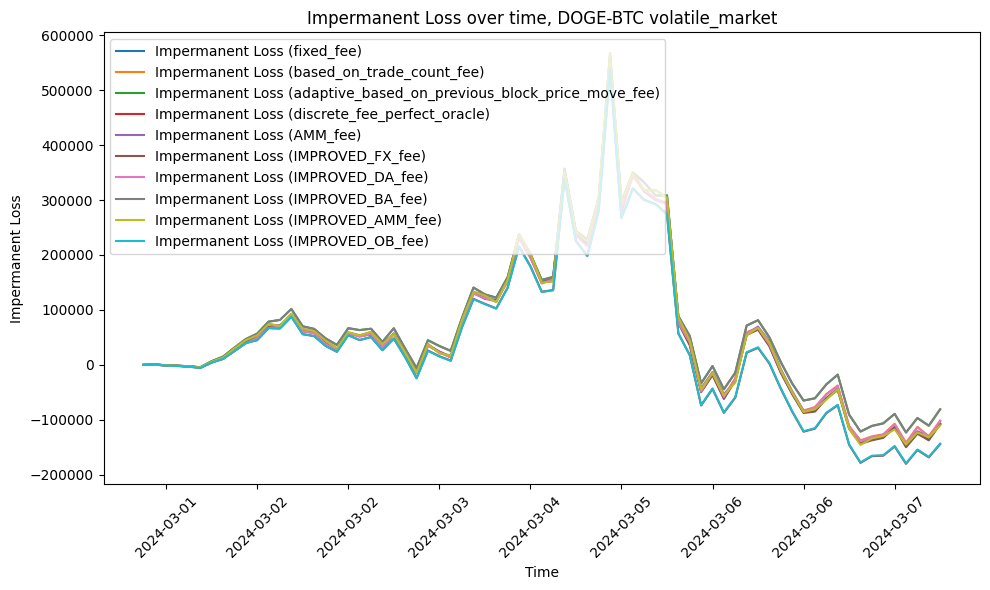

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,107494.45,4211,14.34,-64304.31,5212,-52.87,130685.36,15.00,-106713.41
1,based_on_trade_count_fee,122924.66,3449,17.15,-64215.07,5211,-52.82,111125.68,13.25,-101388.93
2,adaptive_based_on_previous_block_price_move_fee,135468.20,2945,20.04,-65681.67,5238,-53.76,87509.77,10.96,-80696.81
3,discrete_fee_perfect_oracle,82574.86,3358,14.38,-65141.77,5224,-53.40,193821.19,27.84,-144113.02
4,AMM_fee,117230.96,2931,18.86,-65657.07,5239,-53.74,125320.29,16.85,-108067.69
5,IMPROVED_FX_fee,104043.20,4212,14.01,-64292.89,5212,-52.86,143951.89,16.65,-107942.82
6,IMPROVED_DA_fee,118993.04,3449,16.77,-64220.02,5211,-52.82,124720.06,15.01,-102229.04
7,IMPROVED_BA_fee,133010.17,2950,19.86,-65663.84,5238,-53.74,100073.43,12.64,-80831.79
8,IMPROVED_AMM_fee,111477.66,2934,18.15,-65640.90,5239,-53.72,141775.81,19.25,-110105.30
9,IMPROVED_OB_fee,80401.02,3359,14.15,-65153.40,5224,-53.41,203556.11,29.49,-143265.33


In [50]:
plot_results_for_period(
    "DOGE-BTC volatile_market",
    list(fee_algos_to_consider.keys()),
)

### All results

In [51]:
import pandas as pd
from visualizations.compare_fee_algoritms import get_experiments_summary_by_description
from experiments.run_multiple_experiments import convert_experiment_key_to_dict

summaries = []
for key, result in experiment_results.items():
    desc = convert_experiment_key_to_dict(key)
    from visualizations.compare_fee_algoritms import get_single_experiment_summary

    summaries.append(desc | get_single_experiment_summary(result))

combined_df = (
    pd.DataFrame(summaries).round(2).sort_values(by=["period_alias", "fee_algorithm"])
)
combined_df = combined_df.set_index(["period_alias"])

display(combined_df)

,fee_algorithm,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
period_alias,,,,,,,,,,
BNB-ETH bear_market,AMM_fee,2063.23,270,7.94,-56658.12,5228,-58.12,32961.75,26.70,-37438.01
BNB-ETH bear_market,IMPROVED_AMM_fee,2038.87,270,7.85,-56658.20,5228,-58.12,33622.07,27.23,-37541.07
BNB-ETH bear_market,IMPROVED_BA_fee,2129.47,321,6.97,-56725.58,5215,-58.32,33666.59,26.34,-38069.17
BNB-ETH bear_market,IMPROVED_DA_fee,2230.18,291,7.93,-56725.04,5225,-58.22,32998.69,26.28,-37184.35
BNB-ETH bear_market,IMPROVED_FX_fee,2096.03,299,7.33,-57048.34,5243,-58.34,33436.26,26.45,-37694.17
...,...,...,...,...,...,...,...,...,...,...
USDC-USDP volatile_market,IMPROVED_OB_fee,45.45,45,1.17,-59215.81,5222,-56.92,30849.50,28.58,-32728.36
USDC-USDP volatile_market,adaptive_based_on_previous_block_price_move_fee,160.07,90,1.99,-59322.60,5223,-56.99,30599.27,27.28,-32866.47
USDC-USDP volatile_market,based_on_trade_count_fee,115.74,67,1.93,-59627.28,5233,-57.19,31051.96,28.16,-33135.11


In [52]:
# combined_df.to_markdown()

In [53]:
# Styled table (same as fee_algorithms_comparison.ipynb)

from pathlib import Path

df = combined_df.reset_index().round(2)

export_dir = Path("csv_export/historical_data")
export_dir.mkdir(parents=True, exist_ok=True)
df.to_csv(export_dir / "summary_all_pairs.csv", index=False)
print(f"Exported: {export_dir / 'summary_all_pairs.csv'}")


def highlight_periods(row):
    unique_periods = df["period_alias"].unique()
    colors = [
        "background-color: #f2f2f2;",
        "background-color: #d9eaf7;",
        "background-color: #eaf7d9;",
        "background-color: #fff6cc;",
    ]
    group_index = list(unique_periods).index(row["period_alias"])
    return [colors[group_index % len(colors)]] * len(row)


def make_numbers_bold(val):
    if isinstance(val, (int, float, str)):
        return "font-weight: bold; color: #000;"
    return ""


def format_numbers(val):
    if isinstance(val, (int, float)):
        return f"{val:.2f}"
    return val


styled_df = (
    df.style.apply(highlight_periods, axis=1)
    .applymap(make_numbers_bold)
    .format(format_numbers)
)
styled_df

Exported: csv_export/historical_data/summary_all_pairs.csv


/var/folders/wf/162bsgg10bbc8lvgn7cxh05r0000gn/T/ipykernel_85871/25060294.py:39: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(make_numbers_bold)


,period_alias,fee_algorithm,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,BNB-ETH bear_market,AMM_fee,2063.23,270.00,7.94,-56658.12,5228.00,-58.12,32961.75,26.70,-37438.01
1,BNB-ETH bear_market,IMPROVED_AMM_fee,2038.87,270.00,7.85,-56658.20,5228.00,-58.12,33622.07,27.23,-37541.07
2,BNB-ETH bear_market,IMPROVED_BA_fee,2129.47,321.00,6.97,-56725.58,5215.00,-58.32,33666.59,26.34,-38069.17
3,BNB-ETH bear_market,IMPROVED_DA_fee,2230.18,291.00,7.93,-56725.04,5225.00,-58.22,32998.69,26.28,-37184.35
4,BNB-ETH bear_market,IMPROVED_FX_fee,2096.03,299.00,7.33,-57048.34,5243.00,-58.34,33436.26,26.45,-37694.17
5,BNB-ETH bear_market,IMPROVED_OB_fee,1750.80,210.00,8.57,-56873.90,5231.00,-58.28,35078.92,29.72,-38537.58
6,BNB-ETH bear_market,adaptive_based_on_previous_block_price_move_fee,2130.60,321.00,6.98,-56725.52,5215.00,-58.32,33055.67,25.86,-37992.45
7,BNB-ETH bear_market,based_on_trade_count_fee,2135.57,291.00,7.59,-56725.04,5225.00,-58.22,32433.87,25.83,-37183.88
8,BNB-ETH bear_market,discrete_fee_perfect_oracle,1874.66,209.00,9.17,-56889.80,5231.00,-58.30,34342.04,29.10,-38391.90
9,BNB-ETH bear_market,fixed_fee,2012.84,299.00,7.04,-57048.34,5243.00,-58.34,32922.22,26.05,-37693.37
